In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd

Mounted at /content/drive


* ageGroupFemaleConsumption：各年齡層女性持卡人於各行業別總簽帳金額及筆數
* ageGroupMaleConsumption：各年齡層男性持卡人於各行業別總簽帳金額及筆數
* incomeGroupMaleConsumption：各年收入族群男性持卡人於各行業別總簽帳金額及筆數
* incomeGroupFemaleConsumption：各年收入族群女性持卡人於各行業別總簽帳金額及筆數
* educationLevelMaleConsumption：各教育程度男性持卡人於六都消費樣態
* educationLevelFemaleConsumption：各教育程度女性持卡人於六都消費樣態

### 讀取資料

In [ ]:
ageGroupFemaleConsumption=pd.read_csv('/content/drive/MyDrive/碩一上課堂/1131_fintech/finalProject/各年齡層女性持卡人於各行業別總簽帳金額及筆數 .CSV')
ageGroupMaleConsumption=pd.read_csv('/content/drive/MyDrive/碩一上課堂/1131_fintech/finalProject/各年齡層男性持卡人於各行業別總簽帳金額及筆數 .CSV')
incomeGroupFemaleConsumption=pd.read_csv('/content/drive/MyDrive/碩一上課堂/1131_fintech/finalProject/各年收入族群女性持卡人於各行業別總簽帳金額及筆數 .CSV')
incomeGroupMaleConsumption=pd.read_csv('/content/drive/MyDrive/碩一上課堂/1131_fintech/finalProject/各年收入族群男性持卡人於各行業別總簽帳金額及筆數 .CSV')
educationLevelFeMaleConsumption=pd.read_csv('/content/drive/MyDrive/碩一上課堂/1131_fintech/finalProject/各教育程度女性持卡人於六都消費樣態 .CSV')
educationLevelMaleConsumption=pd.read_csv('/content/drive/MyDrive/碩一上課堂/1131_fintech/finalProject/各教育程度男性持卡人於六都消費樣態 .CSV')

## 資料前處理

### 去除「地區」資料、合併「性別資料」、按月排序

In [ ]:
# 去除地區資料
for df in [ageGroupFemaleConsumption, ageGroupMaleConsumption, incomeGroupFemaleConsumption, incomeGroupMaleConsumption, educationLevelFeMaleConsumption, educationLevelMaleConsumption]:
    if '地區' in df.columns:
        df.drop(columns=['地區'], inplace=True)

# 合併男性與女性資料並按年月排序
ageGroupCombined = pd.concat([ageGroupFemaleConsumption, ageGroupMaleConsumption], ignore_index=True)
incomeGroupCombined = pd.concat([incomeGroupFemaleConsumption, incomeGroupMaleConsumption], ignore_index=True)
educationLevelCombined = pd.concat([educationLevelFeMaleConsumption, educationLevelMaleConsumption], ignore_index=True)

# 將年月轉為datetime格式並排序
for df in [ageGroupCombined, incomeGroupCombined, educationLevelCombined]:
    df['年月'] = pd.to_datetime(df['年月'], format='%Y%m')
    df.sort_values(by='年月', inplace=True)

### 轉換成英文


In [ ]:
# Translate column names and specific contents to English
def translate_columns_and_content(df, category):
    # Translate column names
    column_translation = {
        '年月': 'Date',
        '信用卡產業別': 'Industry',
        '性別': 'Gender',
        '年齡層': 'Age Group',
        '年收入': 'Income Group',
        '教育程度類別': 'Education Level',
        '信用卡交易筆數': 'Transaction Count',
        '信用卡交易金額[新臺幣]': 'Transaction Amount (NTD)'
    }
    df.rename(columns=column_translation, inplace=True)

    # Translate Gender
    df['Gender'] = df['Gender'].replace({1: 'Male', 2: 'Female'})

    # Category-specific translations
    if category == 'Age Group':
        age_translation = {
            '未滿20歲': 'Under 20',
            '20(含)-25歲': '20-25',
            '25(含)-30歲': '25-30',
            '30(含)-35歲': '30-35',
            '35(含)-40歲': '35-40',
            '40(含)-45歲': '40-45',
            '45(含)-50歲': '45-50',
            '50(含)-55歲': '50-55',
            '55(含)-60歲': '55-60',
            '60(含)-65歲': '60-65',
            '65(含)-70歲': '65-70',
            '70(含)-75歲': '70-75',
            '75(含)-80歲': '75-80',
            '80(含)歲以上': 'Above 80'
        }
        df['Age Group'] = df['Age Group'].replace(age_translation)
    elif category == 'Income Group':
        income_translation = {
            '未達50萬': 'Below 500k',
            '50(含)-75萬': '500k-750k',
            '75(含)-100萬': '750k-1M',
            '100(含)-125萬': '1M-1.25M',
            '125(含)-150萬': '1.25M-1.5M',
            '150(含)-175萬': '1.5M-1.75M',
            '175(含)-200萬': '1.75M-2M',
            '200(含)萬以上': 'Above 2M'
        }
        df['Income Group'] = df['Income Group'].replace(income_translation)
    elif category == 'Education Level':
        education_translation = {
            '博士': 'Doctorate',
            '碩士': 'Master',
            '大學': 'Bachelor',
            '專科': 'Associate',
            '高中高職': 'High School',
            '其他': 'Other'
        }
        df['Education Level'] = df['Education Level'].replace(education_translation)

    return df


# Apply translation to each DataFrame
ageGroupCombined = translate_columns_and_content(ageGroupCombined, 'Age Group')
incomeGroupCombined = translate_columns_and_content(incomeGroupCombined, 'Income Group')
educationLevelCombined = translate_columns_and_content(educationLevelCombined, 'Education Level')

In [ ]:
ageGroupCombined

,Date,Industry,Gender,Age Group,Transaction Count,Transaction Amount (NTD)
0,2014-01-01,食,Female,Under 20,6367,5630047
12556,2014-01-01,食,Male,75-80,36983,59655595
12557,2014-01-01,食,Male,Above 80,30221,52358455
12558,2014-01-01,衣,Male,Under 20,1225,3372107
12559,2014-01-01,衣,Male,20-25,18667,47403285
...,...,...,...,...,...,...
12514,2024-08-01,文教康樂,Female,75-80,14103,118381107
12515,2024-08-01,文教康樂,Female,Above 80,7022,52667892
12516,2024-08-01,百貨,Female,Under 20,242728,161364361
12518,2024-08-01,百貨,Female,25-30,3178874,3034562989


In [ ]:
incomeGroupCombined

,Date,Industry,Gender,Income Group,Transaction Count,Transaction Amount (NTD)
0,2014-01-01,食,Female,Below 500k,4602444,6589392709
7178,2014-01-01,衣,Male,750k-1M,69409,195212721
7177,2014-01-01,衣,Male,500k-750k,167294,449058900
7176,2014-01-01,衣,Male,Below 500k,241377,643675362
7175,2014-01-01,食,Male,Above 2M,261193,912427601
...,...,...,...,...,...,...
7143,2024-08-01,行,Female,Above 2M,531201,778191525
7142,2024-08-01,行,Female,1.75M-2M,118659,137239443
7141,2024-08-01,行,Female,1.5M-1.75M,209030,279408938
7139,2024-08-01,行,Female,1M-1.25M,571821,664353856


In [ ]:
educationLevelCombined

,Date,Industry,Gender,Education Level,Transaction Count,Transaction Amount (NTD)
0,2014-01-01,食,Female,Doctorate,17328,23014654
32332,2014-01-01,百貨,Male,High School,15146,64613060
32331,2014-01-01,百貨,Male,Associate,15134,54999974
32330,2014-01-01,百貨,Male,Bachelor,37657,147525955
32329,2014-01-01,百貨,Male,Master,15070,55733574
...,...,...,...,...,...,...
32165,2024-08-01,百貨,Female,Other,318001,532201566
32164,2024-08-01,百貨,Female,High School,416935,828824990
32163,2024-08-01,百貨,Female,Associate,314957,612001223
32176,2024-08-01,食,Female,High School,78114,89943810


### 進行one-hot encoding 轉換

In [ ]:
# Define a unified function for one-hot encoding
def one_hot_encode_column(df, column_name, prefix, translation_dict=None):
    """
    One-hot encodes a specified column with an optional translation dictionary.

    Args:
    - df (pd.DataFrame): The DataFrame to modify.
    - column_name (str): The name of the column to one-hot encode.
    - prefix (str): Prefix for the one-hot encoded columns.
    - translation_dict (dict): Optional. A dictionary to translate values before encoding.

    Returns:
    - pd.DataFrame: Updated DataFrame with one-hot encoded columns.
    """
    if translation_dict:
        df[column_name] = df[column_name].replace(translation_dict)

    # One-hot encode and concatenate with the DataFrame
    df = pd.concat([df, pd.get_dummies(df[column_name], prefix=prefix)], axis=1)
    df.drop(columns=[column_name], inplace=True)  # Remove the original column
    return df

# Translation dictionaries
industry_translation = {
    '食': 'Food',
    '衣': 'Clothing',
    '住': 'Housing',
    '行': 'Transportation',
    '文教康樂': 'Education_Entertainment',
    '百貨': 'Department_Store',
    '其他': 'Others'
}

# Apply one-hot encoding to 'Industry' column with translation
ageGroupCombined = one_hot_encode_column(ageGroupCombined, 'Industry', 'Industry', industry_translation)
incomeGroupCombined = one_hot_encode_column(incomeGroupCombined, 'Industry', 'Industry', industry_translation)
educationLevelCombined = one_hot_encode_column(educationLevelCombined, 'Industry', 'Industry', industry_translation)

# Apply one-hot encoding to 'Gender' column
ageGroupCombined = one_hot_encode_column(ageGroupCombined, 'Gender', 'Gender')
incomeGroupCombined = one_hot_encode_column(incomeGroupCombined, 'Gender', 'Gender')
educationLevelCombined = one_hot_encode_column(educationLevelCombined, 'Gender', 'Gender')

# Apply one-hot encoding to 'Age Group', 'Income Group', and 'Education Level' columns
ageGroupCombined = one_hot_encode_column(ageGroupCombined, 'Age Group', 'AgeGroup')
incomeGroupCombined = one_hot_encode_column(incomeGroupCombined, 'Income Group', 'IncomeGroup')
educationLevelCombined = one_hot_encode_column(educationLevelCombined, 'Education Level', 'EducationLevel')

In [ ]:
ageGroupCombined

,Date,Transaction Count,Transaction Amount (NTD),Industry_Clothing,Industry_Department_Store,Industry_Education_Entertainment,Industry_Food,Industry_Housing,Industry_Others,Industry_Transportation,...,AgeGroup_40-45,AgeGroup_45-50,AgeGroup_50-55,AgeGroup_55-60,AgeGroup_60-65,AgeGroup_65-70,AgeGroup_70-75,AgeGroup_75-80,AgeGroup_Above 80,AgeGroup_Under 20
0,2014-01-01,6367,5630047,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,True
12556,2014-01-01,36983,59655595,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,True,False,False
12557,2014-01-01,30221,52358455,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,True,False
12558,2014-01-01,1225,3372107,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
12559,2014-01-01,18667,47403285,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12514,2024-08-01,14103,118381107,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
12515,2024-08-01,7022,52667892,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
12516,2024-08-01,242728,161364361,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
12518,2024-08-01,3178874,3034562989,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
incomeGroupCombined

,Date,Transaction Count,Transaction Amount (NTD),Industry_Clothing,Industry_Department_Store,Industry_Education_Entertainment,Industry_Food,Industry_Housing,Industry_Others,Industry_Transportation,Gender_Female,Gender_Male,IncomeGroup_1.25M-1.5M,IncomeGroup_1.5M-1.75M,IncomeGroup_1.75M-2M,IncomeGroup_1M-1.25M,IncomeGroup_500k-750k,IncomeGroup_750k-1M,IncomeGroup_Above 2M,IncomeGroup_Below 500k
0,2014-01-01,4602444,6589392709,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,True
7178,2014-01-01,69409,195212721,True,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False
7177,2014-01-01,167294,449058900,True,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False
7176,2014-01-01,241377,643675362,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True
7175,2014-01-01,261193,912427601,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7143,2024-08-01,531201,778191525,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False,True,False
7142,2024-08-01,118659,137239443,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False,False,False
7141,2024-08-01,209030,279408938,False,False,False,False,False,False,True,True,False,False,True,False,False,False,False,False,False
7139,2024-08-01,571821,664353856,False,False,False,False,False,False,True,True,False,False,False,False,True,False,False,False,False


In [ ]:
educationLevelCombined

,Date,Transaction Count,Transaction Amount (NTD),Industry_Clothing,Industry_Department_Store,Industry_Education_Entertainment,Industry_Food,Industry_Housing,Industry_Others,Industry_Transportation,Gender_Female,Gender_Male,EducationLevel_Associate,EducationLevel_Bachelor,EducationLevel_Doctorate,EducationLevel_High School,EducationLevel_Master,EducationLevel_Other
0,2014-01-01,17328,23014654,False,False,False,True,False,False,False,True,False,False,False,True,False,False,False
32332,2014-01-01,15146,64613060,False,True,False,False,False,False,False,False,True,False,False,False,True,False,False
32331,2014-01-01,15134,54999974,False,True,False,False,False,False,False,False,True,True,False,False,False,False,False
32330,2014-01-01,37657,147525955,False,True,False,False,False,False,False,False,True,False,True,False,False,False,False
32329,2014-01-01,15070,55733574,False,True,False,False,False,False,False,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32165,2024-08-01,318001,532201566,False,True,False,False,False,False,False,True,False,False,False,False,False,False,True
32164,2024-08-01,416935,828824990,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False
32163,2024-08-01,314957,612001223,False,True,False,False,False,False,False,True,False,True,False,False,False,False,False
32176,2024-08-01,78114,89943810,False,False,False,True,False,False,False,True,False,False,False,False,True,False,False


### 刪除「industry==’other’」之instances

In [ ]:
# Function to remove rows where 'Industry_Others' is True
def remove_industry_others(df):
    if 'Industry_Others' in df.columns:
        df = df[df['Industry_Others'] != 1]
    return df

# Apply the function to each DataFrame
ageGroupCombined = remove_industry_others(ageGroupCombined)
incomeGroupCombined = remove_industry_others(incomeGroupCombined)
educationLevelCombined = remove_industry_others(educationLevelCombined)

### 資料前處理小結

In [ ]:
# 顯示數據的基本資訊，包括欄位名稱和非空值數量
print("Info about ageGroupCombined:")
print(ageGroupCombined.info())

# 顯示數值型特徵的統計摘要
print("Statistical summary of ageGroupCombined:")
print(ageGroupCombined.describe())


Info about ageGroupCombined:
<class 'pandas.core.frame.DataFrame'>
Index: 21504 entries, 0 to 12518
Data columns (total 26 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Date                              21504 non-null  datetime64[ns]
 1   Transaction Count                 21504 non-null  int64         
 2   Transaction Amount (NTD)          21504 non-null  int64         
 3   Industry_Clothing                 21504 non-null  bool          
 4   Industry_Department_Store         21504 non-null  bool          
 5   Industry_Education_Entertainment  21504 non-null  bool          
 6   Industry_Food                     21504 non-null  bool          
 7   Industry_Housing                  21504 non-null  bool          
 8   Industry_Others                   21504 non-null  bool          
 9   Industry_Transportation           21504 non-null  bool          
 10  Gender_Female         

In [ ]:
# 顯示 incomeGroupCombined 的基本資訊
print("Info about incomeGroupCombined:")
print(incomeGroupCombined.info())

# 顯示 incomeGroupCombined 的數值型特徵統計摘要
print("Statistical summary of incomeGroupCombined:")
print(incomeGroupCombined.describe())

# 顯示 educationLevelCombined 的基本資訊
print("Info about educationLevelCombined:")
print(educationLevelCombined.info())

# 顯示 educationLevelCombined 的數值型特徵統計摘要
print("Statistical summary of educationLevelCombined:")
print(educationLevelCombined.describe())


Info about incomeGroupCombined:
<class 'pandas.core.frame.DataFrame'>
Index: 12288 entries, 0 to 7139
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Date                              12288 non-null  datetime64[ns]
 1   Transaction Count                 12288 non-null  int64         
 2   Transaction Amount (NTD)          12288 non-null  int64         
 3   Industry_Clothing                 12288 non-null  bool          
 4   Industry_Department_Store         12288 non-null  bool          
 5   Industry_Education_Entertainment  12288 non-null  bool          
 6   Industry_Food                     12288 non-null  bool          
 7   Industry_Housing                  12288 non-null  bool          
 8   Industry_Others                   12288 non-null  bool          
 9   Industry_Transportation           12288 non-null  bool          
 10  Gender_Female       

## 資料探索


In [ ]:
# 定義 ageGroupCombined 的 features
ageGroupCombined_features = [
    "Date",
    "Transaction Count",
    "Transaction Amount (NTD)",
    "Industry_Clothing",
    "Industry_Department_Store",
    "Industry_Education_Entertainment",
    "Industry_Food",
    "Industry_Housing",
    "Industry_Others",
    "Industry_Transportation",
    "Gender_Female",
    "Gender_Male",
    "AgeGroup_20-25",
    "AgeGroup_25-30",
    "AgeGroup_30-35",
    "AgeGroup_35-40",
    "AgeGroup_40-45",
    "AgeGroup_45-50",
    "AgeGroup_50-55",
    "AgeGroup_55-60",
    "AgeGroup_60-65",
    "AgeGroup_65-70",
    "AgeGroup_70-75",
    "AgeGroup_75-80",
    "AgeGroup_Above 80",
    "AgeGroup_Under 20"
]

# 定義 incomeGroupCombined 的 features
incomeGroupCombined_features = [
    "Date",
    "Transaction Count",
    "Transaction Amount (NTD)",
    "Industry_Clothing",
    "Industry_Department_Store",
    "Industry_Education_Entertainment",
    "Industry_Food",
    "Industry_Housing",
    "Industry_Others",
    "Industry_Transportation",
    "Gender_Female",
    "Gender_Male",
    "IncomeGroup_1.25M-1.5M",
    "IncomeGroup_1.5M-1.75M",
    "IncomeGroup_1.75M-2M",
    "IncomeGroup_1M-1.25M",
    "IncomeGroup_500k-750k",
    "IncomeGroup_750k-1M",
    "IncomeGroup_Above 2M",
    "IncomeGroup_Below 500k"
]

# 定義 educationLevelCombined 的 features
educationLevelCombined_features = [
    "Date",
    "Transaction Count",
    "Transaction Amount (NTD)",
    "Industry_Clothing",
    "Industry_Department_Store",
    "Industry_Education_Entertainment",
    "Industry_Food",
    "Industry_Housing",
    "Industry_Others",
    "Industry_Transportation",
    "Gender_Female",
    "Gender_Male",
    "EducationLevel_Associate",
    "EducationLevel_Bachelor",
    "EducationLevel_Doctorate",
    "EducationLevel_High School",
    "EducationLevel_Master",
    "EducationLevel_Other"
]

# 顯示三個表格的 features
print("AgeGroupCombined Features:")
print(ageGroupCombined_features)

print("\nIncomeGroupCombined Features:")
print(incomeGroupCombined_features)

print("\nEducationLevelCombined Features:")
print(educationLevelCombined_features)


AgeGroupCombined Features:
['Date', 'Transaction Count', 'Transaction Amount (NTD)', 'Industry_Clothing', 'Industry_Department_Store', 'Industry_Education_Entertainment', 'Industry_Food', 'Industry_Housing', 'Industry_Others', 'Industry_Transportation', 'Gender_Female', 'Gender_Male', 'AgeGroup_20-25', 'AgeGroup_25-30', 'AgeGroup_30-35', 'AgeGroup_35-40', 'AgeGroup_40-45', 'AgeGroup_45-50', 'AgeGroup_50-55', 'AgeGroup_55-60', 'AgeGroup_60-65', 'AgeGroup_65-70', 'AgeGroup_70-75', 'AgeGroup_75-80', 'AgeGroup_Above 80', 'AgeGroup_Under 20']

IncomeGroupCombined Features:
['Date', 'Transaction Count', 'Transaction Amount (NTD)', 'Industry_Clothing', 'Industry_Department_Store', 'Industry_Education_Entertainment', 'Industry_Food', 'Industry_Housing', 'Industry_Others', 'Industry_Transportation', 'Gender_Female', 'Gender_Male', 'IncomeGroup_1.25M-1.5M', 'IncomeGroup_1.5M-1.75M', 'IncomeGroup_1.75M-2M', 'IncomeGroup_1M-1.25M', 'IncomeGroup_500k-750k', 'IncomeGroup_750k-1M', 'IncomeGroup_Above

## 各變數與交易金額之相關性與分佈

### 年齡-交易金額

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_correlation_heatmap(corr_matrix, column_order, title, cmap='Greens', vmin=-0.3, vmax=0.7):
    """
    繪製相關性熱圖，並按照指定順序重新排列列。

    Args:
    - corr_matrix (pd.DataFrame): 相關性矩陣數據。
    - column_order (list): 按順序排列的列名稱。
    - title (str): 圖表標題。
    - cmap (str): 熱圖的配色方案。
    - vmin, vmax (float): 顏色範圍（默認為 -0.3 到 0.7）。

    Returns:
    - None: 繪製熱圖。
    """
    # 重新排序列
    ordered_corr_matrix = corr_matrix.loc[["Transaction Amount (NTD)"], column_order]

    # 繪製熱圖
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        ordered_corr_matrix,
        annot=True,
        cmap=cmap,
        cbar_kws={'label': 'Correlation'},
        vmin=vmin,
        vmax=vmax
    )
    plt.title(title)
    plt.show()


In [ ]:
def plot_total_amount_bar(data, column_order, title, color='lightgreen'):
    """
    繪製總交易金額的柱狀圖，並按照指定順序重新排列。

    Args:
    - data (pd.Series): 總交易金額數據。
    - column_order (list): 按順序排列的索引名稱。
    - title (str): 圖表標題。
    - color (str): 柱狀圖的顏色。

    Returns:
    - None: 繪製柱狀圖。
    """
    # 按順序重新排列數據
    ordered_data = data.reindex(column_order)

    # 繪製柱狀圖
    plt.figure(figsize=(12, 6))
    ordered_data.plot(kind='bar', color=color, title=title)
    plt.ylabel("Total Transaction Amount (NTD)")
    plt.xlabel("Income Group")
    plt.xticks(rotation=45)
    plt.show()


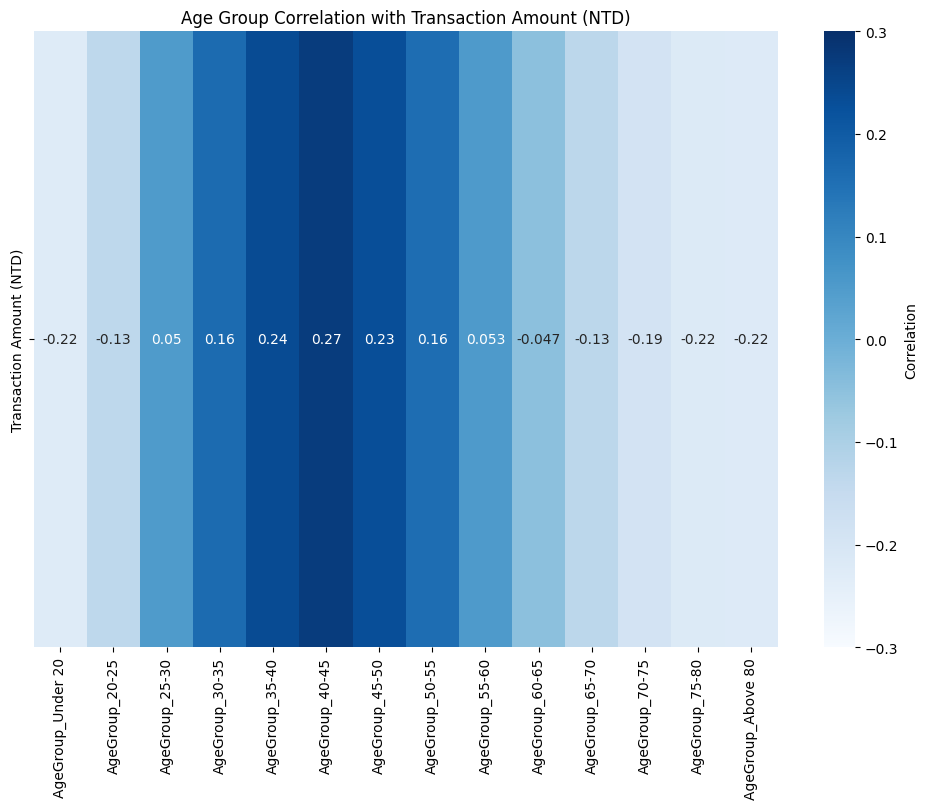

In [ ]:
# 按指定順序排列年齡層
ageGroup_order = [
    "AgeGroup_Under 20", "AgeGroup_20-25", "AgeGroup_25-30",
    "AgeGroup_30-35", "AgeGroup_35-40", "AgeGroup_40-45",
    "AgeGroup_45-50", "AgeGroup_50-55", "AgeGroup_55-60",
    "AgeGroup_60-65", "AgeGroup_65-70", "AgeGroup_70-75",
    "AgeGroup_75-80", "AgeGroup_Above 80"
]


# 計算總交易金額
ageGroup_total = ageGroupCombined[ageGroup_order].mul(
    ageGroupCombined["Transaction Amount (NTD)"], axis=0
).sum()

# 重新排列相關性矩陣
# 計算相關性矩陣
ageGroup_corr = ageGroupCombined.corr()

# 重新排列相關性矩陣
ageGroup_corr_ordered = ageGroup_corr.loc[
    ["Transaction Amount (NTD)"], ageGroup_order
]

# 繪製熱圖
plt.figure(figsize=(12, 8))
sns.heatmap(
    ageGroup_corr_ordered,
    annot=True,
    cmap='Blues',  # 單一藍色漸變
    cbar_kws={'label': 'Correlation'},  # 加入色條標籤
    vmin=-0.3, vmax=0.3  # 可調整範圍，讓漸變顯示更平滑
)
plt.title("Age Group Correlation with Transaction Amount (NTD)")
plt.show()


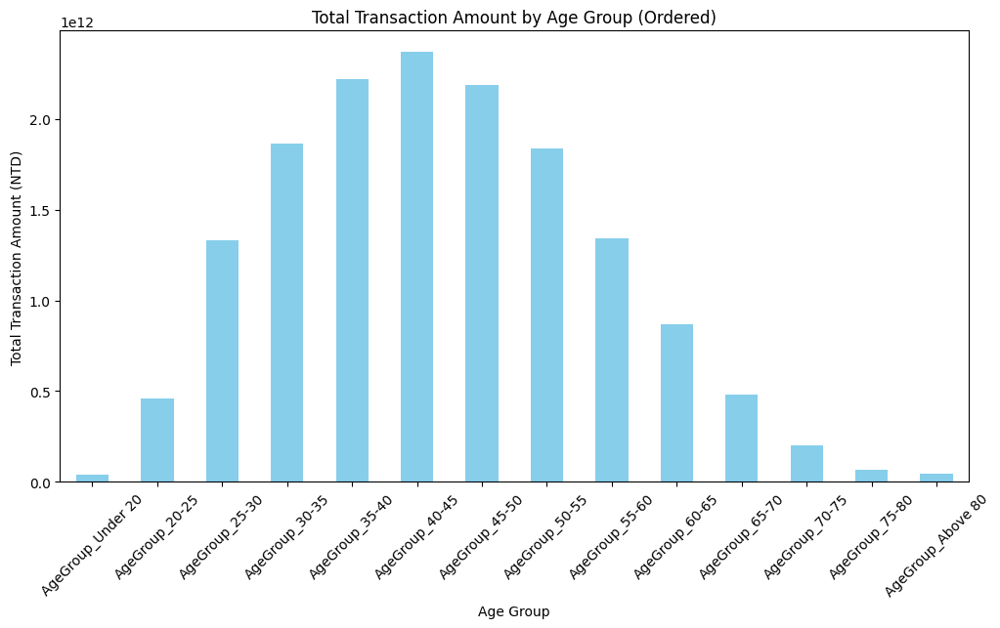

In [ ]:
# 重新排序年齡層的總額數據
ageGroup_total_ordered = ageGroup_total.reindex(ageGroup_order)

# 繪製總額柱狀圖
ageGroup_total_ordered.plot(kind='bar', figsize=(12, 6), color='skyblue', title="Total Transaction Amount by Age Group (Ordered)")
plt.ylabel("Total Transaction Amount (NTD)")
plt.xlabel("Age Group")
plt.xticks(rotation=45)
plt.show()


### 收入-交易金額

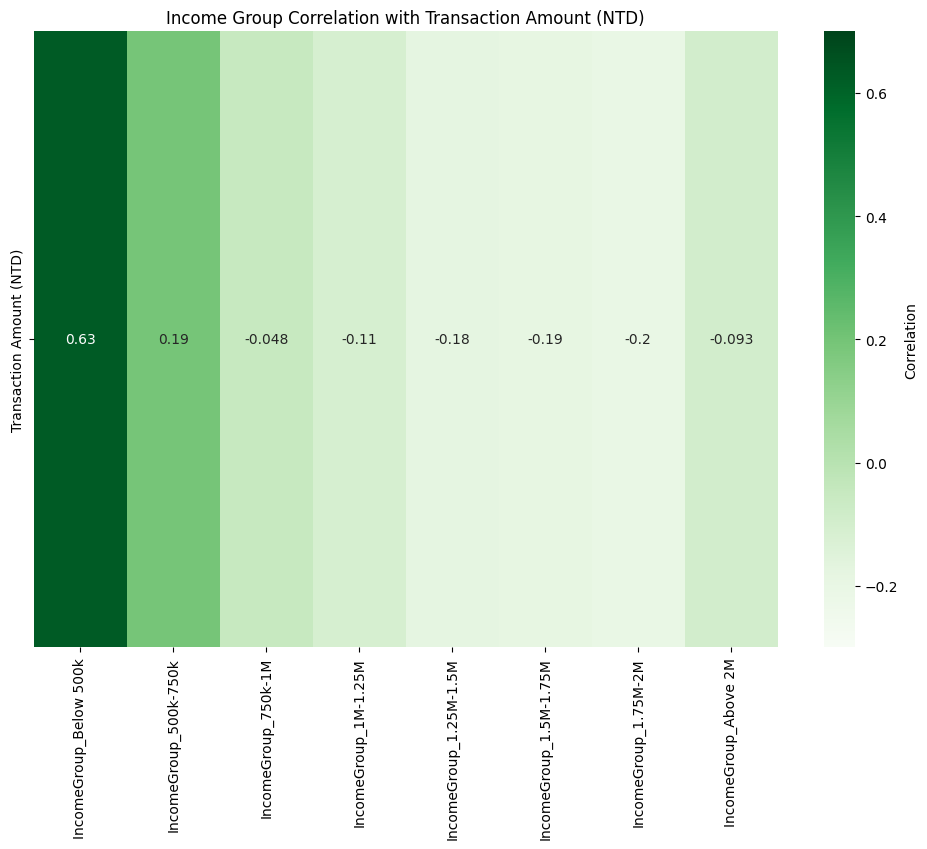

In [ ]:
# 定義新的收入分組順序
incomeGroup_order = [
    "IncomeGroup_Below 500k", "IncomeGroup_500k-750k", "IncomeGroup_750k-1M",
    "IncomeGroup_1M-1.25M", "IncomeGroup_1.25M-1.5M", "IncomeGroup_1.5M-1.75M",
    "IncomeGroup_1.75M-2M", "IncomeGroup_Above 2M"
]

incomeGroup_total = incomeGroupCombined[incomeGroup_order].mul(
    incomeGroupCombined["Transaction Amount (NTD)"], axis=0
).sum()


# 計算相關性矩陣
incomeGroup_corr = incomeGroupCombined.corr()

# 重新排列相關性矩陣
incomeGroup_corr_ordered = incomeGroup_corr.loc[
    ["Transaction Amount (NTD)"], incomeGroup_order
]

# 繪製相關性熱圖
plt.figure(figsize=(12, 8))
sns.heatmap(
    incomeGroup_corr_ordered,
    annot=True,
    cmap='Greens',  # 單一綠色漸變
    cbar_kws={'label': 'Correlation'},  # 加入色條標籤
    vmin=-0.3, vmax=0.7  # 可調整範圍
)
plt.title("Income Group Correlation with Transaction Amount (NTD)")
plt.show()



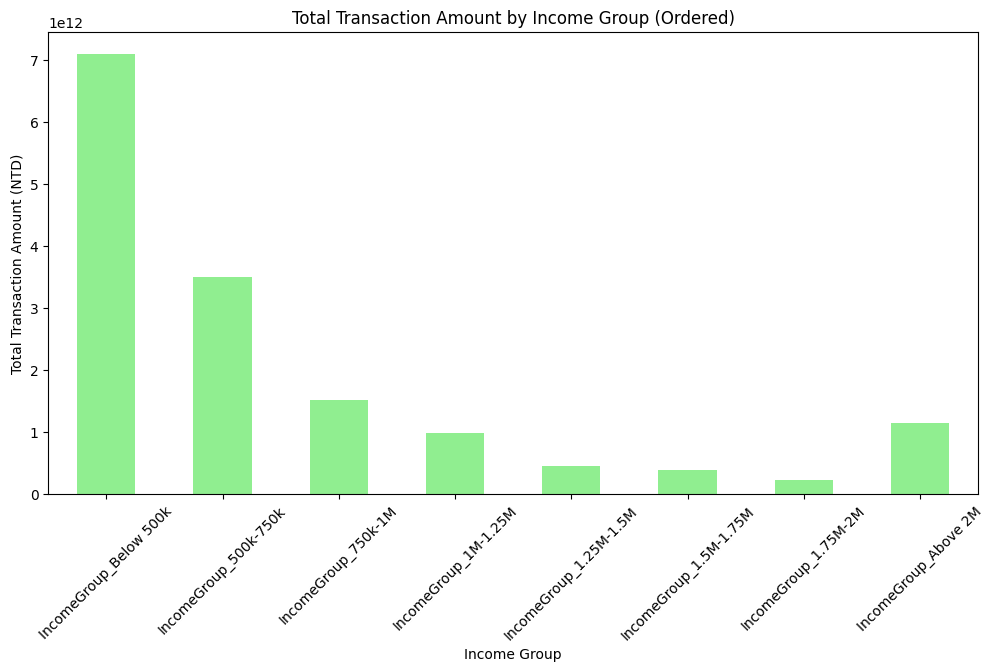

In [ ]:
# 重新排序收入分組的總額數據
incomeGroup_total_ordered = incomeGroup_total.reindex(incomeGroup_order)

# 繪製總額柱狀圖，使用淺綠色
incomeGroup_total_ordered.plot(kind='bar', figsize=(12, 6), color='lightgreen', title="Total Transaction Amount by Income Group (Ordered)")
plt.ylabel("Total Transaction Amount (NTD)")
plt.xlabel("Income Group")
plt.xticks(rotation=45)
plt.show()


### 教育程度-交易金額

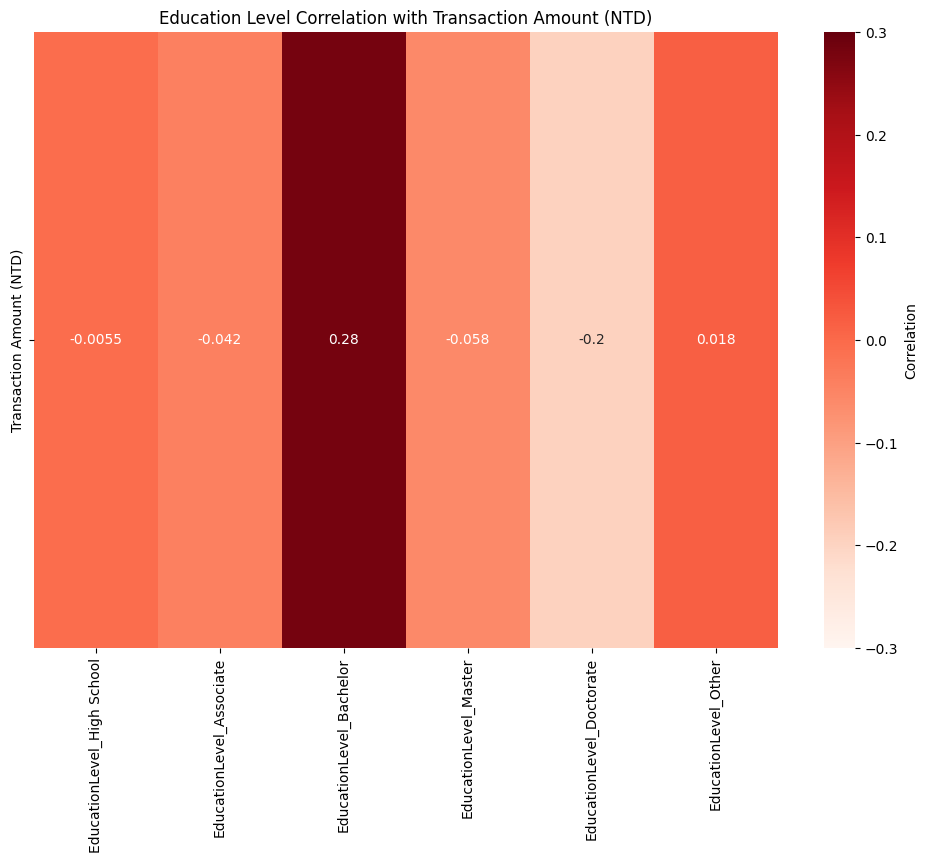

In [ ]:
# 定義教育程度的新順序
educationLevel_order = [
    "EducationLevel_High School", "EducationLevel_Associate",
    "EducationLevel_Bachelor", "EducationLevel_Master",
    "EducationLevel_Doctorate", "EducationLevel_Other"
]

# 計算總交易金額
educationLevel_total = educationLevelCombined[educationLevel_order].mul(
    educationLevelCombined["Transaction Amount (NTD)"], axis=0
).sum()

# 計算相關性矩陣
educationLevel_corr = educationLevelCombined.corr()

# 重新排列相關性矩陣
educationLevel_corr_ordered = educationLevel_corr.loc[
    ["Transaction Amount (NTD)"], educationLevel_order
]

# 繪製相關性熱圖
plt.figure(figsize=(12, 8))
sns.heatmap(
    educationLevel_corr_ordered,
    annot=True,
    cmap='Reds',  # 單一紅色漸變
    cbar_kws={'label': 'Correlation'},
    vmin=-0.3, vmax=0.3  # 可調整範圍
)
plt.title("Education Level Correlation with Transaction Amount (NTD)")
plt.show()



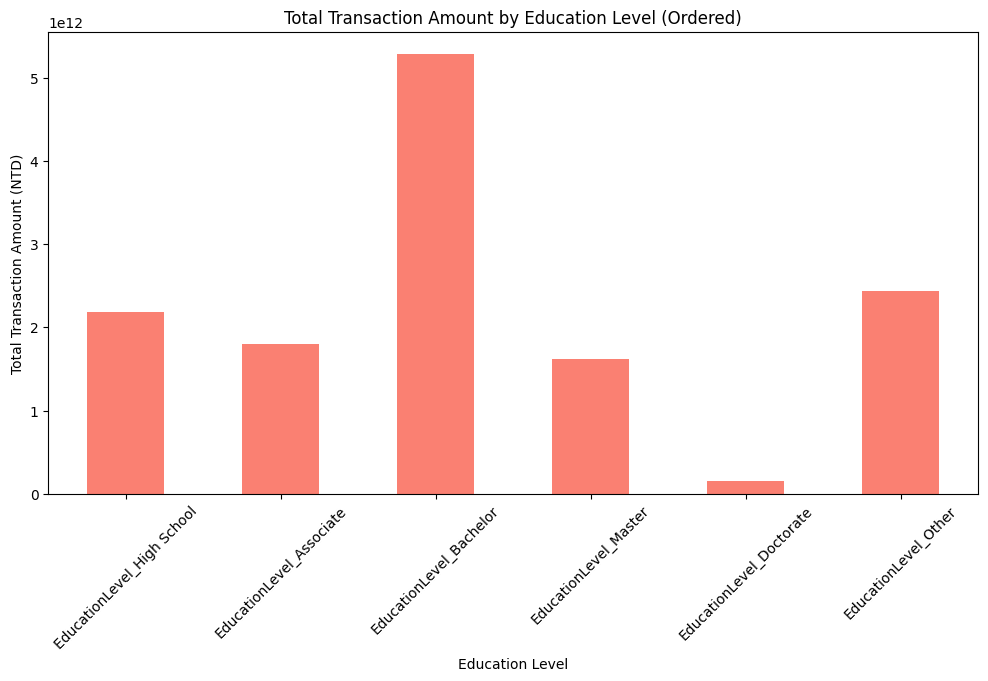

In [ ]:
# 重新排序教育程度的總額數據
educationLevel_total_ordered = educationLevel_total.reindex(educationLevel_order)

# 繪製總額柱狀圖，使用淺紅色
educationLevel_total_ordered.plot(kind='bar', figsize=(12, 6), color='salmon', title="Total Transaction Amount by Education Level (Ordered)")
plt.ylabel("Total Transaction Amount (NTD)")
plt.xlabel("Education Level")
plt.xticks(rotation=45)
plt.show()


## 各產業與交易金額之相關性與分佈

In [ ]:
industry_order = [
    "Industry_Food", "Industry_Clothing", "Industry_Housing",
    "Industry_Transportation", "Industry_Education_Entertainment",
    "Industry_Department_Store"
]

In [ ]:
def plot_industry_correlation_and_total_no_others(df, industry_columns, title_prefix, heatmap_cmap, bar_color):
    # 過濾掉 Industry_Others
    filtered_industry_columns = [col for col in industry_columns if col != "Industry_Others"]

    # 計算相關性矩陣，針對過濾後的產業
    industry_corr = df.corr()
    industry_corr_ordered = industry_corr.loc[
        ["Transaction Amount (NTD)"], filtered_industry_columns
    ]

    # 繪製相關性熱圖
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        industry_corr_ordered,
        annot=True,
        cmap=heatmap_cmap,  # 熱圖顏色漸變
        cbar_kws={'label': 'Correlation'},
        vmin=-0.3, vmax=0.3
    )
    plt.title(f"{title_prefix} Industry Correlation with Transaction Amount (NTD)")
    plt.show()

    # 計算產業的交易金額總額
    industry_total = df.melt(
        id_vars=["Transaction Amount (NTD)"],
        value_vars=filtered_industry_columns
    )
    industry_total = industry_total[industry_total["value"] == True]
    industry_total = industry_total.groupby("variable")["Transaction Amount (NTD)"].sum()

    # 重新排序總額數據
    industry_total_ordered = industry_total.reindex(filtered_industry_columns)

    # 繪製總額柱狀圖
    industry_total_ordered.plot(kind='bar', figsize=(12, 6), color=bar_color, title=f"{title_prefix} Total Transaction Amount by Industry (No Others)")
    plt.ylabel("Total Transaction Amount (NTD)")
    plt.xlabel("Industry")
    plt.xticks(rotation=45)
    plt.show()


###（年齡）產業-交易金額

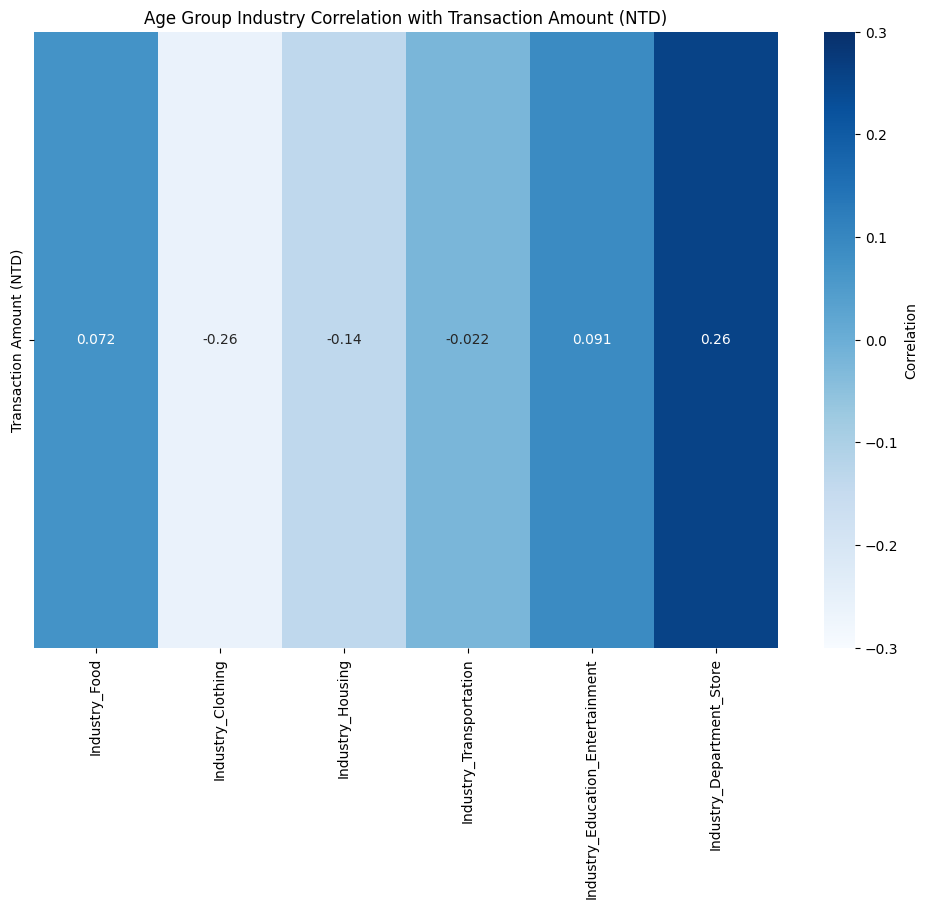

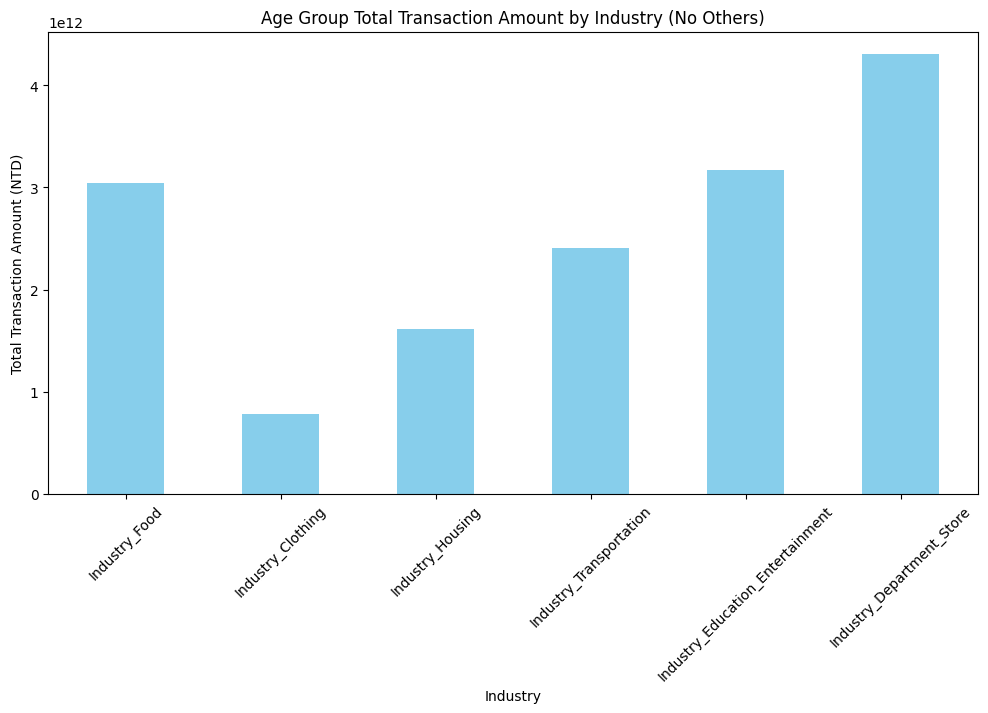

In [ ]:
plot_industry_correlation_and_total_no_others(
    ageGroupCombined,
    industry_order,
    "Age Group",
    "Blues",   # 熱圖顏色漸變
    "skyblue"     # 柱狀圖顏色
)


###（收入）產業-交易金額

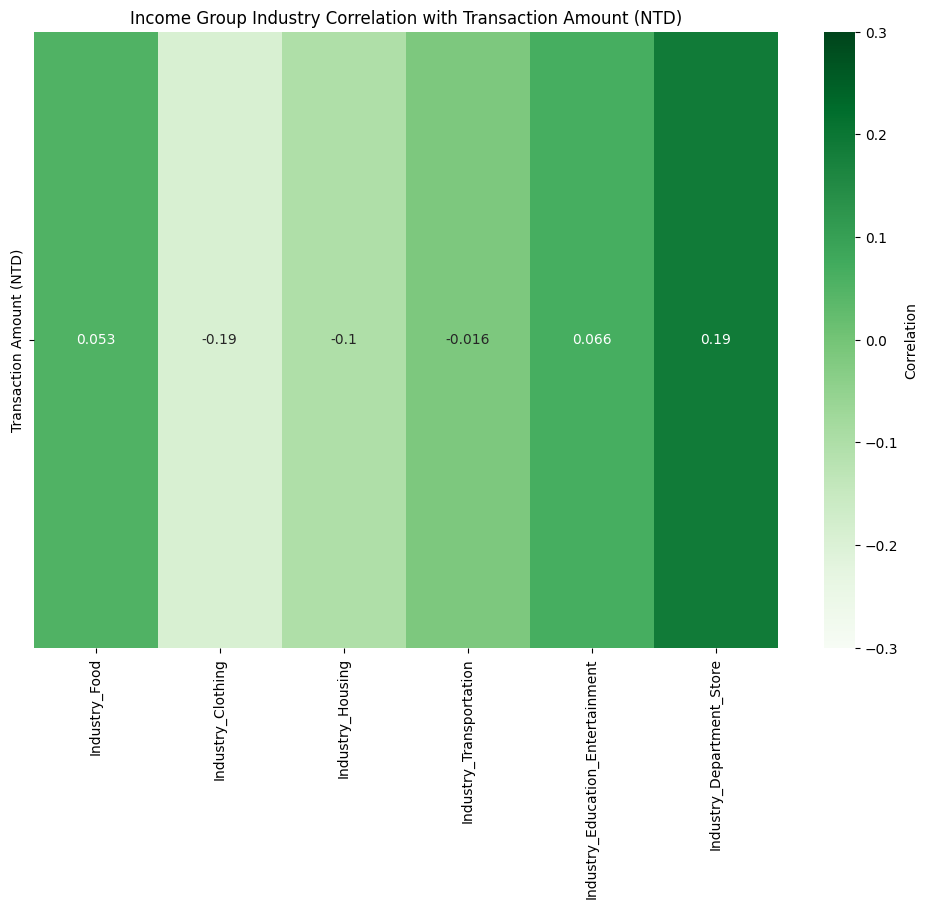

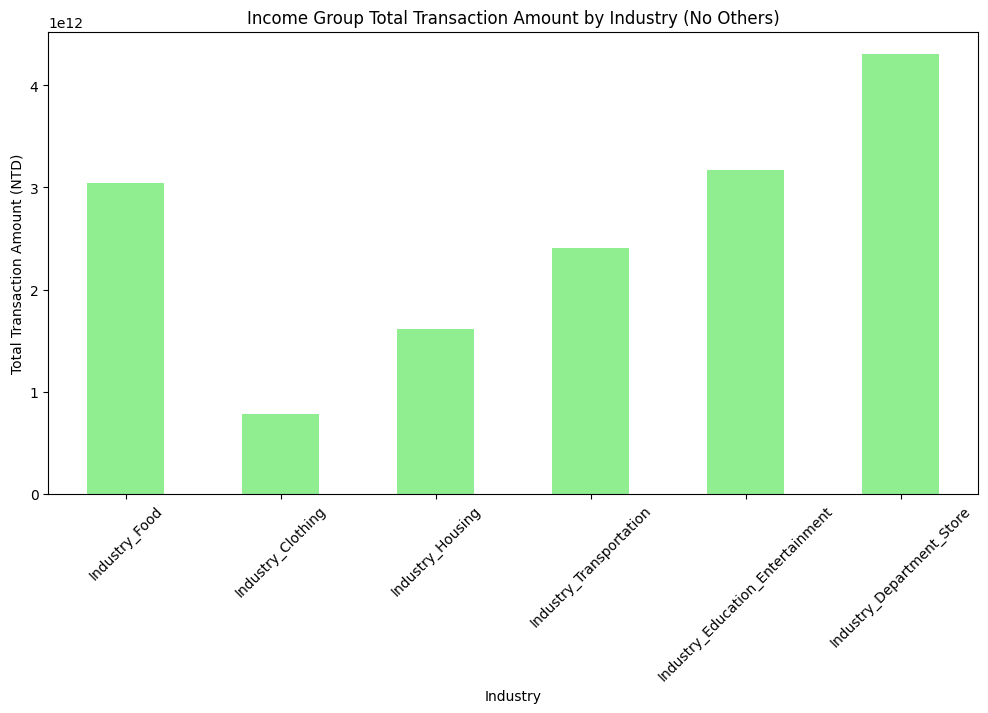

In [ ]:
plot_industry_correlation_and_total_no_others(
    incomeGroupCombined,
    industry_order,
    "Income Group",
    "Greens",  # 熱圖顏色漸變
    "lightgreen"    # 柱狀圖顏色
)


### （教育程度）產業-交易金額

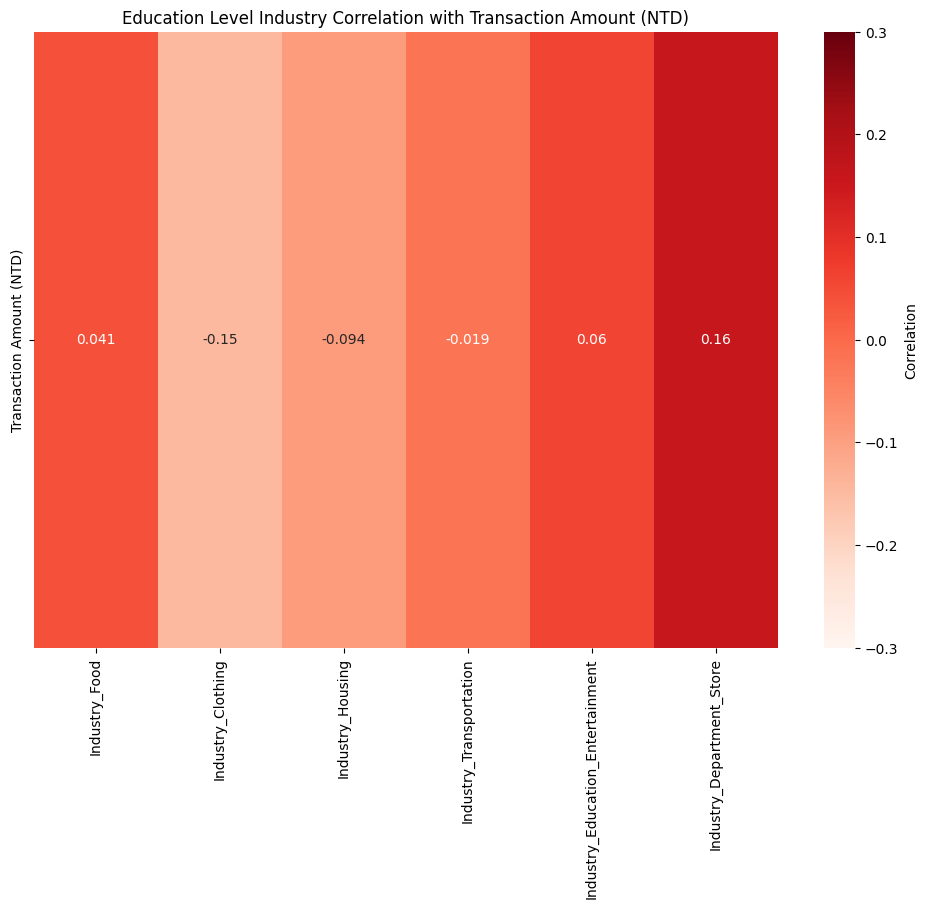

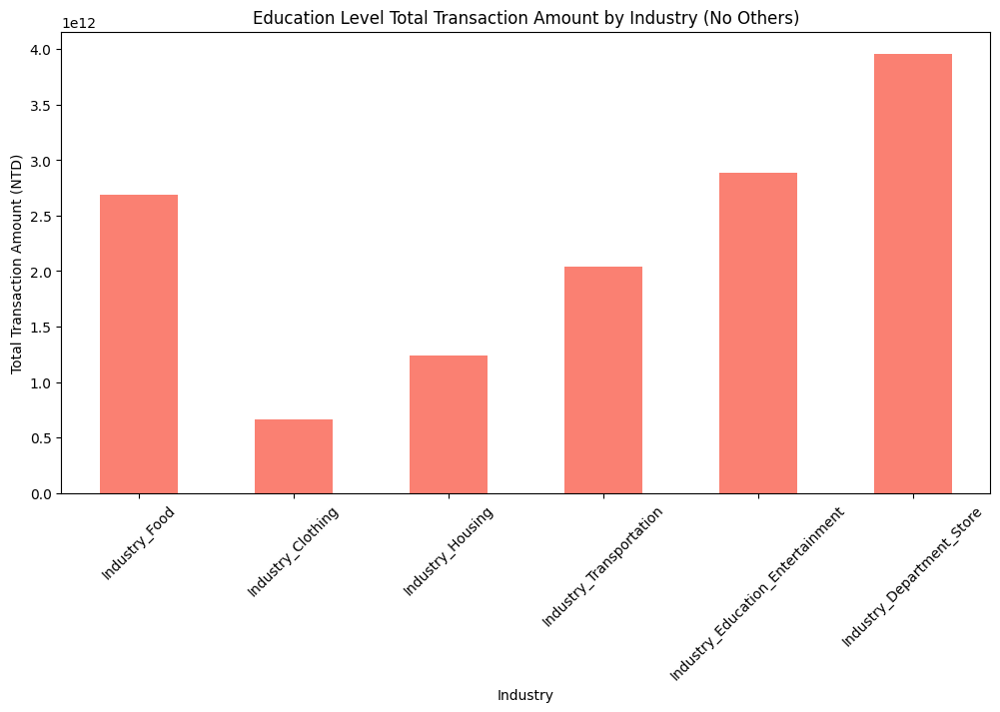

In [ ]:
plot_industry_correlation_and_total_no_others(
    educationLevelCombined,
    industry_order,
    "Education Level",
    "Reds",    # 熱圖顏色漸變
    "salmon"      # 柱狀圖顏色
)


## 主要變數（年齡、收入、教育程度）與產業對交易金額之影響

### 年齡與產業對金額之散佈圖

In [ ]:
def plot_scatter_industry_vs_variable_ordered(df, variable_columns, industry_columns, title, variable_order):
    # 創建變數標籤和行業標籤
    df = df.copy()
    df["Variable"] = df[variable_columns].idxmax(axis=1)
    df["Industry"] = df[industry_columns].idxmax(axis=1)

    # 設置 Variable 列的順序
    df["Variable"] = pd.Categorical(df["Variable"], categories=variable_order, ordered=True)

    # 繪製散佈圖
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=df,
        x="Variable",
        y="Transaction Amount (NTD)",
        hue="Industry",
        palette="Set2"
    )
    plt.title(title)
    plt.xlabel("Variable")
    plt.ylabel("Transaction Amount (NTD)")
    plt.legend(title="Industry", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.show()


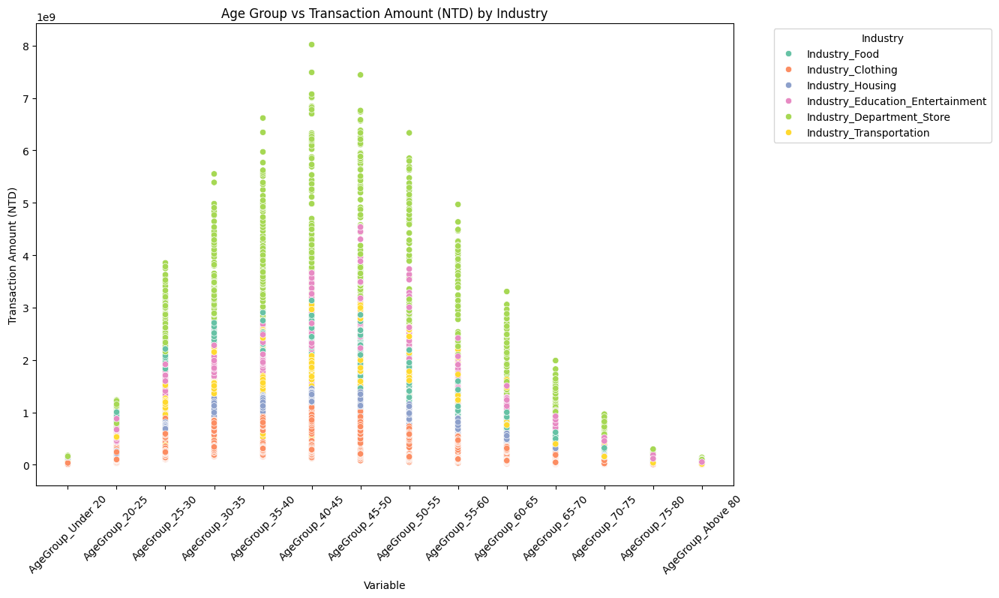

In [ ]:
# 年齡層相關欄位
age_group_order = [
    "AgeGroup_Under 20", "AgeGroup_20-25", "AgeGroup_25-30",
    "AgeGroup_30-35", "AgeGroup_35-40", "AgeGroup_40-45",
    "AgeGroup_45-50", "AgeGroup_50-55", "AgeGroup_55-60",
    "AgeGroup_60-65", "AgeGroup_65-70", "AgeGroup_70-75",
    "AgeGroup_75-80", "AgeGroup_Above 80"
]


plot_scatter_industry_vs_variable_ordered(
    ageGroupCombined,
    variable_columns=age_group_order,
    industry_columns=industry_order,
    title="Age Group vs Transaction Amount (NTD) by Industry",
    variable_order=age_group_order  # 使用自定義的順序
)


### 收入與產業對金額之散佈圖

In [ ]:
def plot_scatter_income_group_ordered(df, variable_columns, industry_columns, title, variable_order):
    # 創建變數標籤和行業標籤
    df = df.copy()
    df["Variable"] = df[variable_columns].idxmax(axis=1)
    df["Industry"] = df[industry_columns].idxmax(axis=1)

    # 設置 Variable 列的順序
    df["Variable"] = pd.Categorical(df["Variable"], categories=variable_order, ordered=True)

    # 繪製散佈圖
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=df,
        x="Variable",
        y="Transaction Amount (NTD)",
        hue="Industry",
        palette="Set2"
    )
    plt.title(title)
    plt.xlabel("Income Group")
    plt.ylabel("Transaction Amount (NTD)")
    plt.legend(title="Industry", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.show()


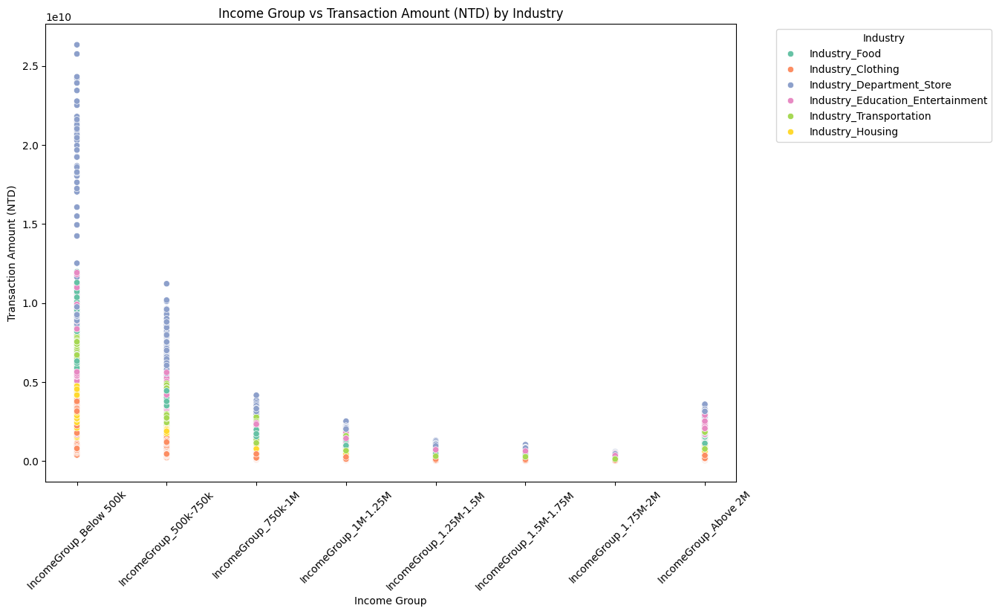

In [ ]:
# 收入分組相關欄位
income_group_order = [
    "IncomeGroup_Below 500k", "IncomeGroup_500k-750k", "IncomeGroup_750k-1M",
    "IncomeGroup_1M-1.25M", "IncomeGroup_1.25M-1.5M", "IncomeGroup_1.5M-1.75M",
    "IncomeGroup_1.75M-2M", "IncomeGroup_Above 2M"
]

plot_scatter_income_group_ordered(
    incomeGroupCombined,
    variable_columns=income_group_order,
    industry_columns=industry_order,
    title="Income Group vs Transaction Amount (NTD) by Industry",
    variable_order=income_group_order  # 使用自定義的順序
)


### 教育程度與產業對金額之散佈圖

In [ ]:
def plot_scatter_education_level_ordered(df, variable_columns, industry_columns, title, variable_order):
    # 創建變數標籤和行業標籤
    df = df.copy()
    df["Variable"] = df[variable_columns].idxmax(axis=1)
    df["Industry"] = df[industry_columns].idxmax(axis=1)

    # 設置 Variable 列的順序
    df["Variable"] = pd.Categorical(df["Variable"], categories=variable_order, ordered=True)

    # 繪製散佈圖
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=df,
        x="Variable",
        y="Transaction Amount (NTD)",
        hue="Industry",
        palette="Set2"
    )
    plt.title(title)
    plt.xlabel("Education Level")
    plt.ylabel("Transaction Amount (NTD)")
    plt.legend(title="Industry", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.show()

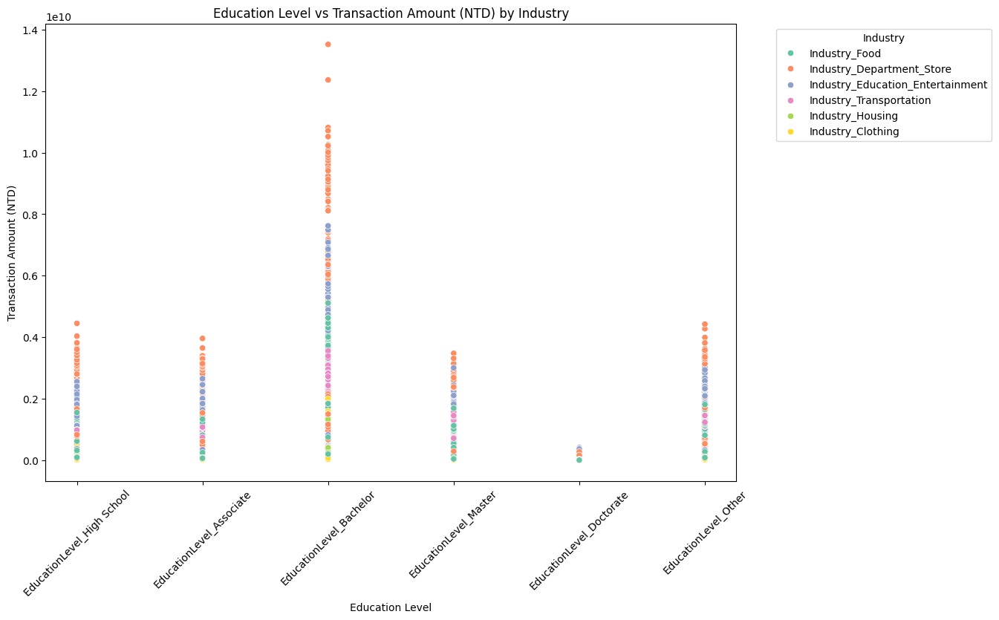

In [ ]:
# 教育程度相關欄位
education_level_order = [
    "EducationLevel_High School", "EducationLevel_Associate",
    "EducationLevel_Bachelor", "EducationLevel_Master",
    "EducationLevel_Doctorate", "EducationLevel_Other"
]


plot_scatter_education_level_ordered(
    educationLevelCombined,
    variable_columns=education_level_order,
    industry_columns=industry_order,
    title="Education Level vs Transaction Amount (NTD) by Industry",
    variable_order=education_level_order  # 使用自定義的順序
)



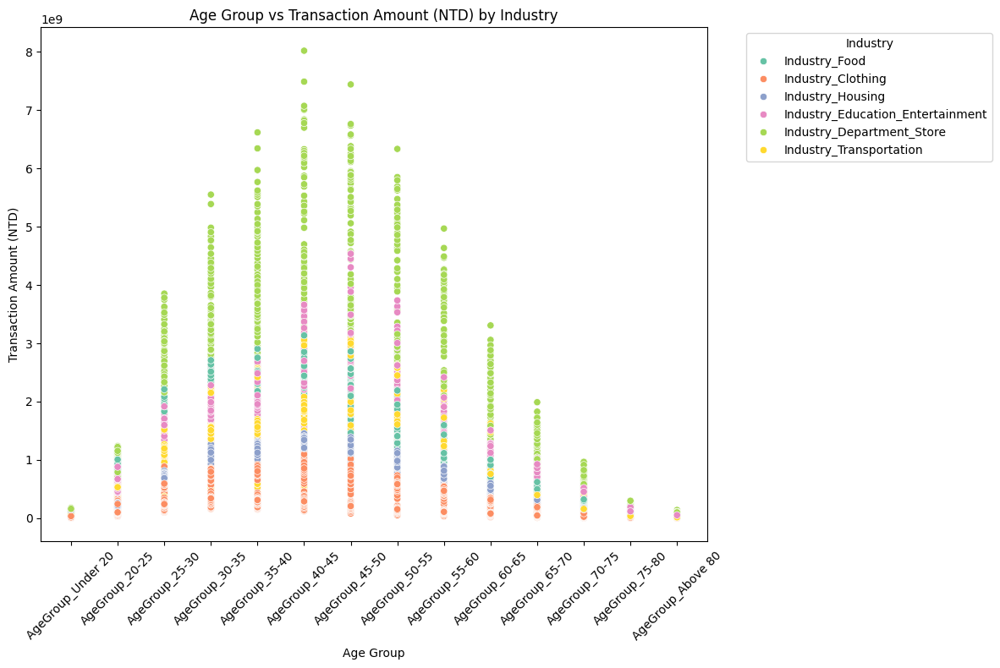

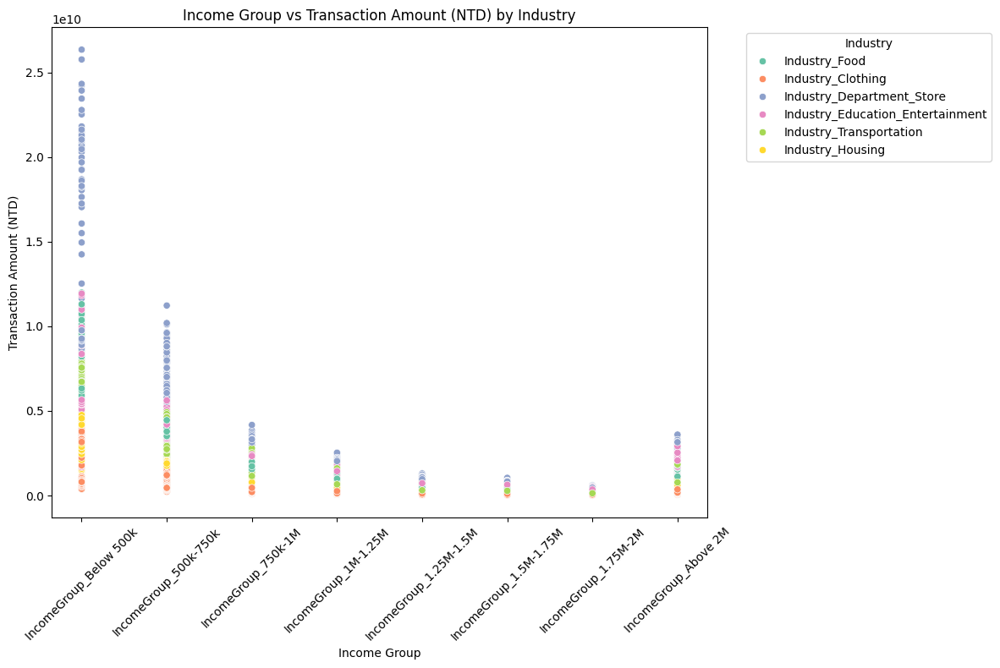

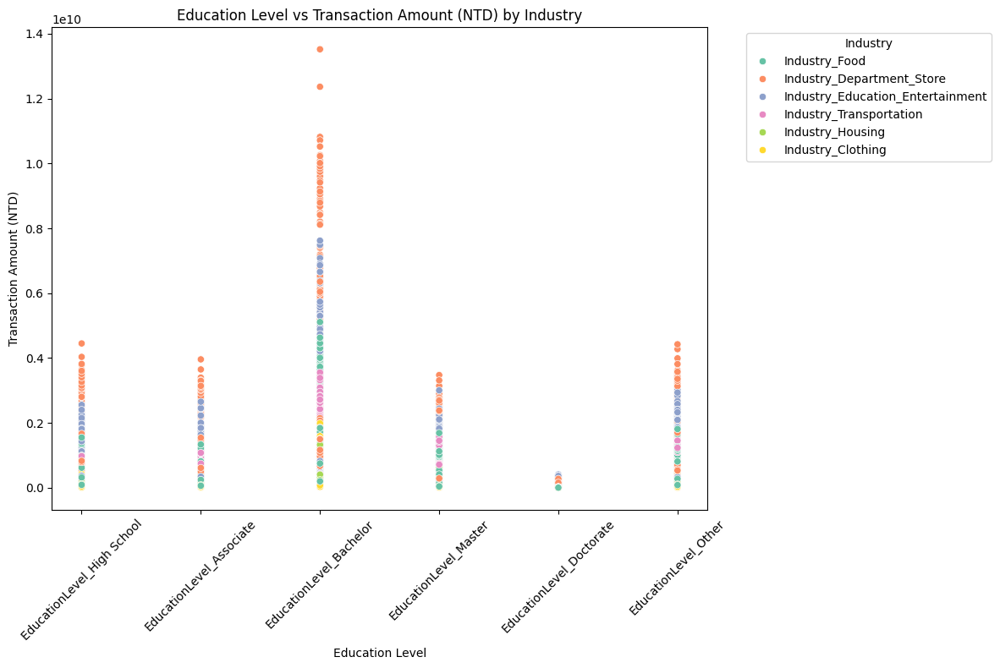

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_scatter_industry_vs_variable(df, variable_order, industry_columns, x_label, title):
    """
    重新生成 Industry 欄位後，繪製散佈圖。
    :param df: DataFrame
    :param variable_order: 排序後的 key variable 名稱列表
    :param industry_columns: One-hot encoding 的 industry 欄位列表
    :param x_label: X 軸標籤
    :param title: 圖片標題
    """
    # 重新生成 Industry 欄位
    df = df.copy()
    df["Industry"] = df[industry_columns].idxmax(axis=1)

    # 在這裡創建 "Variable" 欄位，並將其設置為排序後的類別型變數
    df["Variable"] = df[variable_order].idxmax(axis=1)  # 使用 variable_order 來提取對應的欄位名稱
    df["Variable"] = pd.Categorical(df["Variable"], categories=variable_order, ordered=True)

    # 繪製散佈圖
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        data=df,
        x="Variable",
        y="Transaction Amount (NTD)",
        hue="Industry",
        palette="Set2"
    )
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel("Transaction Amount (NTD)")
    plt.legend(title="Industry", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# 行業 One-Hot Encoding 欄位
industry_columns = [
    "Industry_Food", "Industry_Clothing", "Industry_Housing",
    "Industry_Transportation", "Industry_Education_Entertainment",
    "Industry_Department_Store"
]

# 年齡分組順序
age_group_order = [
    "AgeGroup_Under 20", "AgeGroup_20-25", "AgeGroup_25-30",
    "AgeGroup_30-35", "AgeGroup_35-40", "AgeGroup_40-45",
    "AgeGroup_45-50", "AgeGroup_50-55", "AgeGroup_55-60",
    "AgeGroup_60-65", "AgeGroup_65-70", "AgeGroup_70-75",
    "AgeGroup_75-80", "AgeGroup_Above 80"
]

# 收入分組順序
income_group_order = [
    "IncomeGroup_Below 500k", "IncomeGroup_500k-750k", "IncomeGroup_750k-1M",
    "IncomeGroup_1M-1.25M", "IncomeGroup_1.25M-1.5M", "IncomeGroup_1.5M-1.75M",
    "IncomeGroup_1.75M-2M", "IncomeGroup_Above 2M"
]

# 教育程度分組順序
education_level_order = [
    "EducationLevel_High School", "EducationLevel_Associate",
    "EducationLevel_Bachelor", "EducationLevel_Master",
    "EducationLevel_Doctorate", "EducationLevel_Other"
]

# 繪製 年齡層 vs Transaction Amount 圖表
plot_scatter_industry_vs_variable(
    ageGroupCombined, age_group_order, industry_columns,
    x_label="Age Group", title="Age Group vs Transaction Amount (NTD) by Industry"
)

# 繪製 收入分組 vs Transaction Amount 圖表
plot_scatter_industry_vs_variable(
    incomeGroupCombined, income_group_order, industry_columns,
    x_label="Income Group", title="Income Group vs Transaction Amount (NTD) by Industry"
)

# 繪製 教育程度 vs Transaction Amount 圖表
plot_scatter_industry_vs_variable(
    educationLevelCombined, education_level_order, industry_columns,
    x_label="Education Level", title="Education Level vs Transaction Amount (NTD) by Industry"
)


## 時序分析1（看有沒有cycle）→有則可以推到日期的重要並正確切割資料

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates  # 匯入 mdates
import seaborn as sns

def plot_time_series_by_variable_with_custom_ticks(df, date_column, amount_column, variable_columns, title, variable_order):
    # 確保日期格式正確，並按日期排序
    df[date_column] = pd.to_datetime(df[date_column])
    df = df.sort_values(by=date_column)

    # 將數據展平，根據日期和變數聚合交易金額
    time_series_data = df.melt(
        id_vars=[date_column, amount_column],
        value_vars=variable_columns,
        var_name="Variable",
        value_name="IsPresent"
    )
    # 篩選出 IsPresent 為 True 的行
    time_series_data = time_series_data[time_series_data["IsPresent"] == True]

    # 按日期和變數分組並聚合交易金額
    time_series_agg = time_series_data.groupby([date_column, "Variable"])[amount_column].sum().reset_index()

    # 繪製時序圖
    plt.figure(figsize=(14, 8))
    sns.lineplot(
        data=time_series_agg,
        x=date_column,
        y=amount_column,
        hue="Variable",
        hue_order=variable_order,  # 設置圖例順序
        palette="Set2"
    )

    # 設置自定義 X 軸標籤
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())  # 每月標籤
    ax.xaxis.set_major_formatter(
        mdates.DateFormatter('%m')  # 默認顯示月份
    )

    # 修改特定月份的標籤（每年的 1 月加年份）
    def custom_date_formatter(x, pos):
        date = mdates.num2date(x)  # 將數值轉回日期
        if date.month == 1:  # 如果是 1 月
            return f"{date.year}/{date.month}"  # 顯示年份/1
        return f"{date.month}"  # 否則只顯示月份

    ax.xaxis.set_major_formatter(plt.FuncFormatter(custom_date_formatter))

    # 縮小 X 軸標籤的字體大小
    plt.xticks(rotation=45, fontsize=5)

    # 設置 X 軸範圍（消除多餘的空白）
    plt.xlim([time_series_agg[date_column].min(), time_series_agg[date_column].max()])

    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Transaction Amount (NTD)")
    plt.legend(title="Variable", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

### 年齡對金額之時序圖

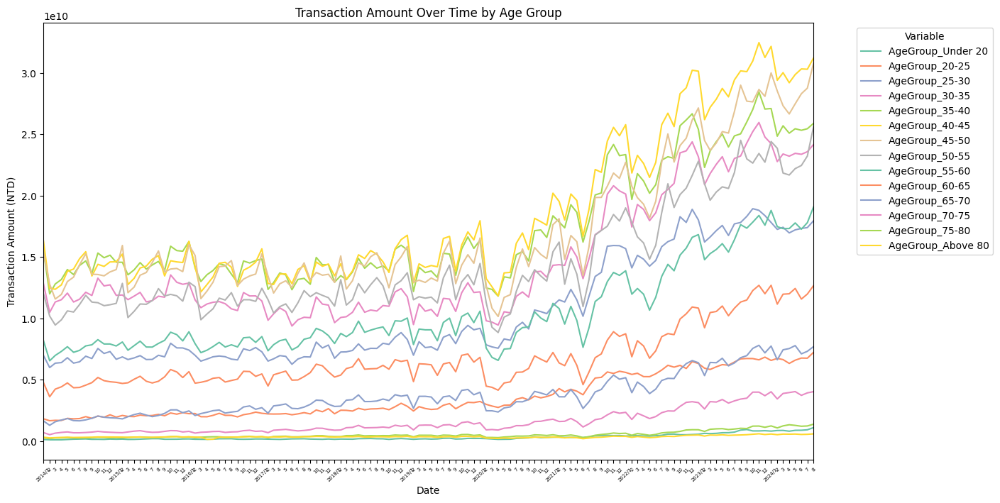

In [ ]:
plot_time_series_by_variable_with_custom_ticks(
    df=ageGroupCombined,
    date_column="Date",
    amount_column="Transaction Amount (NTD)",
    variable_columns=[
        "AgeGroup_Under 20", "AgeGroup_20-25", "AgeGroup_25-30",
        "AgeGroup_30-35", "AgeGroup_35-40", "AgeGroup_40-45",
        "AgeGroup_45-50", "AgeGroup_50-55", "AgeGroup_55-60",
        "AgeGroup_60-65", "AgeGroup_65-70", "AgeGroup_70-75",
        "AgeGroup_75-80", "AgeGroup_Above 80"
    ],
    title="Transaction Amount Over Time by Age Group",
    variable_order=[
        "AgeGroup_Under 20", "AgeGroup_20-25", "AgeGroup_25-30",
        "AgeGroup_30-35", "AgeGroup_35-40", "AgeGroup_40-45",
        "AgeGroup_45-50", "AgeGroup_50-55", "AgeGroup_55-60",
        "AgeGroup_60-65", "AgeGroup_65-70", "AgeGroup_70-75",
        "AgeGroup_75-80", "AgeGroup_Above 80"
    ]
)


### 收入對金額之時序圖

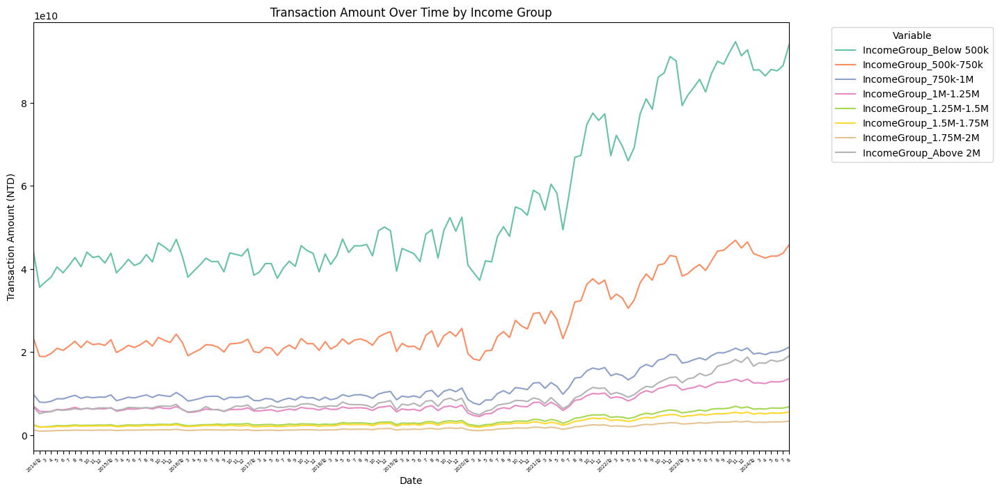

In [ ]:
plot_time_series_by_variable_with_custom_ticks(
    df=incomeGroupCombined,
    date_column="Date",
    amount_column="Transaction Amount (NTD)",
    variable_columns=[
        "IncomeGroup_Below 500k", "IncomeGroup_500k-750k", "IncomeGroup_750k-1M",
        "IncomeGroup_1M-1.25M", "IncomeGroup_1.25M-1.5M", "IncomeGroup_1.5M-1.75M",
        "IncomeGroup_1.75M-2M", "IncomeGroup_Above 2M"
    ],
    title="Transaction Amount Over Time by Income Group",
    variable_order=[
        "IncomeGroup_Below 500k", "IncomeGroup_500k-750k", "IncomeGroup_750k-1M",
        "IncomeGroup_1M-1.25M", "IncomeGroup_1.25M-1.5M", "IncomeGroup_1.5M-1.75M",
        "IncomeGroup_1.75M-2M", "IncomeGroup_Above 2M"
    ]
)


### 教育程度對金額之時序圖

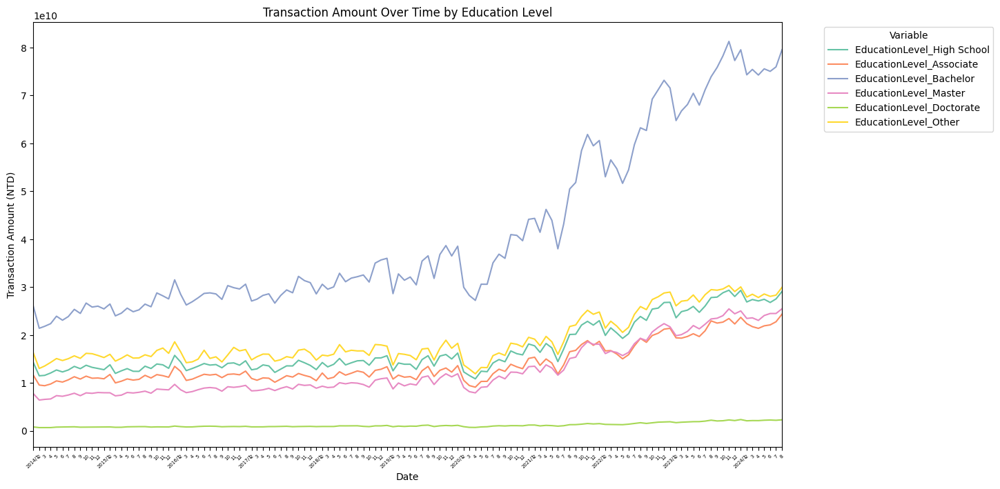

In [ ]:
plot_time_series_by_variable_with_custom_ticks(
    df=educationLevelCombined,
    date_column="Date",
    amount_column="Transaction Amount (NTD)",
    variable_columns=[
        "EducationLevel_High School", "EducationLevel_Associate",
        "EducationLevel_Bachelor", "EducationLevel_Master",
        "EducationLevel_Doctorate", "EducationLevel_Other"
    ],
    title="Transaction Amount Over Time by Education Level",
    variable_order=[
        "EducationLevel_High School", "EducationLevel_Associate",
        "EducationLevel_Bachelor", "EducationLevel_Master",
        "EducationLevel_Doctorate", "EducationLevel_Other"
    ]
)


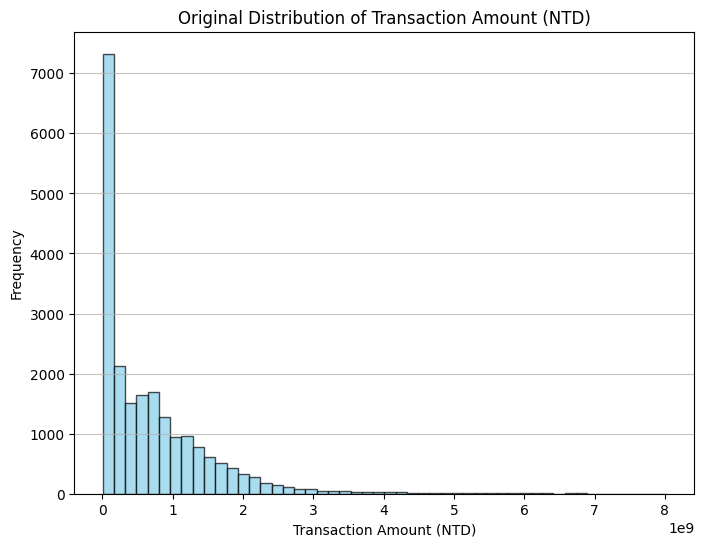

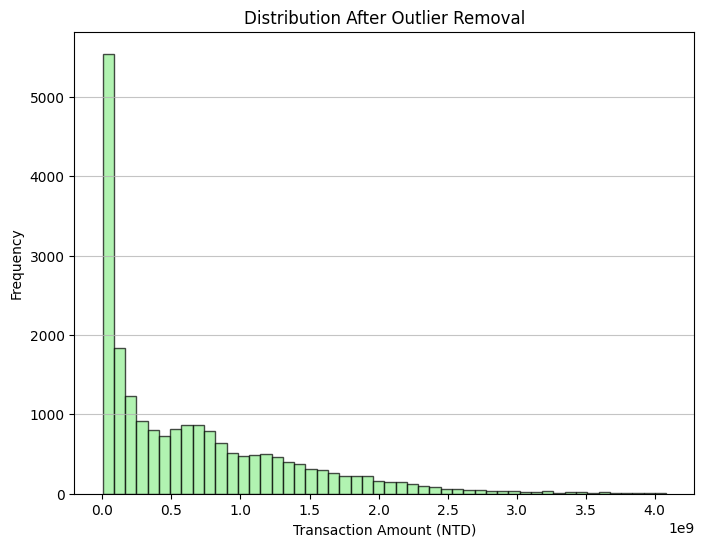

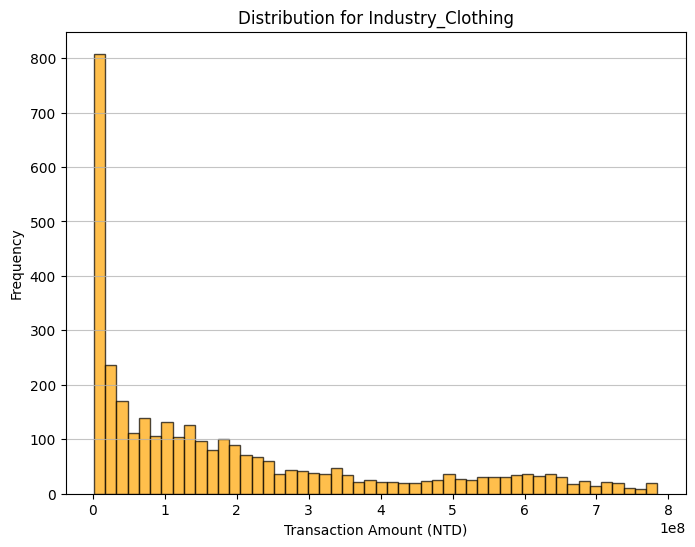

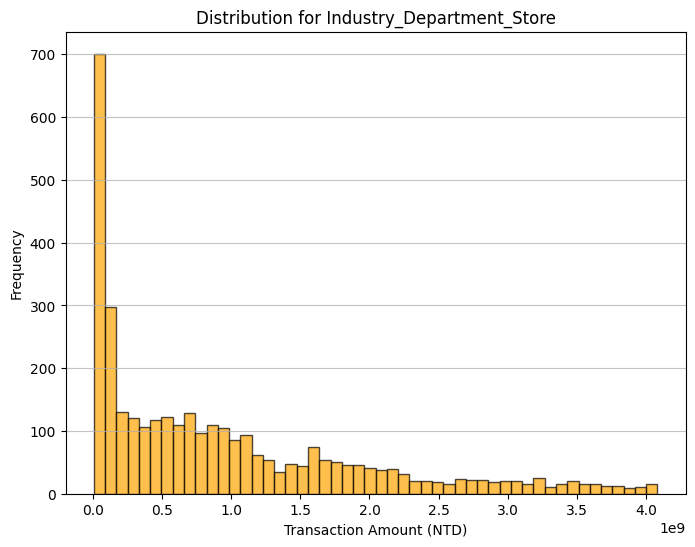

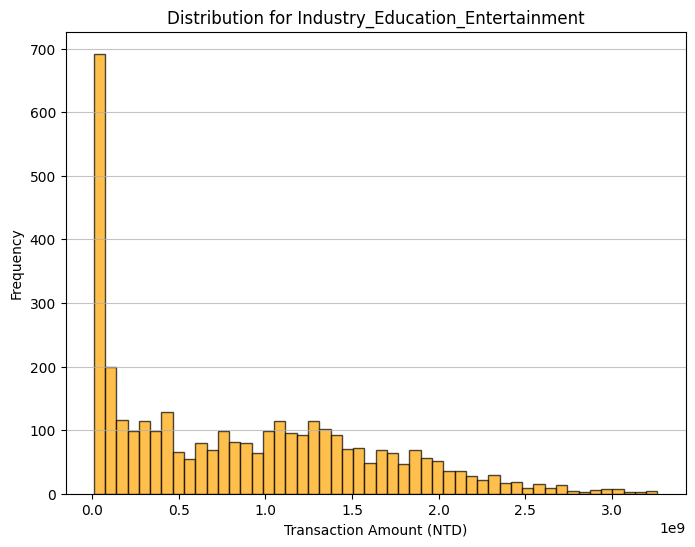

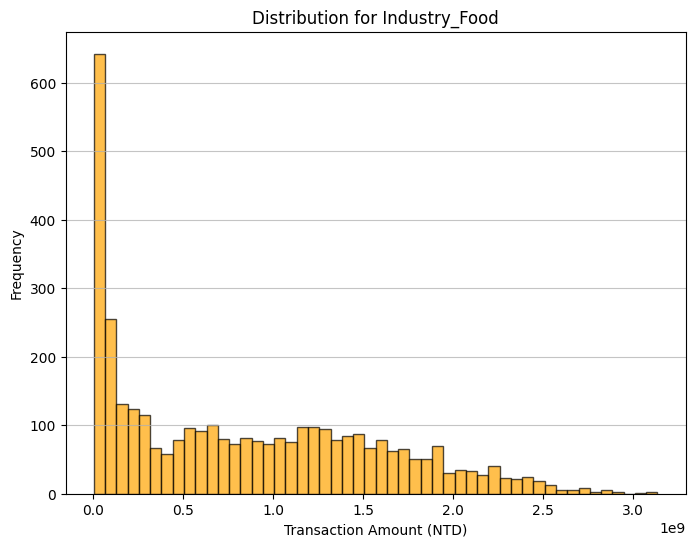

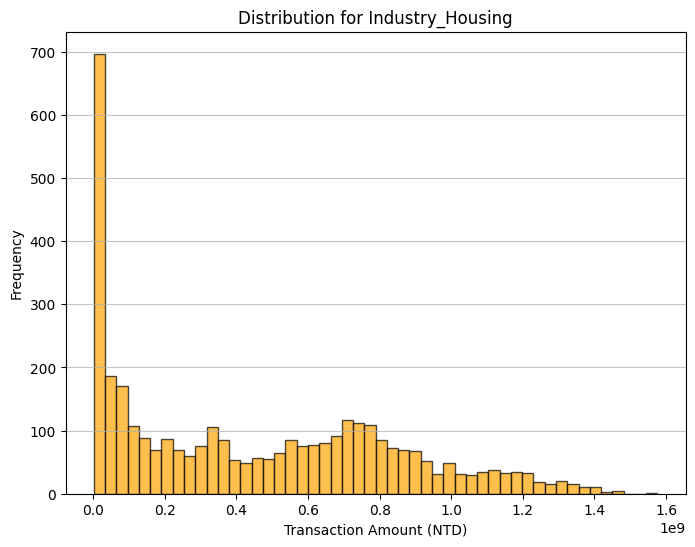

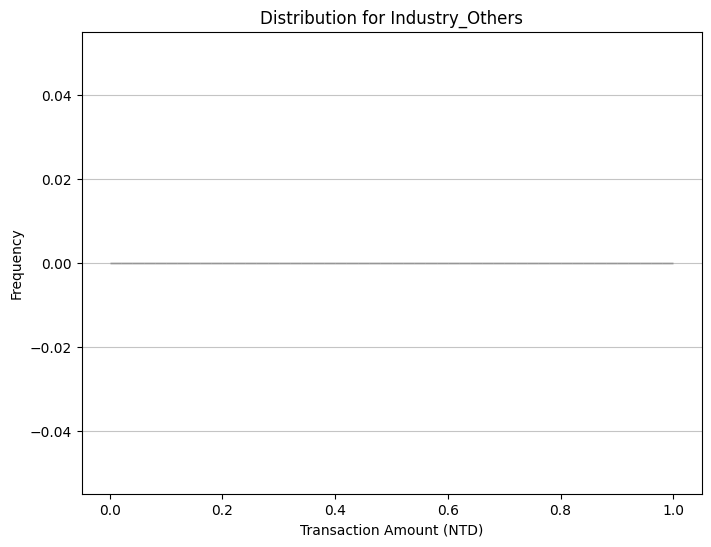

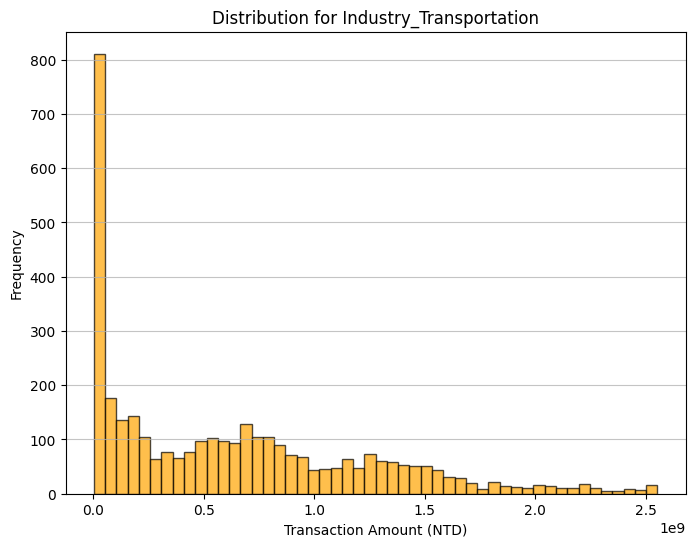

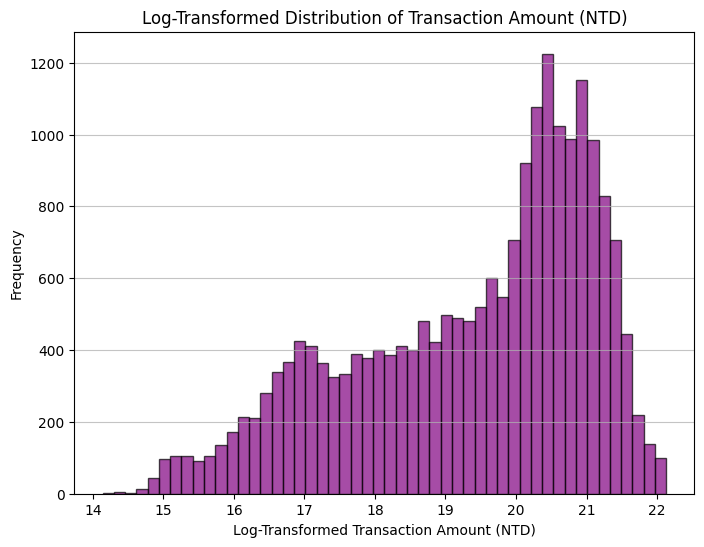

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Step 1: 原始分佈
def plot_original_distribution(df, target_col):
    plt.figure(figsize=(8, 6))
    plt.hist(df[target_col], bins=50, color='skyblue', edgecolor='k', alpha=0.7)
    plt.title("Original Distribution of Transaction Amount (NTD)")
    plt.xlabel("Transaction Amount (NTD)")
    plt.ylabel("Frequency")
    plt.grid(axis='y', alpha=0.75)
    plt.savefig("original_distribution.png")
    plt.show()

# Step 2: 移除異常值
def remove_outliers_per_industry(df, amount_col, industry_columns, method='iqr', threshold=1.5, min_threshold=5000):
    cleaned_data = []
    for industry_col in industry_columns:
        industry_data = df[df[industry_col] == 1]

        if method == 'iqr':
            Q1 = industry_data[amount_col].quantile(0.25)
            Q3 = industry_data[amount_col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = max(Q1 - threshold * IQR, min_threshold)
            upper_bound = Q3 + threshold * IQR
        else:
            raise ValueError("Unsupported method. Use 'iqr'.")

        industry_data_cleaned = industry_data[
            (industry_data[amount_col] >= lower_bound) & (industry_data[amount_col] <= upper_bound)
        ]
        cleaned_data.append(industry_data_cleaned)

    return pd.concat(cleaned_data, ignore_index=True)

def plot_distribution_after_outlier_removal(df, target_col):
    plt.figure(figsize=(8, 6))
    plt.hist(df[target_col], bins=50, color='lightgreen', edgecolor='k', alpha=0.7)
    plt.title("Distribution After Outlier Removal")
    plt.xlabel("Transaction Amount (NTD)")
    plt.ylabel("Frequency")
    plt.grid(axis='y', alpha=0.75)
    plt.savefig("outlier_removed_distribution.png")
    plt.show()

# Step 3: 過濾特定產業數據
def plot_industry_distribution(df, target_col, industry_col):
    industry_data = df[df[industry_col] == 1]
    plt.figure(figsize=(8, 6))
    plt.hist(industry_data[target_col], bins=50, color='orange', edgecolor='k', alpha=0.7)
    plt.title(f"Distribution for {industry_col}")
    plt.xlabel("Transaction Amount (NTD)")
    plt.ylabel("Frequency")
    plt.grid(axis='y', alpha=0.75)
    plt.savefig(f"{industry_col}_distribution.png")
    plt.show()

# Step 4: 對數變換
def plot_log_transformed_distribution(df, target_col):
    plt.figure(figsize=(8, 6))
    plt.hist(np.log1p(df[target_col]), bins=50, color='purple', edgecolor='k', alpha=0.7)
    plt.title("Log-Transformed Distribution of Transaction Amount (NTD)")
    plt.xlabel("Log-Transformed Transaction Amount (NTD)")
    plt.ylabel("Frequency")
    plt.grid(axis='y', alpha=0.75)
    plt.savefig("log_transformed_distribution.png")
    plt.show()

# 主程式
# 假設 ageGroupCombined 已經定義
target_col = "Transaction Amount (NTD)"
industry_columns = [col for col in ageGroupCombined.columns if col.startswith("Industry_")]

# Step 1: 原始分佈
plot_original_distribution(ageGroupCombined, target_col)

# Step 2: 移除異常值
ageGroupCombined_cleaned = remove_outliers_per_industry(
    df=ageGroupCombined,
    amount_col=target_col,
    industry_columns=industry_columns,
    method='iqr',
    threshold=1.5,
    min_threshold=5000
)
plot_distribution_after_outlier_removal(ageGroupCombined_cleaned, target_col)

# Step 3: 過濾特定產業數據並展示分佈
for industry in industry_columns:
    plot_industry_distribution(ageGroupCombined_cleaned, target_col, industry)

# Step 4: 對數變換分佈
plot_log_transformed_distribution(ageGroupCombined_cleaned, target_col)

#以下是12/08

## linear regression no 'date' feature


=== Modeling for Industry: Industry_Clothing ===
Mean Squared Error (MSE) in log scale: 0.32144337522340805
Mean Absolute Error (MAE) in log scale: 0.45617253698602145
Mean Squared Error (MSE) in original scale: 5798416116708930.0
Mean Absolute Error (MAE) in original scale: 53888305.45393399


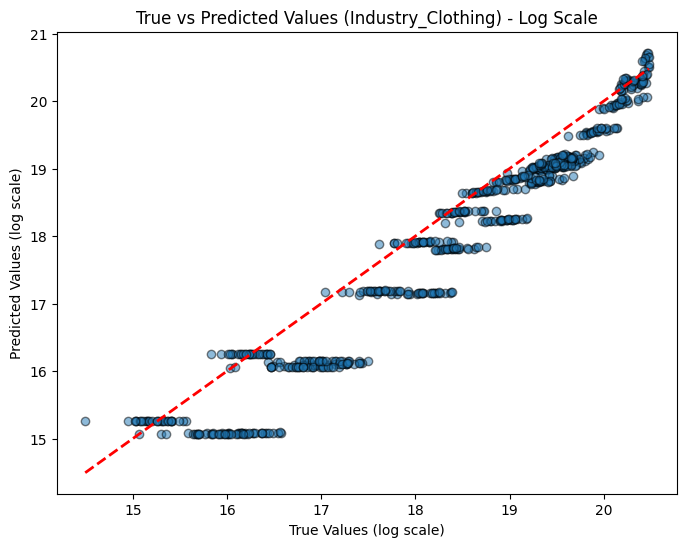

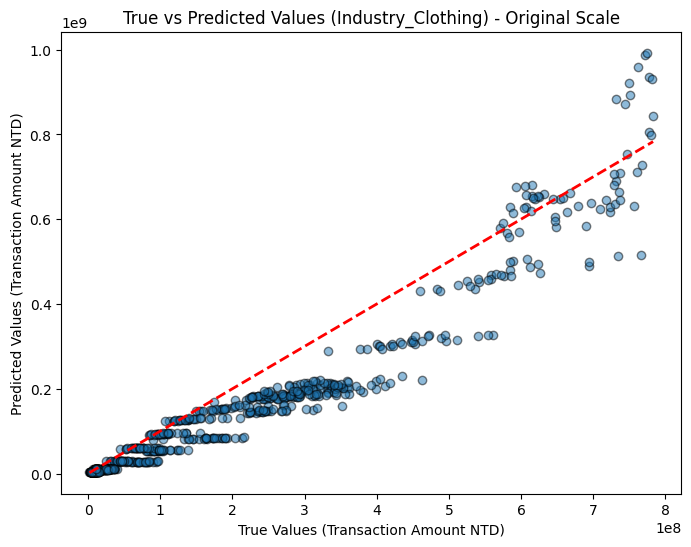


=== Modeling for Industry: Industry_Department_Store ===
Mean Squared Error (MSE) in log scale: 1.0738492531819177
Mean Absolute Error (MAE) in log scale: 0.8722068134850867
Mean Squared Error (MSE) in original scale: 4.695188019811094e+18
Mean Absolute Error (MAE) in original scale: 1140392800.1201558


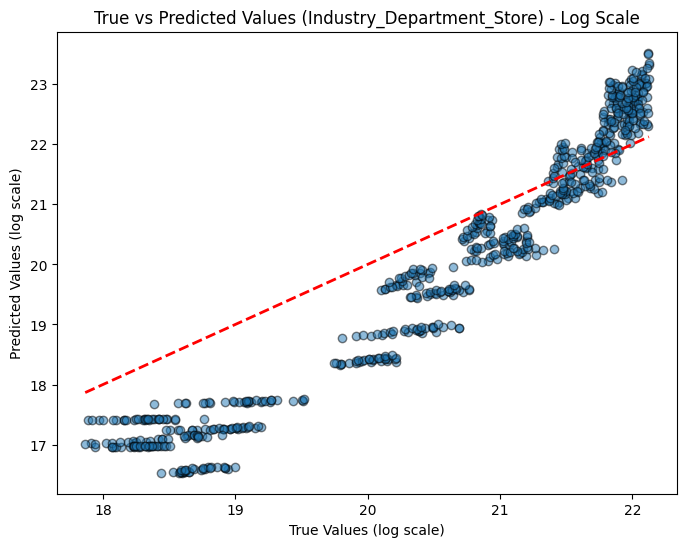

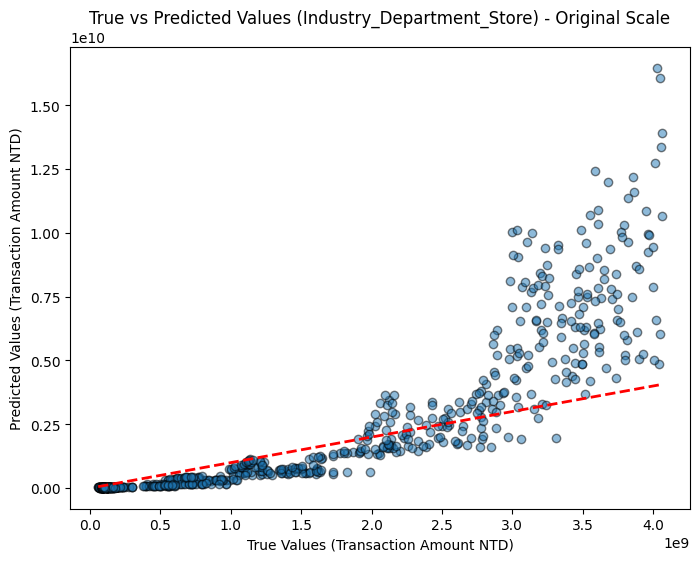


=== Modeling for Industry: Industry_Education_Entertainment ===
Mean Squared Error (MSE) in log scale: 0.3180840465751998
Mean Absolute Error (MAE) in log scale: 0.4338846194204834
Mean Squared Error (MSE) in original scale: 1.5757568218769344e+17
Mean Absolute Error (MAE) in original scale: 291753707.07130265


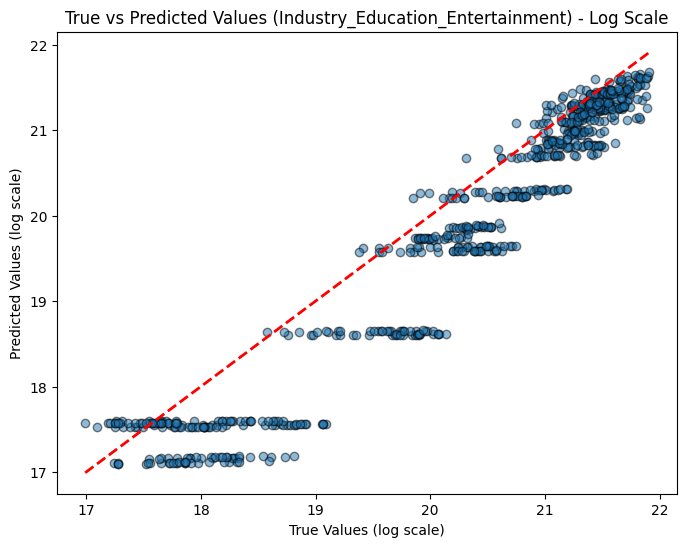

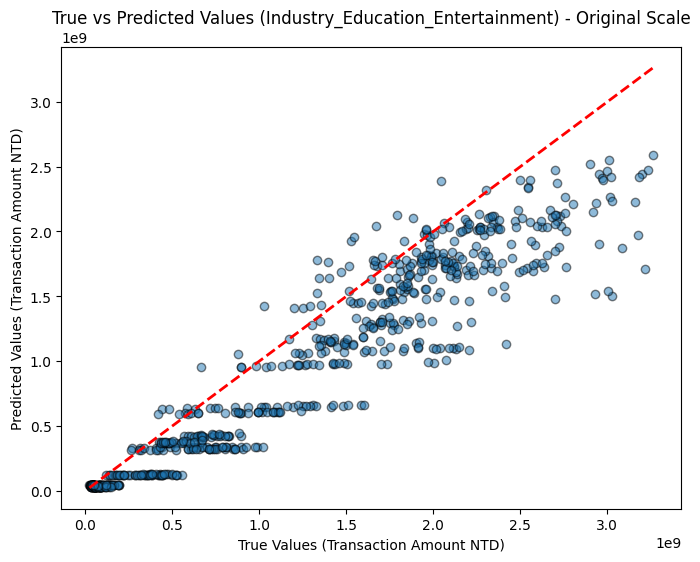


=== Modeling for Industry: Industry_Food ===
Mean Squared Error (MSE) in log scale: 0.3395570538571253
Mean Absolute Error (MAE) in log scale: 0.43829292032576767
Mean Squared Error (MSE) in original scale: 4.743310188909405e+17
Mean Absolute Error (MAE) in original scale: 432807329.68875647


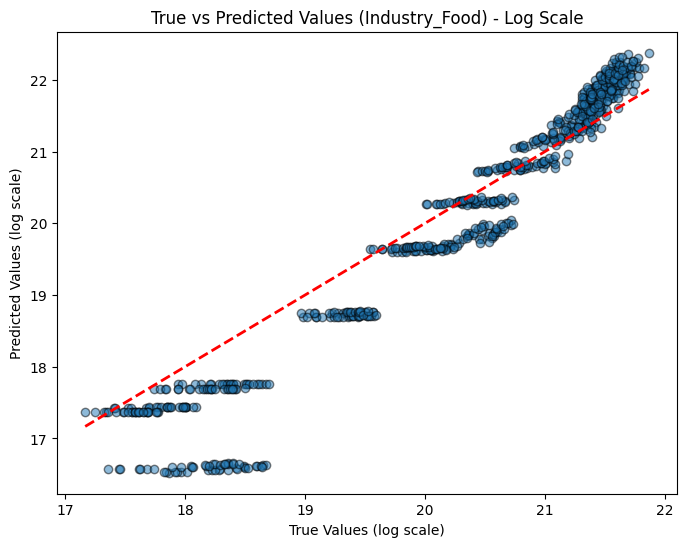

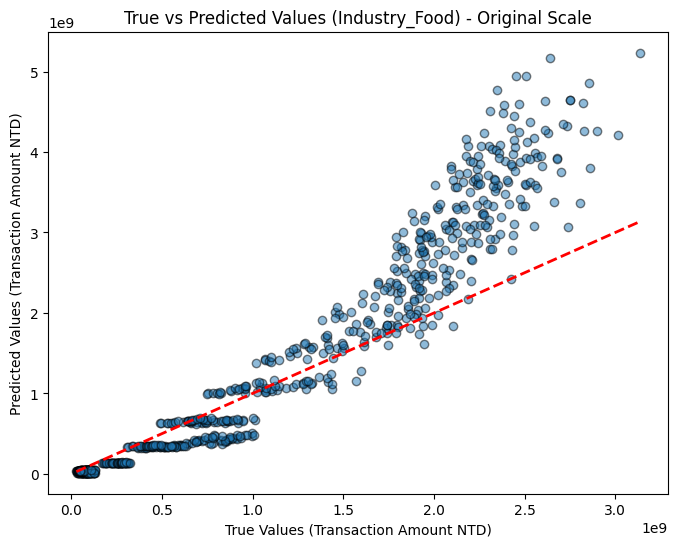


=== Modeling for Industry: Industry_Housing ===
Mean Squared Error (MSE) in log scale: 0.25908715753904826
Mean Absolute Error (MAE) in log scale: 0.40070557500664317
Mean Squared Error (MSE) in original scale: 6.805787821019429e+16
Mean Absolute Error (MAE) in original scale: 172612604.53289306


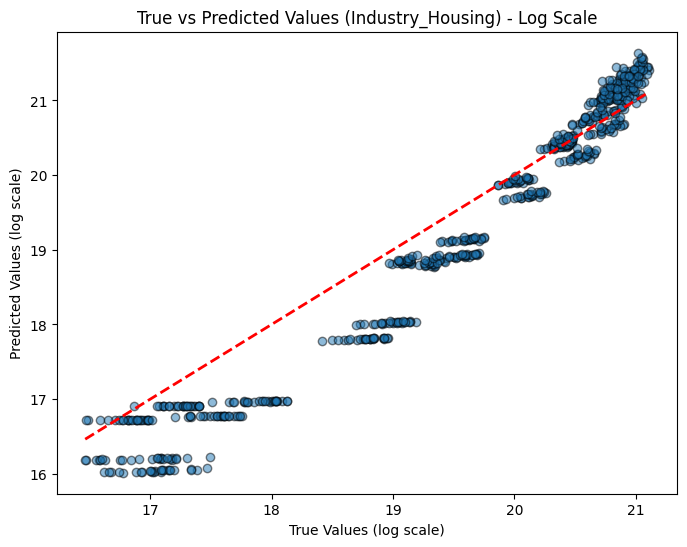

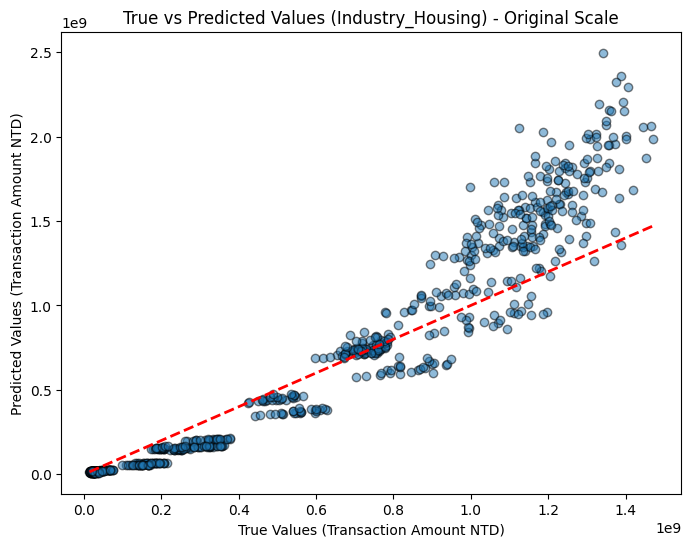


=== Modeling for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Modeling for Industry: Industry_Transportation ===
Mean Squared Error (MSE) in log scale: 0.7559415141766054
Mean Absolute Error (MAE) in log scale: 0.7266781397623192
Mean Squared Error (MSE) in original scale: 1.952205155402051e+17
Mean Absolute Error (MAE) in original scale: 339367391.8589435


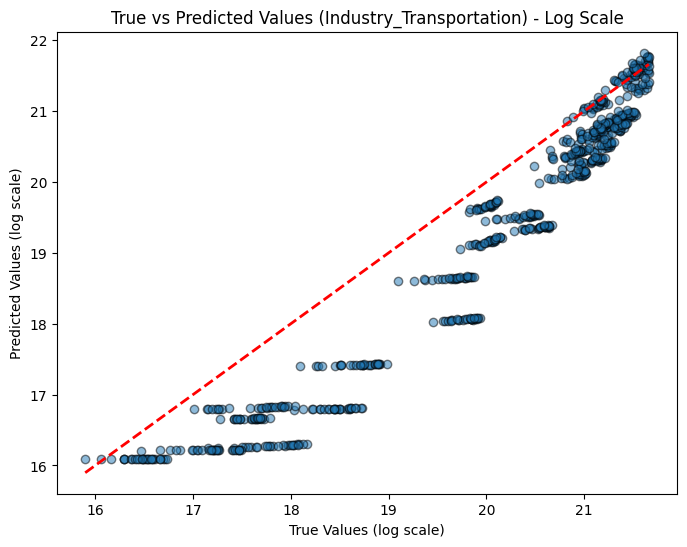

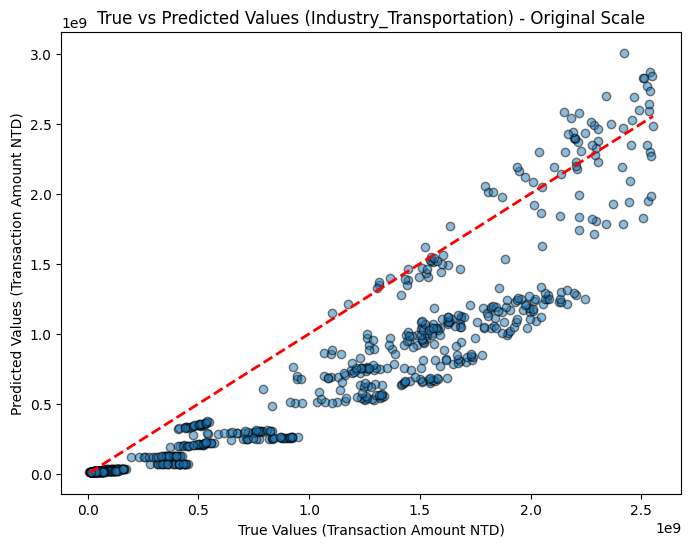

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# 定義函數：移除異常值
def remove_outliers_per_industry(df, amount_col, industry_columns, method='iqr', threshold=1.5, min_threshold=5000):
    """
    按產業類別移除目標變數的異常值，並移除低值。
    """
    cleaned_data = []
    for industry_col in industry_columns:
        industry_data = df[df[industry_col] == 1]

        if method == 'iqr':
            Q1 = industry_data[amount_col].quantile(0.25)
            Q3 = industry_data[amount_col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = max(Q1 - threshold * IQR, min_threshold)
            upper_bound = Q3 + threshold * IQR
        elif method == 'std':
            mean = industry_data[amount_col].mean()
            std = industry_data[amount_col].std()
            lower_bound = max(mean - threshold * std, min_threshold)
            upper_bound = mean + threshold * std
        else:
            raise ValueError("Unsupported method. Use 'iqr' or 'std'.")

        industry_data_cleaned = industry_data[
            (industry_data[amount_col] >= lower_bound) & (industry_data[amount_col] <= upper_bound)
        ]
        cleaned_data.append(industry_data_cleaned)

    return pd.concat(cleaned_data, ignore_index=True)

# 定義函數：單一產業建模與評估
def build_model_for_industry(df, industry_name, target_col='Transaction Amount (NTD)'):
    """
    為特定產業數據建模與評估。
    Args:
        df (pd.DataFrame): 數據框。
        industry_name (str): 產業名稱。
        target_col (str): 目標列名稱。
    """
    print(f"\n=== Modeling for Industry: {industry_name} ===")

    # 過濾該產業數據
    industry_data = df[df[industry_name] == 1].copy()

    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 分離特徵與目標
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]

    # 標準化數據
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 對目標變數取對數變換
    y_log = np.log1p(y)

    # 資料切分
    train_size = int(0.8 * len(X_scaled))
    X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
    y_train, y_test = y_log[:train_size], y_log[train_size:]

    # 初始化並訓練線性回歸模型
    linear_model = LinearRegression()
    linear_model.fit(X_train, y_train)

    # 預測
    y_pred_log = linear_model.predict(X_test)

    # 計算對數尺度的 MSE 和 MAE
    mse_log = mean_squared_error(y_test, y_pred_log)
    mae_log = mean_absolute_error(y_test, y_pred_log)
    print(f"Mean Squared Error (MSE) in log scale: {mse_log}")
    print(f"Mean Absolute Error (MAE) in log scale: {mae_log}")

    # 將預測值反變換
    y_pred_original = np.expm1(y_pred_log)
    y_test_original = np.expm1(y_test)

    # 計算原始尺度的 MSE 和 MAE
    mse_original = mean_squared_error(y_test_original, y_pred_original)
    mae_original = mean_absolute_error(y_test_original, y_pred_original)
    print(f"Mean Squared Error (MSE) in original scale: {mse_original}")
    print(f"Mean Absolute Error (MAE) in original scale: {mae_original}")

    # 繪製結果（在對數尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred_log, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test.min(), y_test.max()],
        [y_test.min(), y_test.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (log scale)")
    plt.ylabel("Predicted Values (log scale)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Log Scale")
    plt.show()

    # 繪製結果（在原始尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_original, y_pred_original, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test_original.min(), y_test_original.max()],
        [y_test_original.min(), y_test_original.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Original Scale")
    plt.show()

# 移除異常值
industry_columns = [col for col in ageGroupCombined.columns if col.startswith("Industry_")]
ageGroupCombined_cleaned = remove_outliers_per_industry(
    df=ageGroupCombined,
    amount_col='Transaction Amount (NTD)',
    industry_columns=industry_columns,
    method='iqr',
    threshold=1.5,
    min_threshold=5000
)

# 為每個產業分開建模
for industry in industry_columns:
    build_model_for_industry(ageGroupCombined_cleaned, industry, target_col='Transaction Amount (NTD)')


## linear regression with 'date' feature


=== Modeling for Industry: Industry_Clothing ===
Mean Squared Error (MSE) in log scale: 0.33978431955832794
Mean Absolute Error (MAE) in log scale: 0.4699744631163725
Mean Squared Error (MSE) in original scale: 5980568229783879.0
Mean Absolute Error (MAE) in original scale: 55453397.14087087


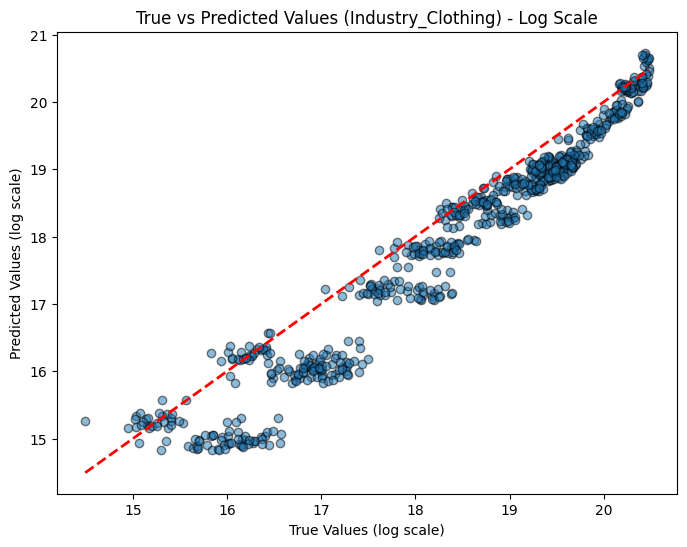

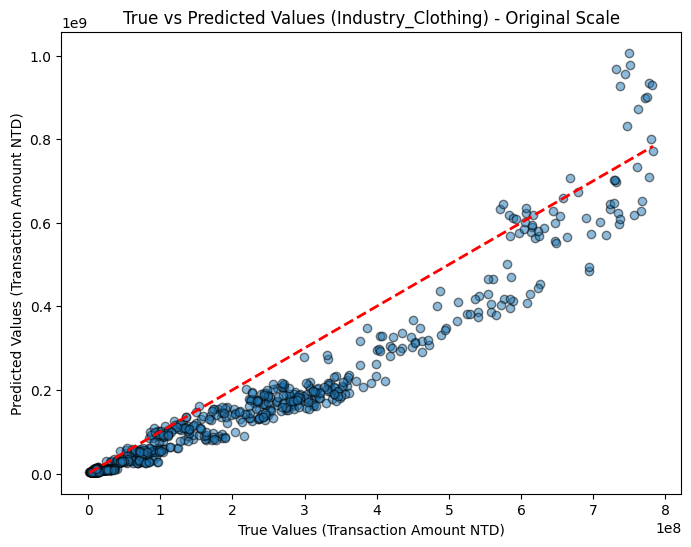


=== Modeling for Industry: Industry_Department_Store ===
Mean Squared Error (MSE) in log scale: 1.0883181800808535
Mean Absolute Error (MAE) in log scale: 0.8748671373550003
Mean Squared Error (MSE) in original scale: 3.806529382015005e+18
Mean Absolute Error (MAE) in original scale: 1051704071.8839136


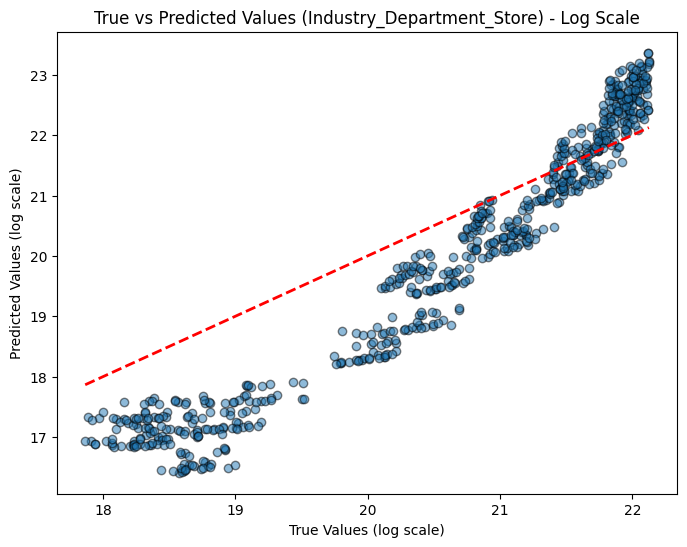

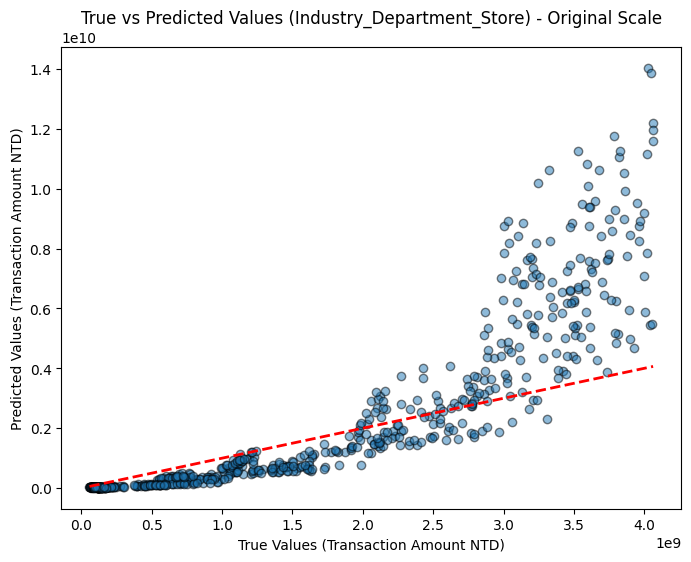


=== Modeling for Industry: Industry_Education_Entertainment ===
Mean Squared Error (MSE) in log scale: 0.3179346800504001
Mean Absolute Error (MAE) in log scale: 0.434396376123139
Mean Squared Error (MSE) in original scale: 1.5532101380012893e+17
Mean Absolute Error (MAE) in original scale: 291742422.4934272


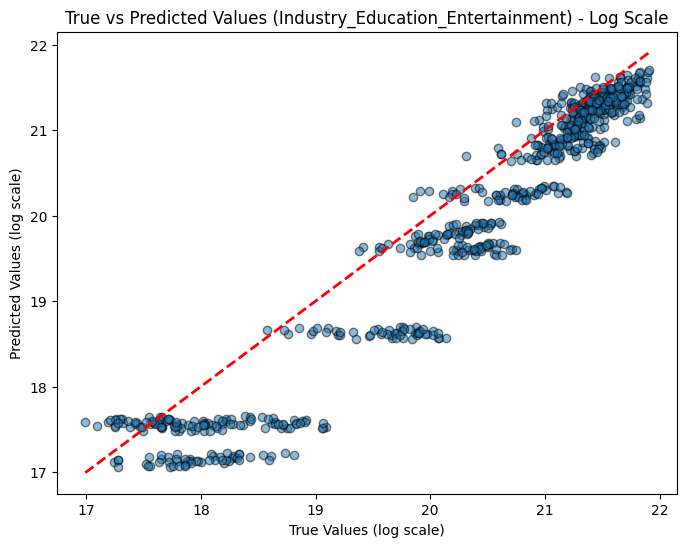

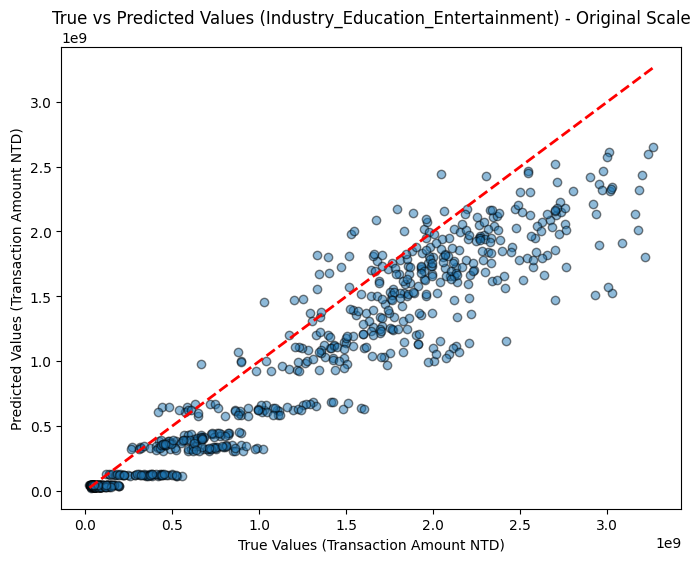


=== Modeling for Industry: Industry_Food ===
Mean Squared Error (MSE) in log scale: 0.3394028616382899
Mean Absolute Error (MAE) in log scale: 0.43638747565097946
Mean Squared Error (MSE) in original scale: 4.638119221209309e+17
Mean Absolute Error (MAE) in original scale: 428838444.25745785


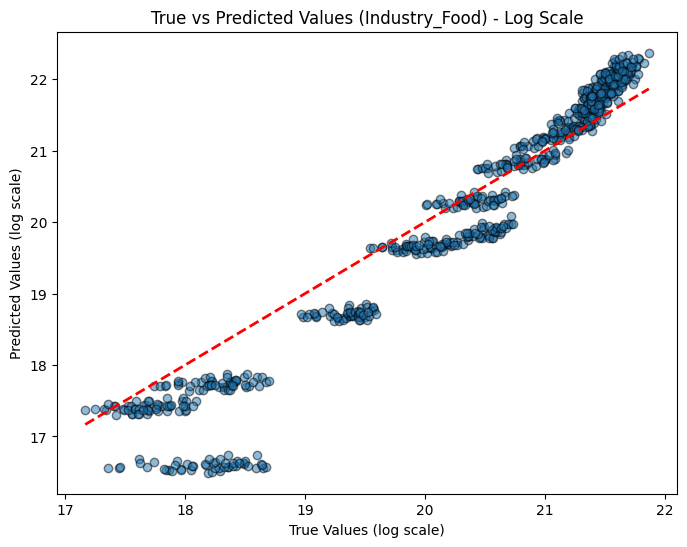

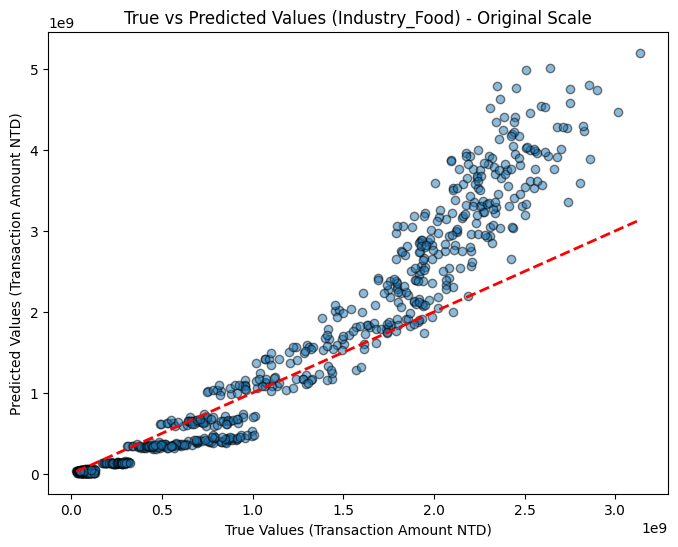


=== Modeling for Industry: Industry_Housing ===
Mean Squared Error (MSE) in log scale: 0.25880573165245835
Mean Absolute Error (MAE) in log scale: 0.3985091674355503
Mean Squared Error (MSE) in original scale: 6.408963979449259e+16
Mean Absolute Error (MAE) in original scale: 167674478.4353038


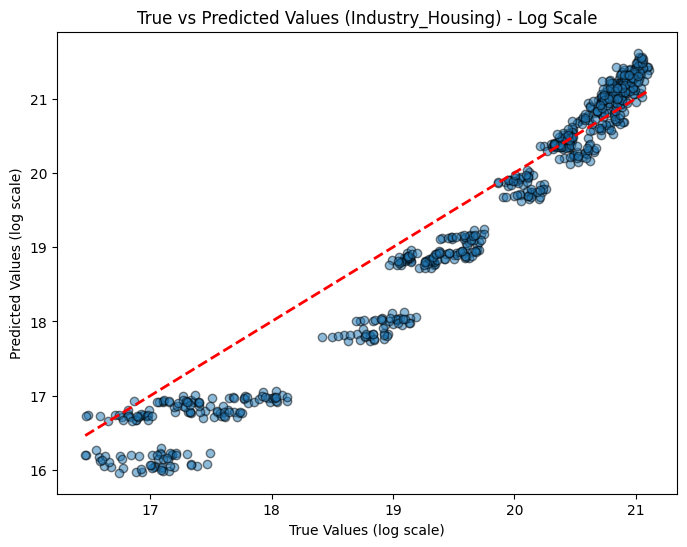

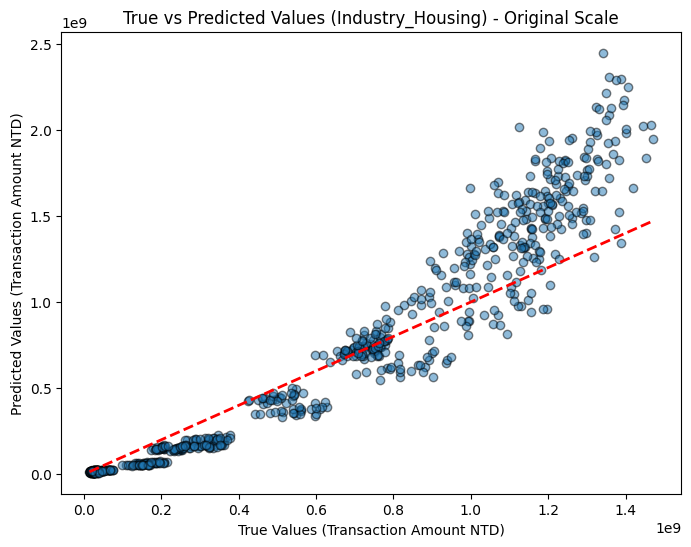


=== Modeling for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Modeling for Industry: Industry_Transportation ===
Mean Squared Error (MSE) in log scale: 0.7592444298752075
Mean Absolute Error (MAE) in log scale: 0.73011719235233
Mean Squared Error (MSE) in original scale: 1.981860856556656e+17
Mean Absolute Error (MAE) in original scale: 341747798.039625


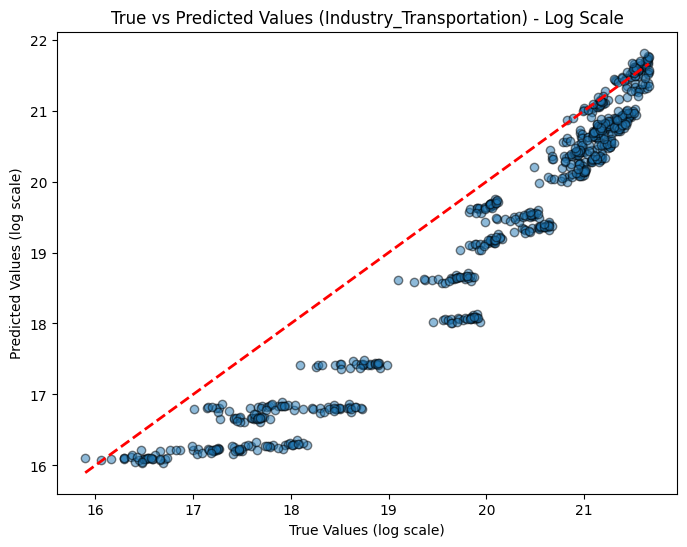

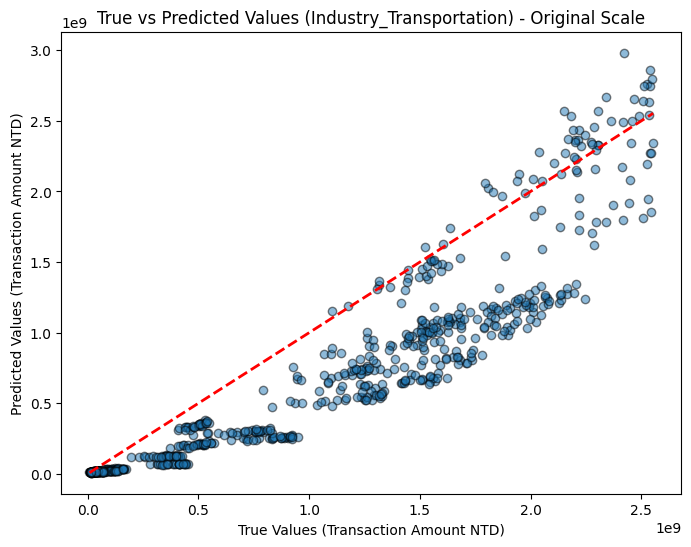

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# 定義函數：轉換日期為時間特徵
def add_time_features(df, date_column='Date'):
    """
    將日期轉換為月份和季節特徵，並加入數據框中。
    Args:
        df (pd.DataFrame): 數據框。
        date_column (str): 日期列名稱。
    Returns:
        pd.DataFrame: 增加時間特徵後的數據框。
    """
    df['Month'] = pd.to_datetime(df[date_column]).dt.month
    df['Season'] = df['Month'].apply(lambda x: (x % 12 + 3) // 3)  # 將月份分為4個季節
    return df

# 定義函數：單一產業建模與評估（加入時間特徵）
def build_model_for_industry_with_time_features(df, industry_name, target_col='Transaction Amount (NTD)'):
    """
    為特定產業數據建模與評估，並加入時間特徵。
    Args:
        df (pd.DataFrame): 數據框。
        industry_name (str): 產業名稱。
        target_col (str): 目標列名稱。
    """
    print(f"\n=== Modeling for Industry: {industry_name} ===")

    # 過濾該產業數據
    industry_data = df[df[industry_name] == 1].copy()

    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 增加時間特徵
    industry_data = add_time_features(industry_data)

    # One-hot 編碼季節特徵
    industry_data = pd.concat([industry_data, pd.get_dummies(industry_data['Season'], prefix='Season')], axis=1)
    industry_data.drop(columns=['Season'], inplace=True)

    # 分離特徵與目標
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]

    # 標準化數據
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 對目標變數取對數變換
    y_log = np.log1p(y)

    # 資料切分
    train_size = int(0.8 * len(X_scaled))
    X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
    y_train, y_test = y_log[:train_size], y_log[train_size:]

    # 初始化並訓練線性回歸模型
    linear_model = LinearRegression()
    linear_model.fit(X_train, y_train)

    # 預測
    y_pred_log = linear_model.predict(X_test)

    # 計算對數尺度的 MSE 和 MAE
    mse_log = mean_squared_error(y_test, y_pred_log)
    mae_log = mean_absolute_error(y_test, y_pred_log)
    print(f"Mean Squared Error (MSE) in log scale: {mse_log}")
    print(f"Mean Absolute Error (MAE) in log scale: {mae_log}")

    # 將預測值反變換
    y_pred_original = np.expm1(y_pred_log)
    y_test_original = np.expm1(y_test)

    # 計算原始尺度的 MSE 和 MAE
    mse_original = mean_squared_error(y_test_original, y_pred_original)
    mae_original = mean_absolute_error(y_test_original, y_pred_original)
    print(f"Mean Squared Error (MSE) in original scale: {mse_original}")
    print(f"Mean Absolute Error (MAE) in original scale: {mae_original}")

    # 繪製結果（在對數尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred_log, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test.min(), y_test.max()],
        [y_test.min(), y_test.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (log scale)")
    plt.ylabel("Predicted Values (log scale)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Log Scale")
    plt.show()

    # 繪製結果（在原始尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_original, y_pred_original, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test_original.min(), y_test_original.max()],
        [y_test_original.min(), y_test_original.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Original Scale")
    plt.show()

# 移除異常值
industry_columns = [col for col in ageGroupCombined.columns if col.startswith("Industry_")]
ageGroupCombined_cleaned = remove_outliers_per_industry(
    df=ageGroupCombined,
    amount_col='Transaction Amount (NTD)',
    industry_columns=industry_columns,
    method='iqr',
    threshold=1.5,
    min_threshold=5000
)

# 為每個產業分開建模，加入時間特徵
for industry in industry_columns:
    build_model_for_industry_with_time_features(ageGroupCombined_cleaned, industry, target_col='Transaction Amount (NTD)')


## KNN


=== Modeling for Industry: Industry_Clothing ===
Mean Squared Error (MSE) in log scale: 0.05634154516565577
Mean Absolute Error (MAE) in log scale: 0.16667614805575268
Mean Squared Error (MSE) in original scale: 1156435915726894.0
Mean Absolute Error (MAE) in original scale: 21236729.90349599


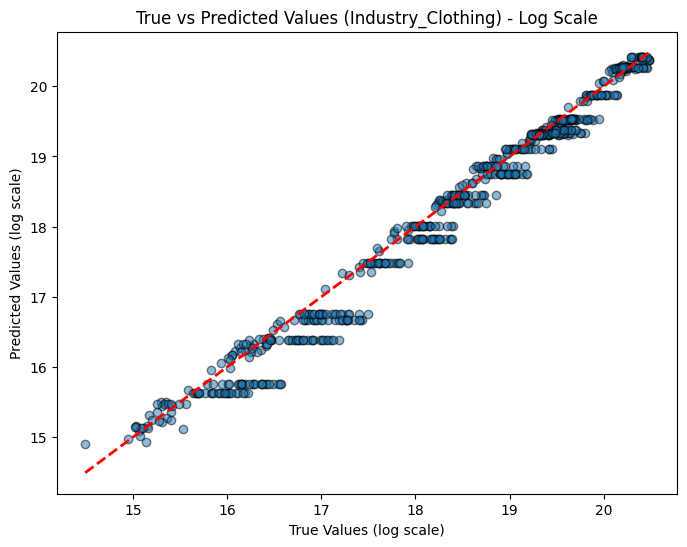

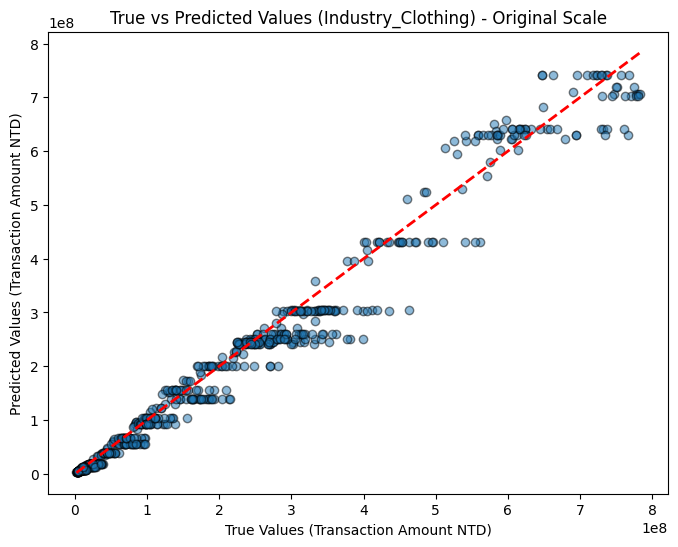


=== Modeling for Industry: Industry_Department_Store ===
Mean Squared Error (MSE) in log scale: 0.08346713397313489
Mean Absolute Error (MAE) in log scale: 0.22756108985222617
Mean Squared Error (MSE) in original scale: 1.174716668275085e+17
Mean Absolute Error (MAE) in original scale: 235601130.30753312


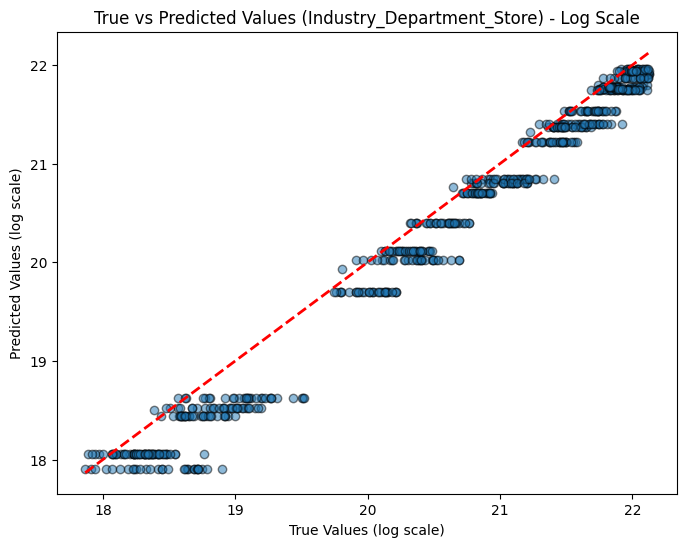

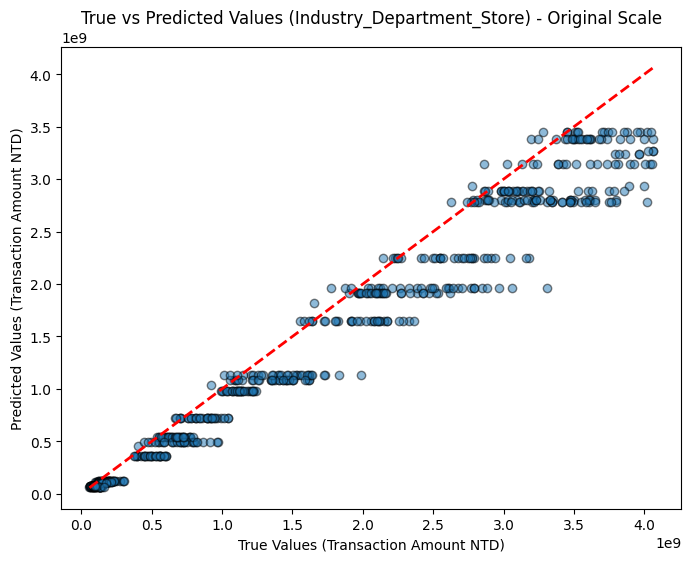


=== Modeling for Industry: Industry_Education_Entertainment ===
Mean Squared Error (MSE) in log scale: 0.4167745711820494
Mean Absolute Error (MAE) in log scale: 0.5324067443382676
Mean Squared Error (MSE) in original scale: 3.3000875199415974e+17
Mean Absolute Error (MAE) in original scale: 424805555.4527962


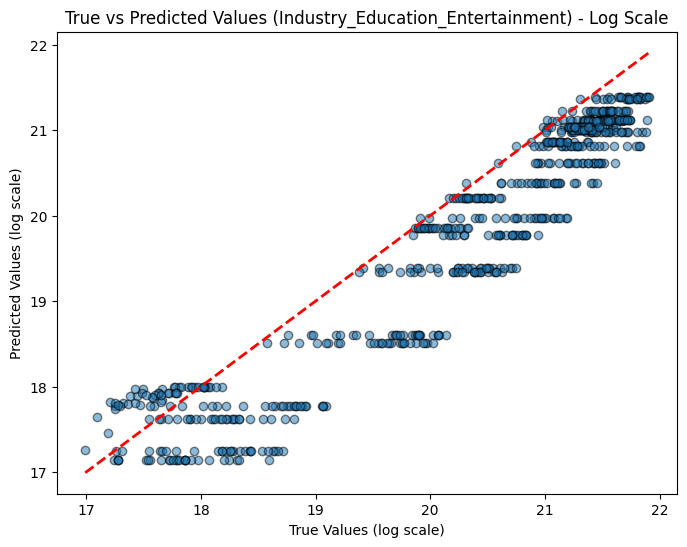

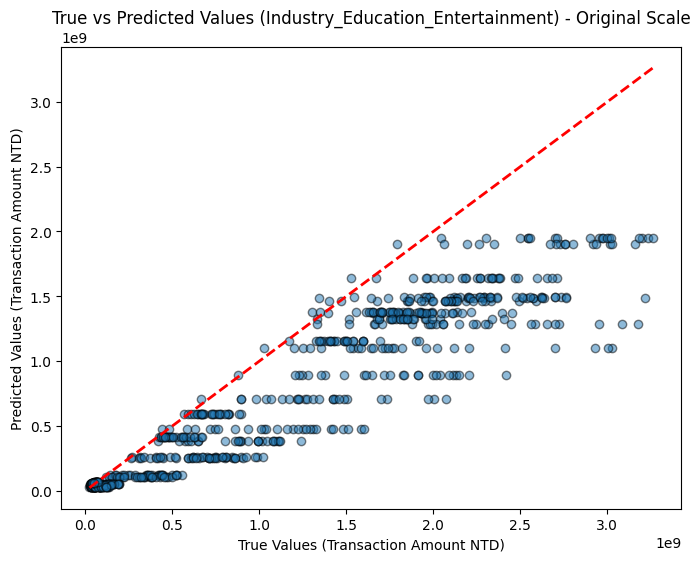


=== Modeling for Industry: Industry_Food ===
Mean Squared Error (MSE) in log scale: 0.07425044191725481
Mean Absolute Error (MAE) in log scale: 0.2101165275166197
Mean Squared Error (MSE) in original scale: 9.833924503942186e+16
Mean Absolute Error (MAE) in original scale: 216147721.74278024


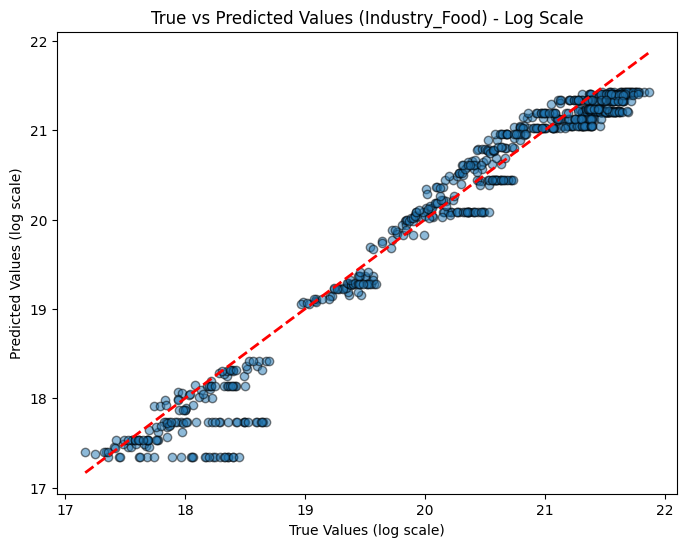

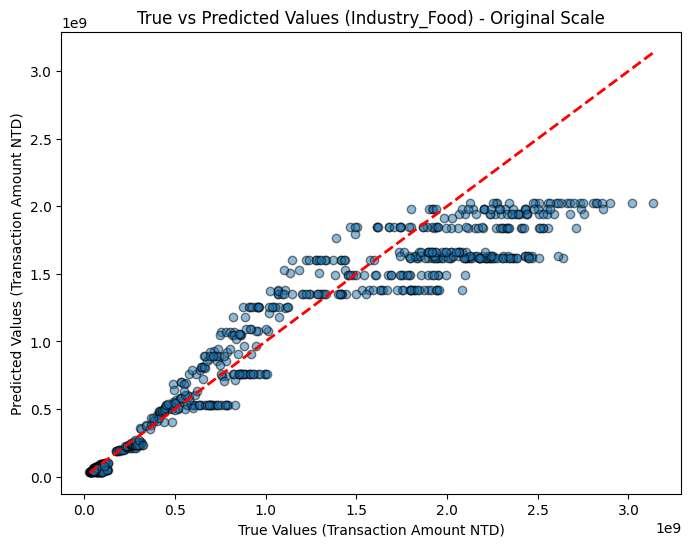


=== Modeling for Industry: Industry_Housing ===
Mean Squared Error (MSE) in log scale: 0.04879652167823729
Mean Absolute Error (MAE) in log scale: 0.14818414530627033
Mean Squared Error (MSE) in original scale: 4649516516333513.0
Mean Absolute Error (MAE) in original scale: 47843605.82116495


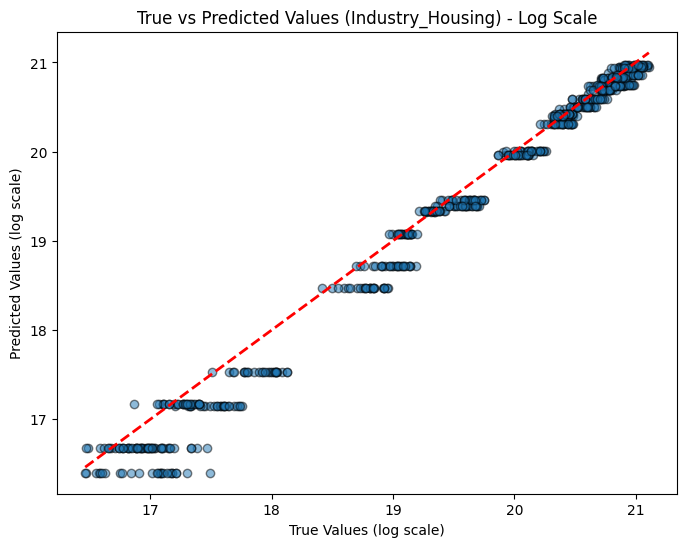

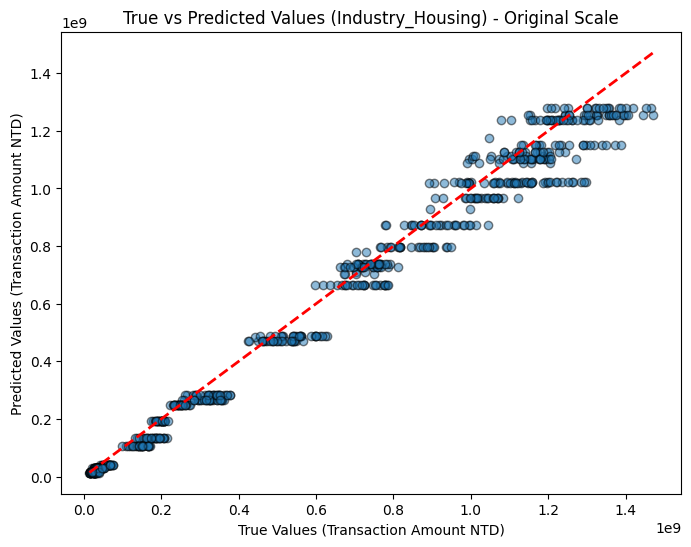


=== Modeling for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Modeling for Industry: Industry_Transportation ===
Mean Squared Error (MSE) in log scale: 0.18791139743433616
Mean Absolute Error (MAE) in log scale: 0.3867895531711335
Mean Squared Error (MSE) in original scale: 1.1807880997639552e+17
Mean Absolute Error (MAE) in original scale: 263764745.008871


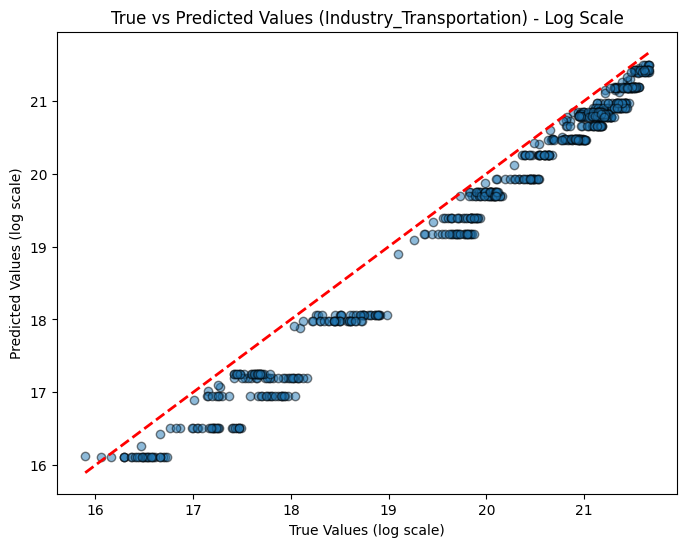

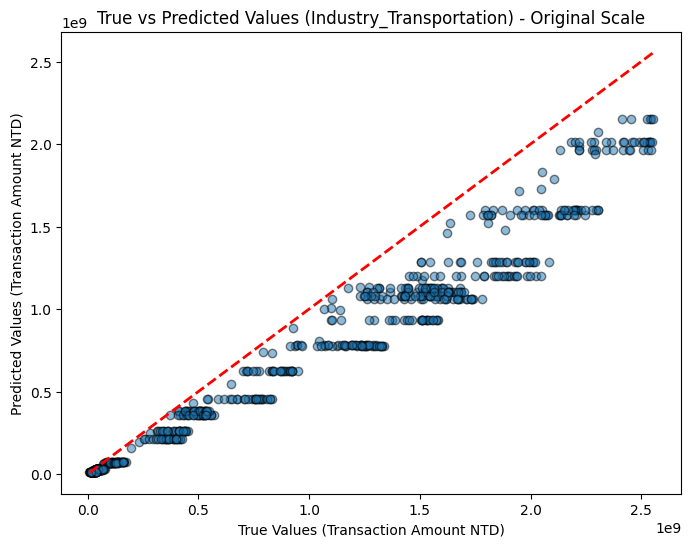

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# 定義函數：移除異常值
def remove_outliers_per_industry(df, amount_col, industry_columns, method='iqr', threshold=1.5, min_threshold=5000):
    """
    按產業類別移除目標變數的異常值，並移除低值。
    """
    cleaned_data = []
    for industry_col in industry_columns:
        industry_data = df[df[industry_col] == 1]

        if method == 'iqr':
            Q1 = industry_data[amount_col].quantile(0.25)
            Q3 = industry_data[amount_col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = max(Q1 - threshold * IQR, min_threshold)
            upper_bound = Q3 + threshold * IQR
        elif method == 'std':
            mean = industry_data[amount_col].mean()
            std = industry_data[amount_col].std()
            lower_bound = max(mean - threshold * std, min_threshold)
            upper_bound = mean + threshold * std
        else:
            raise ValueError("Unsupported method. Use 'iqr' or 'std'.")

        industry_data_cleaned = industry_data[
            (industry_data[amount_col] >= lower_bound) & (industry_data[amount_col] <= upper_bound)
        ]
        cleaned_data.append(industry_data_cleaned)

    return pd.concat(cleaned_data, ignore_index=True)

# 定義函數：單一產業建模與評估
def build_knn_model_for_industry(df, industry_name, target_col='Transaction Amount (NTD)', n_neighbors=10):
    """
    為特定產業數據建模與評估。
    Args:
        df (pd.DataFrame): 數據框。
        industry_name (str): 產業名稱。
        target_col (str): 目標列名稱。
        n_neighbors (int): KNN 的鄰居數量。
    """
    print(f"\n=== Modeling for Industry: {industry_name} ===")

    # 過濾該產業數據
    industry_data = df[df[industry_name] == 1].copy()

    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 分離特徵與目標
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]

    # 標準化數據
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 對目標變數取對數變換
    y_log = np.log1p(y)

    # 資料切分
    train_size = int(0.8 * len(X_scaled))
    X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
    y_train, y_test = y_log[:train_size], y_log[train_size:]

    # 初始化並訓練 KNN 模型
    knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
    knn_model.fit(X_train, y_train)

    # 預測
    y_pred_log = knn_model.predict(X_test)

    # 計算對數尺度的 MSE 和 MAE
    mse_log = mean_squared_error(y_test, y_pred_log)
    mae_log = mean_absolute_error(y_test, y_pred_log)
    print(f"Mean Squared Error (MSE) in log scale: {mse_log}")
    print(f"Mean Absolute Error (MAE) in log scale: {mae_log}")

    # 將預測值反變換
    y_pred_original = np.expm1(y_pred_log)
    y_test_original = np.expm1(y_test)

    # 計算原始尺度的 MSE 和 MAE
    mse_original = mean_squared_error(y_test_original, y_pred_original)
    mae_original = mean_absolute_error(y_test_original, y_pred_original)
    print(f"Mean Squared Error (MSE) in original scale: {mse_original}")
    print(f"Mean Absolute Error (MAE) in original scale: {mae_original}")

    # 繪製結果（在對數尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred_log, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test.min(), y_test.max()],
        [y_test.min(), y_test.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (log scale)")
    plt.ylabel("Predicted Values (log scale)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Log Scale")
    plt.show()

    # 繪製結果（在原始尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_original, y_pred_original, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test_original.min(), y_test_original.max()],
        [y_test_original.min(), y_test_original.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Original Scale")
    plt.show()

# 移除異常值
industry_columns = [col for col in ageGroupCombined.columns if col.startswith("Industry_")]
ageGroupCombined_cleaned = remove_outliers_per_industry(
    df=ageGroupCombined,
    amount_col='Transaction Amount (NTD)',
    industry_columns=industry_columns,
    method='iqr',
    threshold=1.5,
    min_threshold=5000
)

# 為每個產業分開建模
for industry in industry_columns:
    build_knn_model_for_industry(ageGroupCombined_cleaned, industry, target_col='Transaction Amount (NTD)', n_neighbors=10)



=== Testing K Values for Industry: Industry_Clothing ===


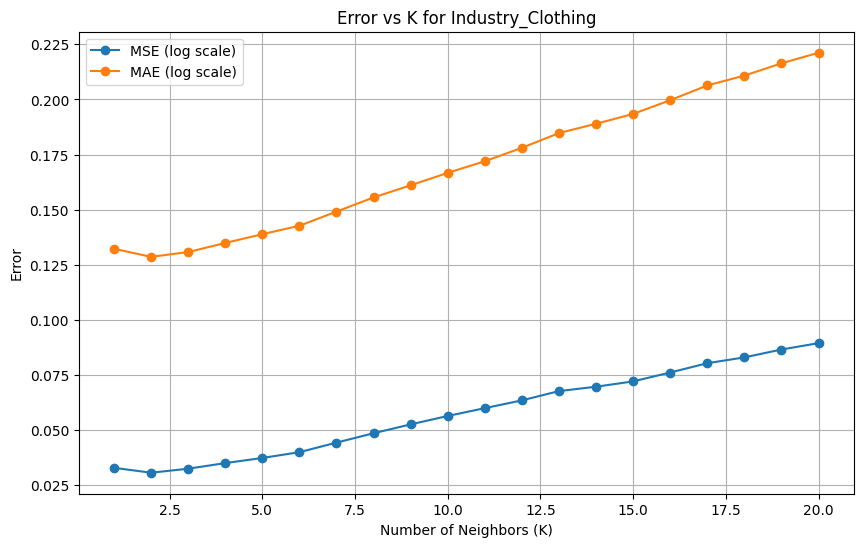

Best K: 2 with MSE: 0.030585406011180115

=== Testing K Values for Industry: Industry_Department_Store ===


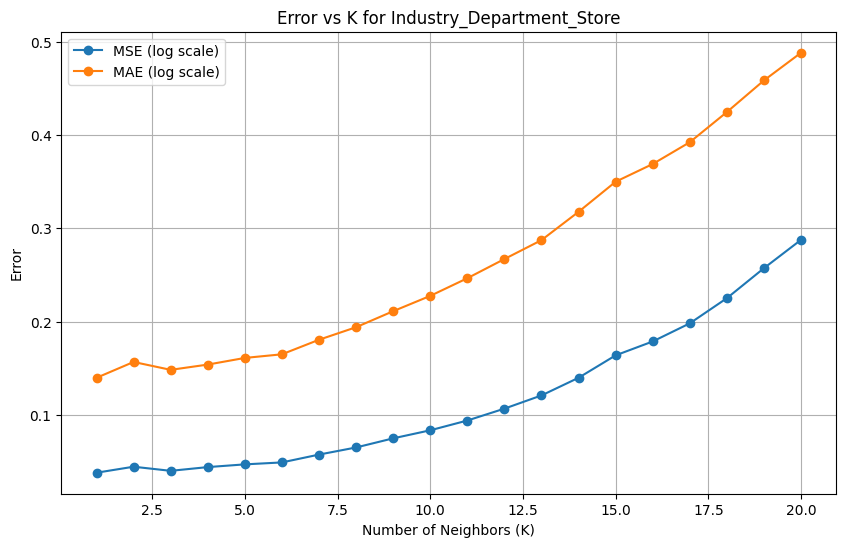

Best K: 1 with MSE: 0.03798348505571489

=== Testing K Values for Industry: Industry_Education_Entertainment ===


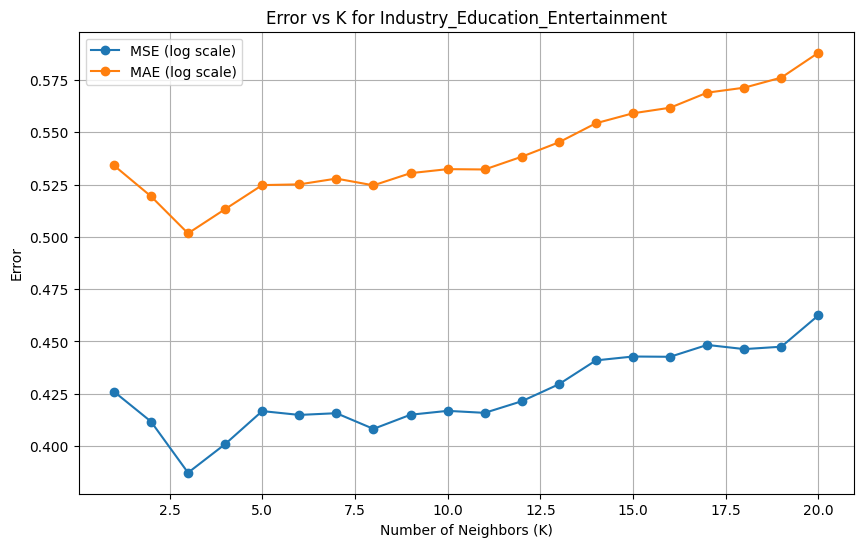

Best K: 3 with MSE: 0.38717799007397286

=== Testing K Values for Industry: Industry_Food ===


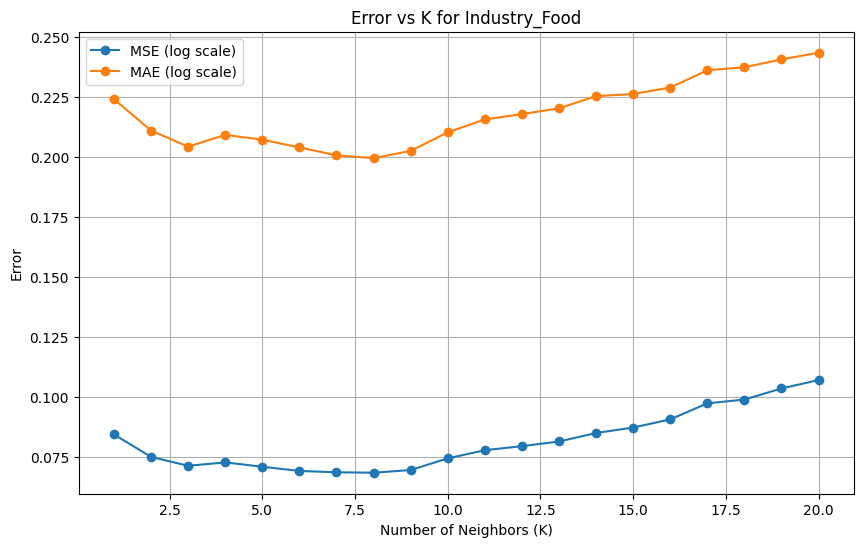

Best K: 8 with MSE: 0.06827520631836395

=== Testing K Values for Industry: Industry_Housing ===


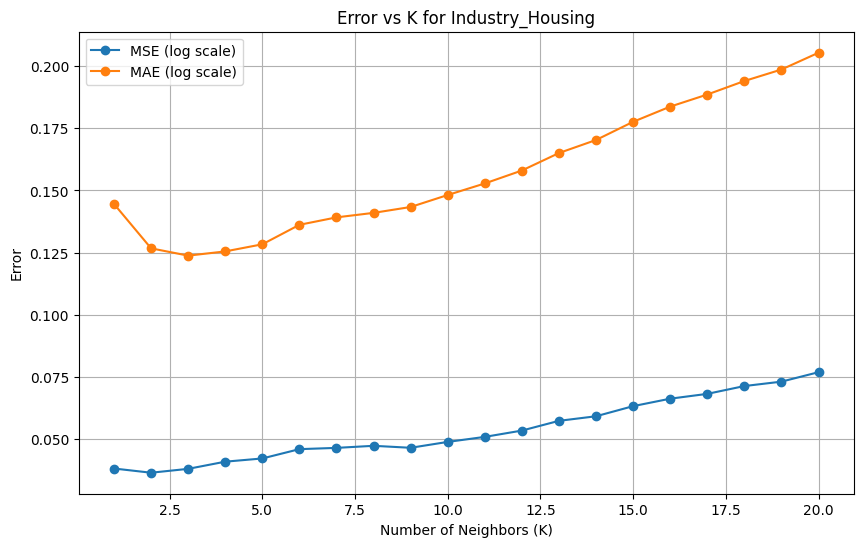

Best K: 2 with MSE: 0.036392150259375255

=== Testing K Values for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Testing K Values for Industry: Industry_Transportation ===


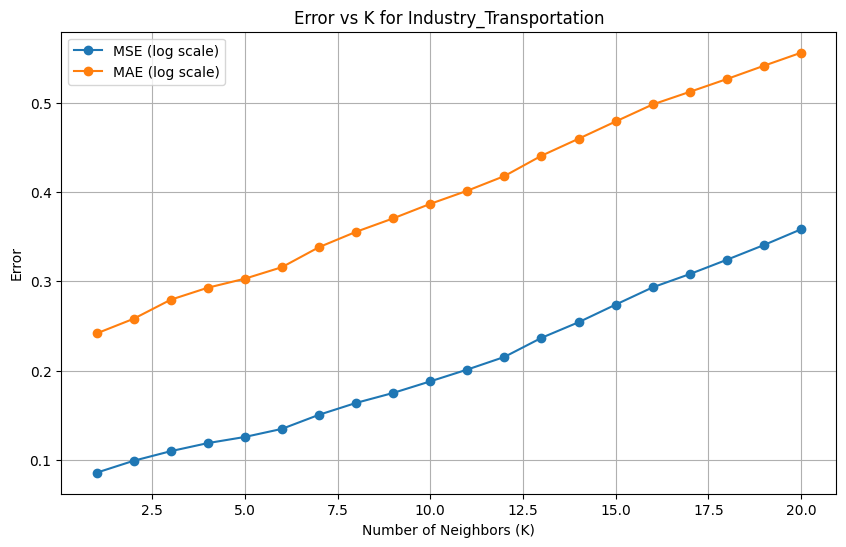

Best K: 1 with MSE: 0.08555245507627468


In [ ]:
# 定義函數：測試不同的 K 值
def test_knn_with_different_k(df, industry_name, target_col='Transaction Amount (NTD)', k_range=range(1, 21)):
    """
    測試不同的 K 值並繪製誤差曲線。
    Args:
        df (pd.DataFrame): 數據框。
        industry_name (str): 產業名稱。
        target_col (str): 目標列名稱。
        k_range (range): K 值範圍。
    """
    print(f"\n=== Testing K Values for Industry: {industry_name} ===")

    # 過濾該產業數據
    industry_data = df[df[industry_name] == 1].copy()

    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 分離特徵與目標
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]

    # 標準化數據
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 對目標變數取對數變換
    y_log = np.log1p(y)

    # 資料切分
    train_size = int(0.8 * len(X_scaled))
    X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
    y_train, y_test = y_log[:train_size], y_log[train_size:]

    # 儲存不同 K 值的誤差
    mse_scores = []
    mae_scores = []

    for k in k_range:
        # 初始化並訓練 KNN 模型
        knn_model = KNeighborsRegressor(n_neighbors=k)
        knn_model.fit(X_train, y_train)

        # 預測
        y_pred_log = knn_model.predict(X_test)

        # 計算誤差
        mse_log = mean_squared_error(y_test, y_pred_log)
        mae_log = mean_absolute_error(y_test, y_pred_log)
        mse_scores.append(mse_log)
        mae_scores.append(mae_log)

    # 繪製誤差曲線
    plt.figure(figsize=(10, 6))
    plt.plot(k_range, mse_scores, label="MSE (log scale)", marker='o')
    plt.plot(k_range, mae_scores, label="MAE (log scale)", marker='o')
    plt.xlabel("Number of Neighbors (K)")
    plt.ylabel("Error")
    plt.title(f"Error vs K for {industry_name}")
    plt.legend()
    plt.grid()
    plt.show()

    # 找到最佳 K 值
    best_k = k_range[np.argmin(mse_scores)]
    print(f"Best K: {best_k} with MSE: {min(mse_scores)}")

# 為每個產業測試不同 K 值
for industry in industry_columns:
    test_knn_with_different_k(ageGroupCombined_cleaned, industry, target_col='Transaction Amount (NTD)', k_range=range(1, 21))


## KNN with 'date' feature


=== Modeling for Industry: Industry_Clothing ===
Mean Squared Error (MSE) in log scale: 0.29003355862114166
Mean Absolute Error (MAE) in log scale: 0.44590079795750526
Mean Squared Error (MSE) in original scale: 4980026940282138.0
Mean Absolute Error (MAE) in original scale: 52813898.411173426


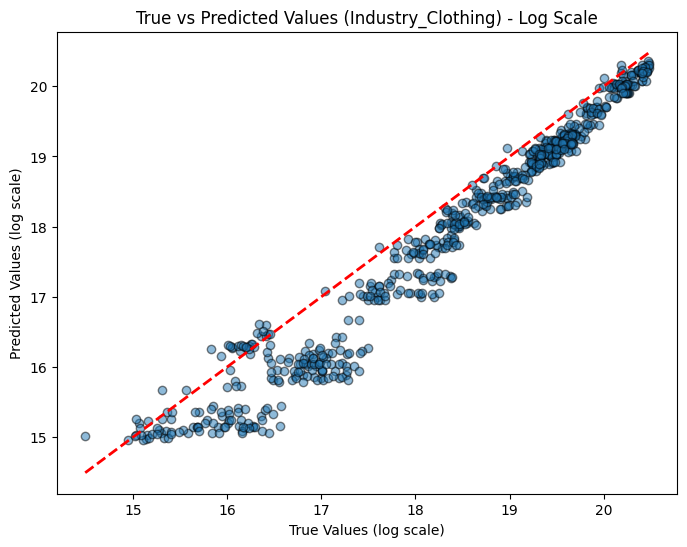

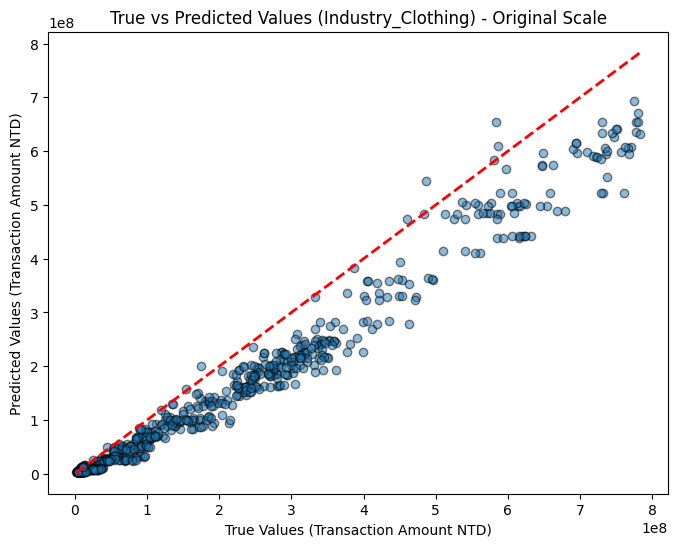


=== Modeling for Industry: Industry_Department_Store ===
Mean Squared Error (MSE) in log scale: 1.276057898132459
Mean Absolute Error (MAE) in log scale: 1.0406946821860452
Mean Squared Error (MSE) in original scale: 1.0469236672020731e+18
Mean Absolute Error (MAE) in original scale: 799629667.419167


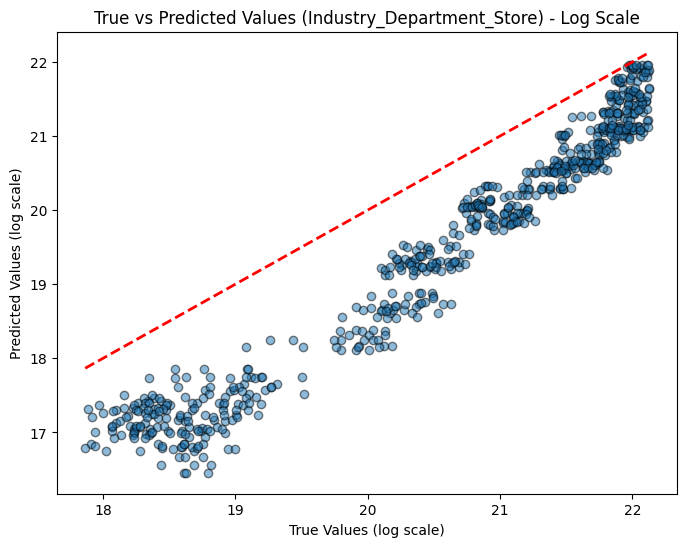

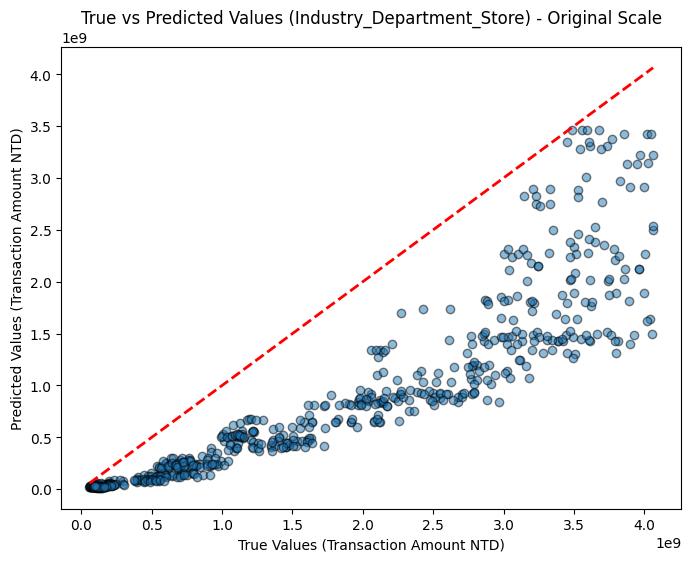


=== Modeling for Industry: Industry_Education_Entertainment ===
Mean Squared Error (MSE) in log scale: 0.4206273773929746
Mean Absolute Error (MAE) in log scale: 0.5668944120621018
Mean Squared Error (MSE) in original scale: 3.758774696451026e+17
Mean Absolute Error (MAE) in original scale: 467376822.72148633


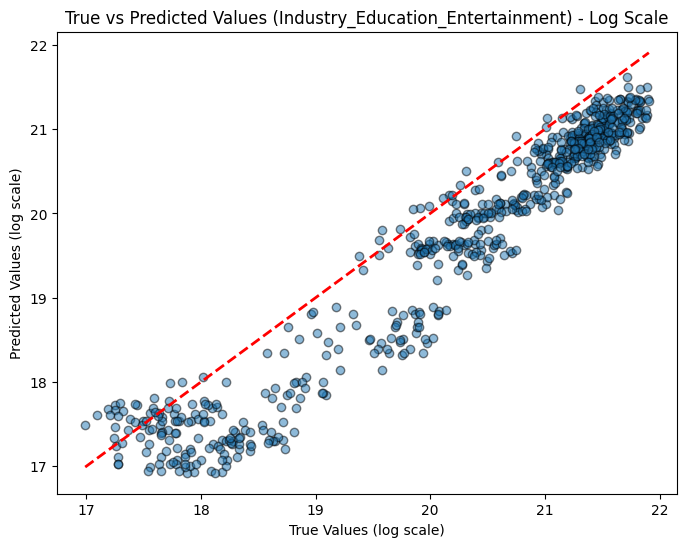

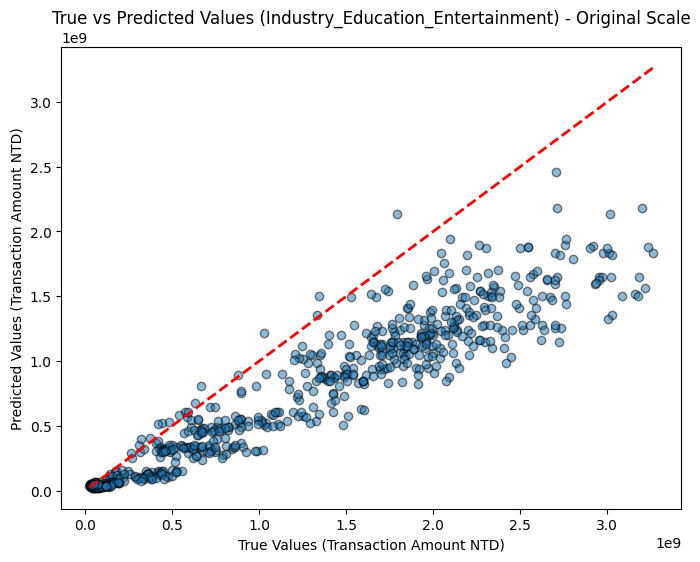


=== Modeling for Industry: Industry_Food ===
Mean Squared Error (MSE) in log scale: 0.31351470780555946
Mean Absolute Error (MAE) in log scale: 0.40551486688269284
Mean Squared Error (MSE) in original scale: 1.478152094529329e+17
Mean Absolute Error (MAE) in original scale: 275249412.15842265


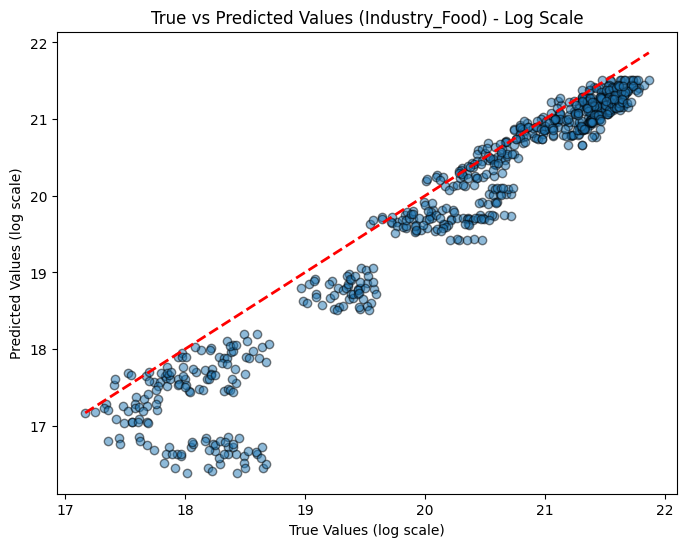

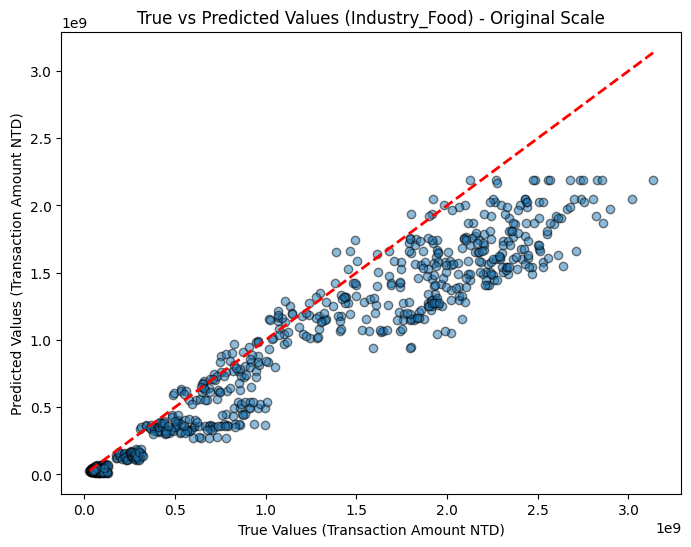


=== Modeling for Industry: Industry_Housing ===
Mean Squared Error (MSE) in log scale: 0.25866496287247737
Mean Absolute Error (MAE) in log scale: 0.41277251078313376
Mean Squared Error (MSE) in original scale: 3.4600427198576176e+16
Mean Absolute Error (MAE) in original scale: 150730972.4485539


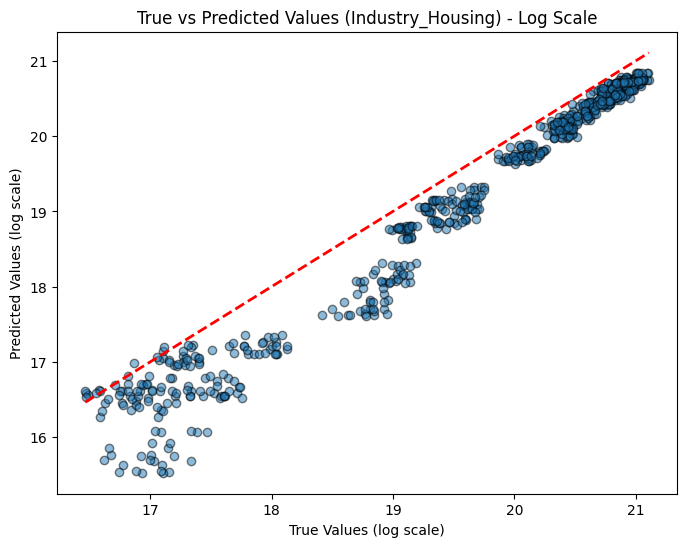

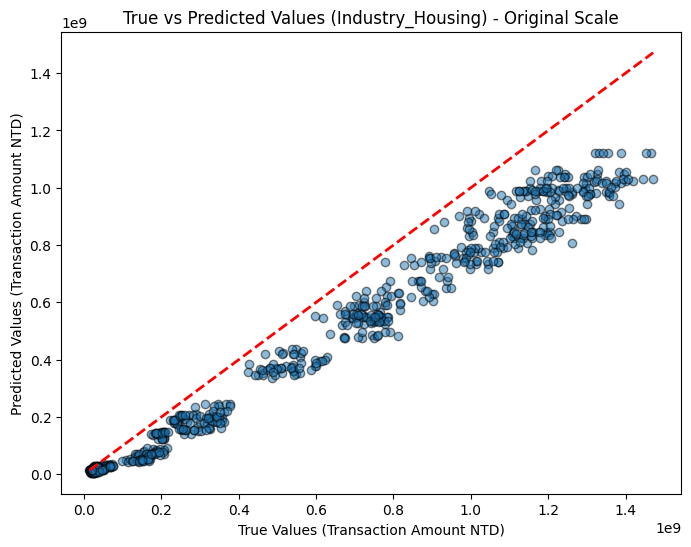


=== Modeling for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Modeling for Industry: Industry_Transportation ===
Mean Squared Error (MSE) in log scale: 0.7890861421610286
Mean Absolute Error (MAE) in log scale: 0.821973952526109
Mean Squared Error (MSE) in original scale: 3.439737062546158e+17
Mean Absolute Error (MAE) in original scale: 468762019.4027233


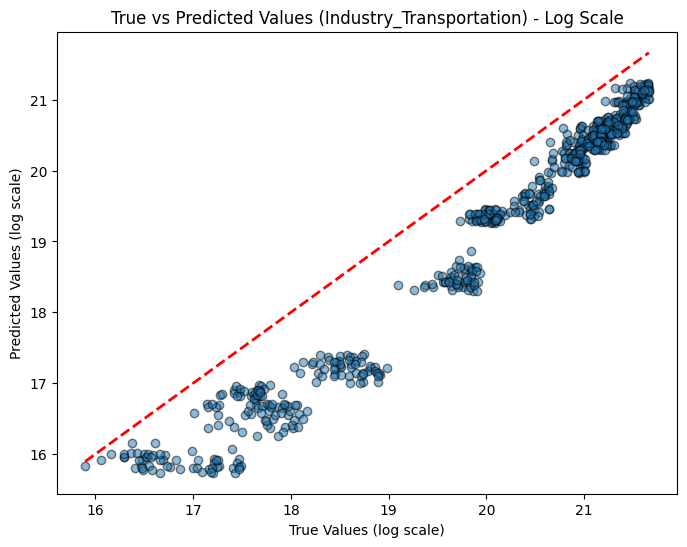

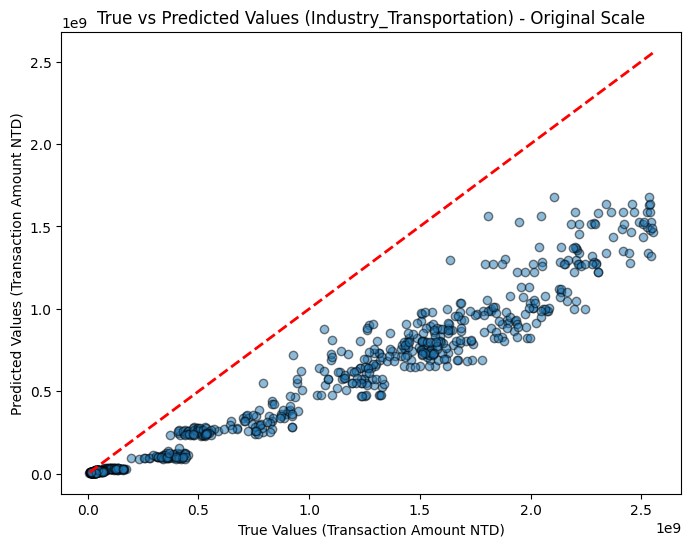


=== Testing K Values for Industry: Industry_Clothing ===


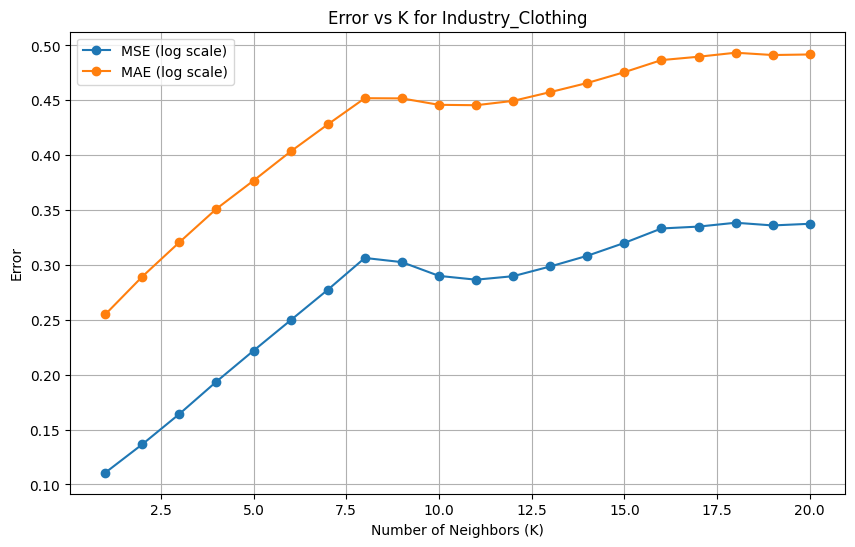

Best K: 1 with MSE: 0.11070058743756922

=== Testing K Values for Industry: Industry_Department_Store ===


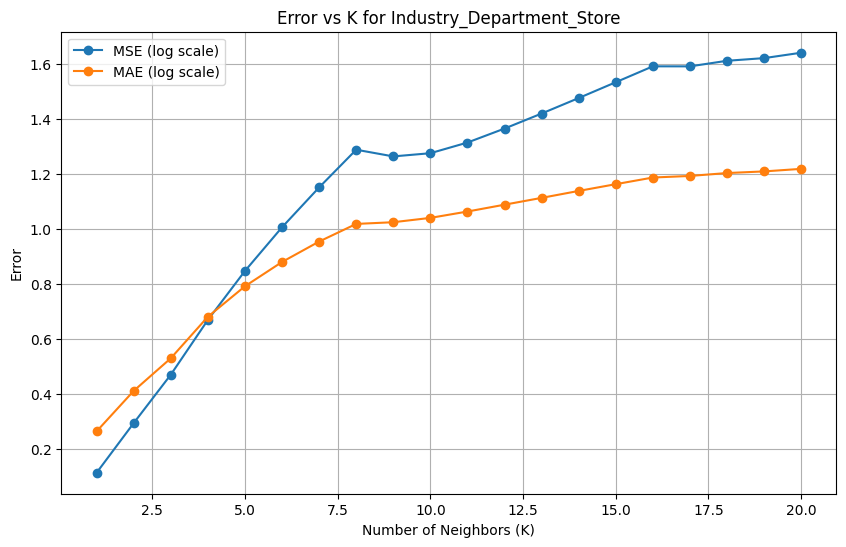

Best K: 1 with MSE: 0.11337452310571289

=== Testing K Values for Industry: Industry_Education_Entertainment ===


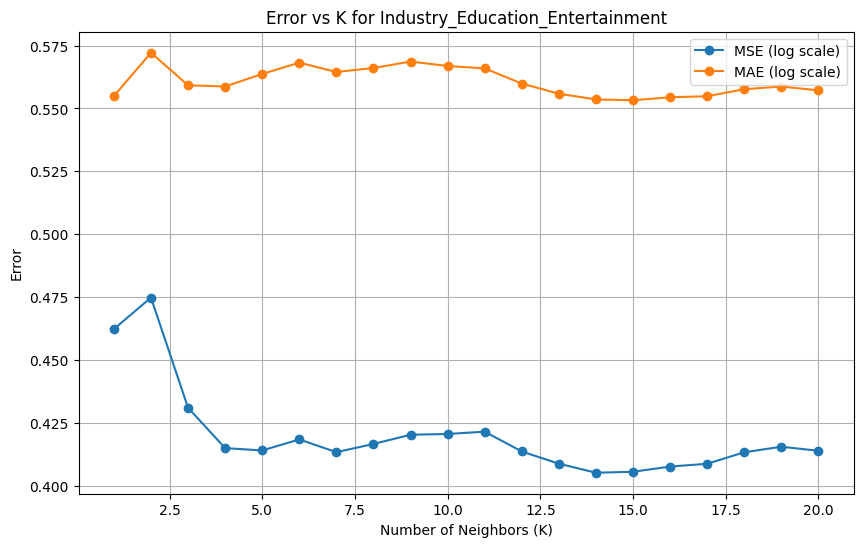

Best K: 14 with MSE: 0.40522537293035005

=== Testing K Values for Industry: Industry_Food ===


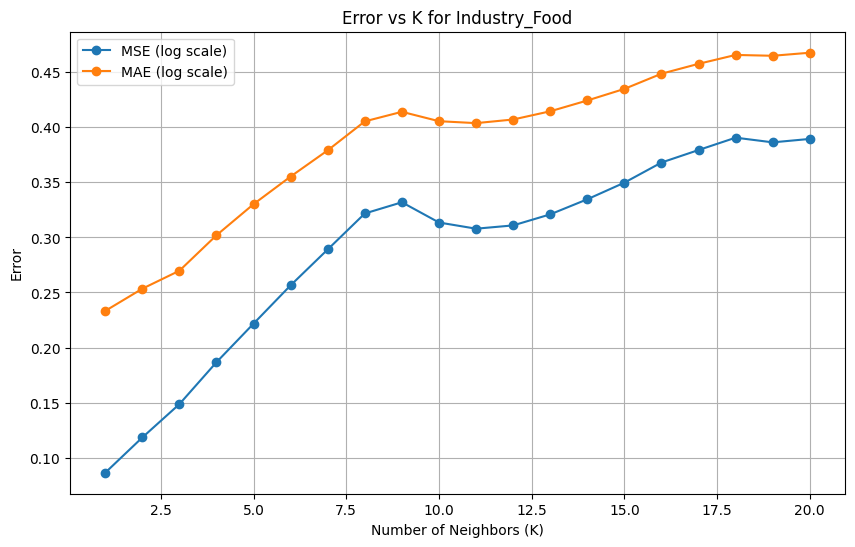

Best K: 1 with MSE: 0.0862964913764013

=== Testing K Values for Industry: Industry_Housing ===


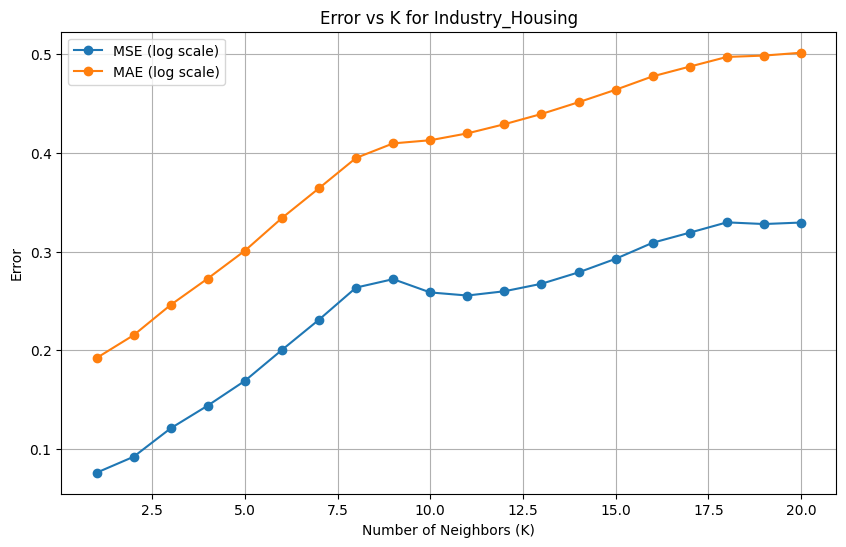

Best K: 1 with MSE: 0.07611632685206608

=== Testing K Values for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Testing K Values for Industry: Industry_Transportation ===


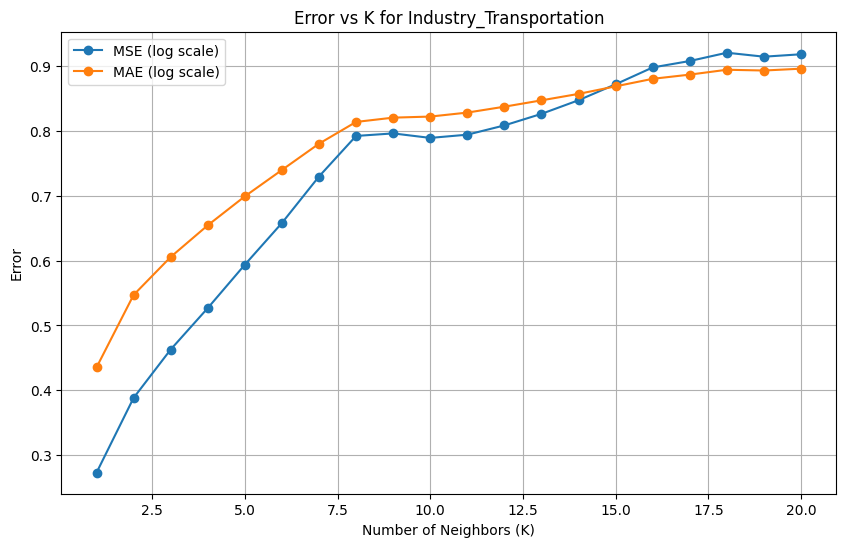

Best K: 1 with MSE: 0.2730173793559001


In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# 定義函數：轉換日期為時間特徵
def add_time_features(df, date_column='Date'):
    """
    將日期轉換為月份和季節特徵，並加入數據框中。
    Args:
        df (pd.DataFrame): 數據框。
        date_column (str): 日期列名稱。
    Returns:
        pd.DataFrame: 增加時間特徵後的數據框。
    """
    df['Month'] = pd.to_datetime(df[date_column]).dt.month
    df['Season'] = df['Month'].apply(lambda x: (x % 12 + 3) // 3)  # 將月份分為4個季節
    return df

# 更新的函數：單一產業建模與評估（加入時間特徵）
def build_knn_model_for_industry_with_time_features(df, industry_name, target_col='Transaction Amount (NTD)', n_neighbors=10):
    """
    為特定產業數據建模與評估，並加入時間特徵。
    Args:
        df (pd.DataFrame): 數據框。
        industry_name (str): 產業名稱。
        target_col (str): 目標列名稱。
        n_neighbors (int): KNN 的鄰居數量。
    """
    print(f"\n=== Modeling for Industry: {industry_name} ===")

    # 過濾該產業數據
    industry_data = df[df[industry_name] == 1].copy()

    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 增加時間特徵
    industry_data = add_time_features(industry_data)

    # One-hot 編碼季節特徵
    industry_data = pd.concat([industry_data, pd.get_dummies(industry_data['Season'], prefix='Season')], axis=1)
    industry_data.drop(columns=['Season'], inplace=True)

    # 分離特徵與目標
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]

    # 標準化數據
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 對目標變數取對數變換
    y_log = np.log1p(y)

    # 資料切分
    train_size = int(0.8 * len(X_scaled))
    X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
    y_train, y_test = y_log[:train_size], y_log[train_size:]

    # 初始化並訓練 KNN 模型
    knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
    knn_model.fit(X_train, y_train)

    # 預測
    y_pred_log = knn_model.predict(X_test)

    # 計算對數尺度的 MSE 和 MAE
    mse_log = mean_squared_error(y_test, y_pred_log)
    mae_log = mean_absolute_error(y_test, y_pred_log)
    print(f"Mean Squared Error (MSE) in log scale: {mse_log}")
    print(f"Mean Absolute Error (MAE) in log scale: {mae_log}")

    # 將預測值反變換
    y_pred_original = np.expm1(y_pred_log)
    y_test_original = np.expm1(y_test)

    # 計算原始尺度的 MSE 和 MAE
    mse_original = mean_squared_error(y_test_original, y_pred_original)
    mae_original = mean_absolute_error(y_test_original, y_pred_original)
    print(f"Mean Squared Error (MSE) in original scale: {mse_original}")
    print(f"Mean Absolute Error (MAE) in original scale: {mae_original}")

    # 繪製結果（在對數尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred_log, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test.min(), y_test.max()],
        [y_test.min(), y_test.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (log scale)")
    plt.ylabel("Predicted Values (log scale)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Log Scale")
    plt.show()

    # 繪製結果（在原始尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_original, y_pred_original, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test_original.min(), y_test_original.max()],
        [y_test_original.min(), y_test_original.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Original Scale")
    plt.show()

# 為每個產業分開建模，加入時間特徵
for industry in industry_columns:
    build_knn_model_for_industry_with_time_features(ageGroupCombined_cleaned, industry, target_col='Transaction Amount (NTD)', n_neighbors=10)

# 更新的函數：測試不同的 K 值（加入時間特徵）
def test_knn_with_different_k_and_time_features(df, industry_name, target_col='Transaction Amount (NTD)', k_range=range(1, 21)):
    """
    測試不同的 K 值並繪製誤差曲線，加入時間特徵。
    Args:
        df (pd.DataFrame): 數據框。
        industry_name (str): 產業名稱。
        target_col (str): 目標列名稱。
        k_range (range): K 值範圍。
    """
    print(f"\n=== Testing K Values for Industry: {industry_name} ===")

    # 過濾該產業數據
    industry_data = df[df[industry_name] == 1].copy()

    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 增加時間特徵
    industry_data = add_time_features(industry_data)

    # One-hot 編碼季節特徵
    industry_data = pd.concat([industry_data, pd.get_dummies(industry_data['Season'], prefix='Season')], axis=1)
    industry_data.drop(columns=['Season'], inplace=True)

    # 分離特徵與目標
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]

    # 標準化數據
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 對目標變數取對數變換
    y_log = np.log1p(y)

    # 資料切分
    train_size = int(0.8 * len(X_scaled))
    X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
    y_train, y_test = y_log[:train_size], y_log[train_size:]

    # 儲存不同 K 值的誤差
    mse_scores = []
    mae_scores = []

    for k in k_range:
        # 初始化並訓練 KNN 模型
        knn_model = KNeighborsRegressor(n_neighbors=k)
        knn_model.fit(X_train, y_train)

        # 預測
        y_pred_log = knn_model.predict(X_test)

        # 計算誤差
        mse_log = mean_squared_error(y_test, y_pred_log)
        mae_log = mean_absolute_error(y_test, y_pred_log)
        mse_scores.append(mse_log)
        mae_scores.append(mae_log)

    # 繪製誤差曲線
    plt.figure(figsize=(10, 6))
    plt.plot(k_range, mse_scores, label="MSE (log scale)", marker='o')
    plt.plot(k_range, mae_scores, label="MAE (log scale)", marker='o')
    plt.xlabel("Number of Neighbors (K)")
    plt.ylabel("Error")
    plt.title(f"Error vs K for {industry_name}")
    plt.legend()
    plt.grid()
    plt.show()

    # 找到最佳 K 值
    best_k = k_range[np.argmin(mse_scores)]
    print(f"Best K: {best_k} with MSE: {min(mse_scores)}")

# 為每個產業測試不同 K 值（加入時間特徵）
for industry in industry_columns:
    test_knn_with_different_k_and_time_features(ageGroupCombined_cleaned, industry, target_col='Transaction Amount (NTD)', k_range=range(1, 21))


## LSTM


=== Modeling for Industry: Industry_Clothing ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


35/35 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - loss: 306.9208 - mae: 17.2971 - val_loss: 94.1544 - val_mae: 9.2921
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 34.8071 - mae: 4.5296 - val_loss: 2.9554 - val_mae: 1.4594
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 3.0839 - mae: 1.4707 - val_loss: 1.7750 - val_mae: 1.1125
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 1.8048 - mae: 1.0972 - val_loss: 1.2864 - val_mae: 0.9133
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 1.3639 - mae: 0.9168 - val_loss: 0.9612 - val_mae: 0.7593
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 1.0528 - mae: 0.8018 - val_loss: 0.7048 - val_mae: 0.6193
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.8414 - mae: 0.7224 - val_loss: 0.5523 - val_mae: 0.5579
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.7577 - mae: 0.6922 - val_loss: 0.5316 - val_mae: 0.5529
Epoch 9/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 0.6655 - ma

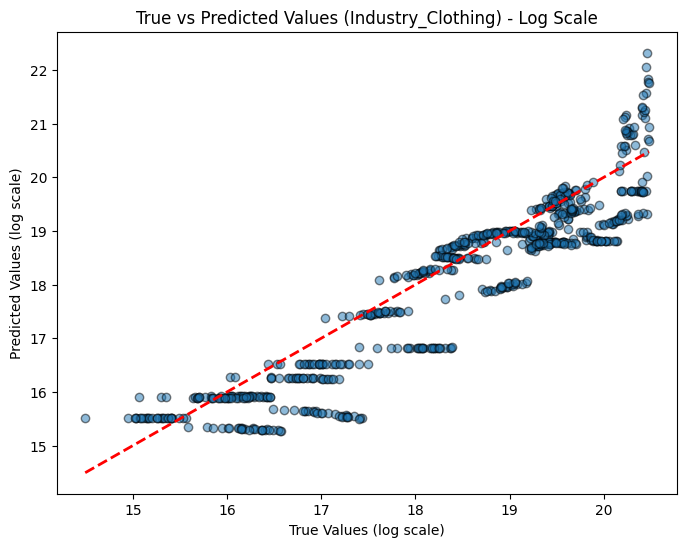

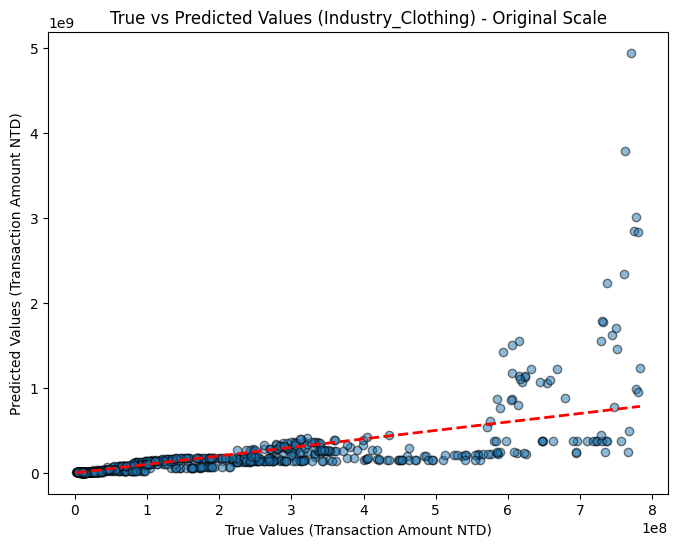


=== Modeling for Industry: Industry_Department_Store ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 350.3336 - mae: 18.4013 - val_loss: 610.5121 - val_mae: 14.9330
Epoch 2/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 37.2636 - mae: 4.5679 - val_loss: 12.0021 - val_mae: 2.4822
Epoch 3/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 4.1721 - mae: 1.6300 - val_loss: 4.3626 - val_mae: 1.6732
Epoch 4/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 2.2869 - mae: 1.2526 - val_loss: 2.8410 - val_mae: 1.3651
Epoch 5/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 1.6875 - mae: 1.0729 - val_loss: 1.8311 - val_mae: 1.0884
Epoch 6/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 1.2945 - mae: 0.9316 - val_loss: 1.5205 - val_mae: 1.0024
Epoch 7/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 1.0008 - mae: 0.8159 - val_loss: 0.9343 - val_mae: 0.7506
Epoch 8/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 0.8078 - mae: 0.7173 - val_loss: 1.4345 - val_mae: 0.9876
Epoch 9/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.6203 -

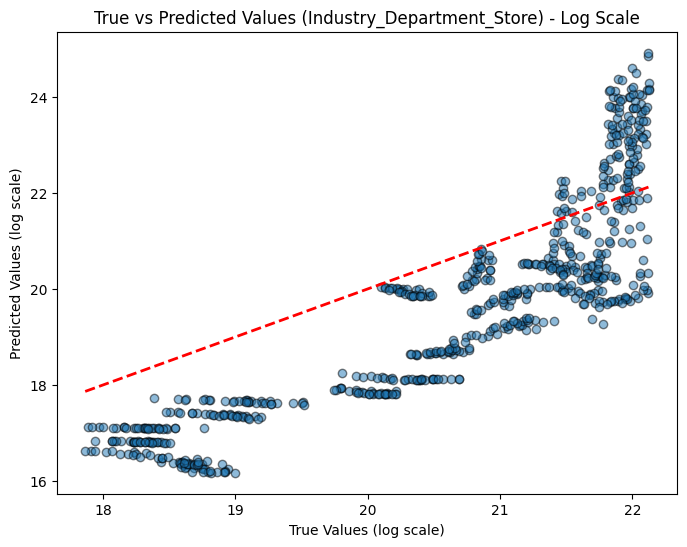

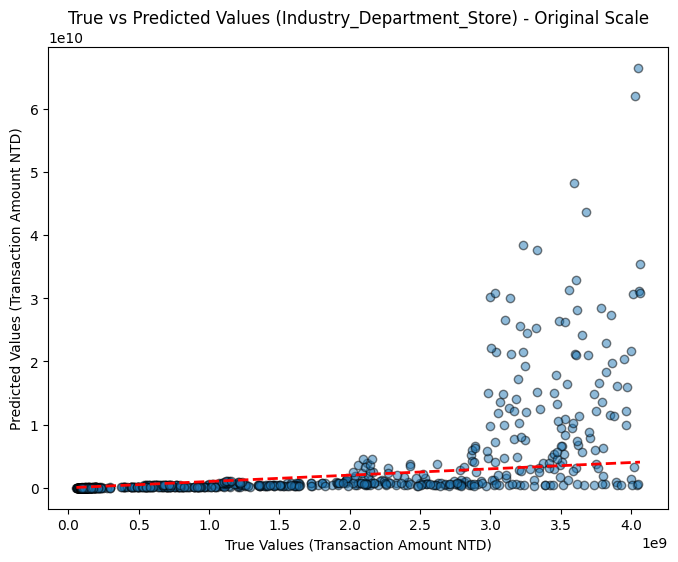


=== Modeling for Industry: Industry_Education_Entertainment ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 369.3466 - mae: 18.9323 - val_loss: 178.1241 - val_mae: 13.2409
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 96.3682 - mae: 8.3480 - val_loss: 10.5736 - val_mae: 2.8219
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 3.8392 - mae: 1.6234 - val_loss: 3.8937 - val_mae: 1.5750
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 2.1817 - mae: 1.2801 - val_loss: 3.0340 - val_mae: 1.3461
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 1.7198 - mae: 1.1264 - val_loss: 3.1109 - val_mae: 1.3189
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 1.3289 - mae: 0.9617 - val_loss: 2.7029 - val_mae: 1.2196
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 1.1042 - mae: 0.8805 - val_loss: 2.5568 - val_mae: 1.2017
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 1.0633 - mae: 0.8601 - val_loss: 2.1087 - val_mae: 0.9885
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.9797 -

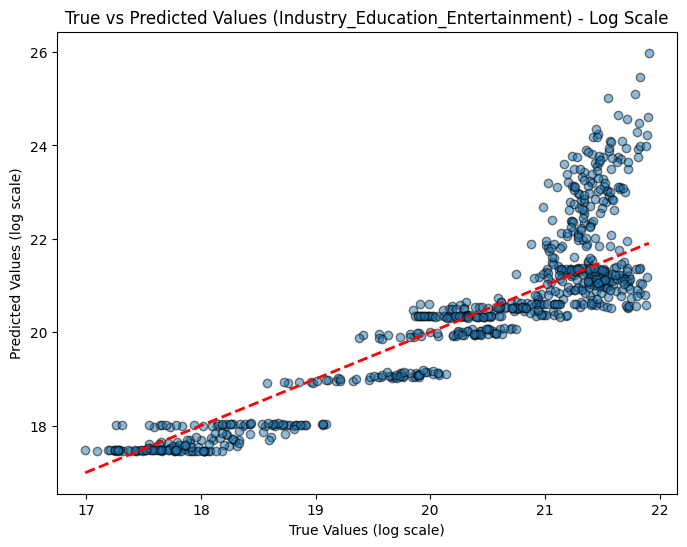

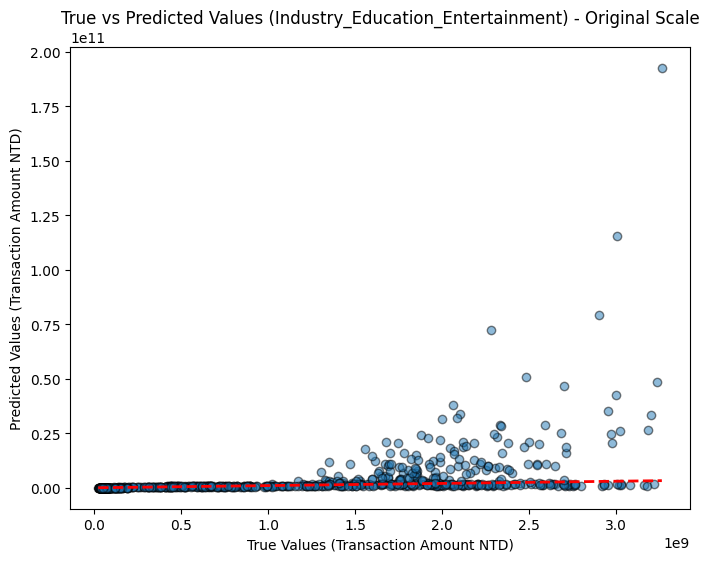


=== Modeling for Industry: Industry_Food ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - loss: 358.8778 - mae: 18.5812 - val_loss: 107.9376 - val_mae: 7.5004
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 18.1995 - mae: 3.3106 - val_loss: 3.8143 - val_mae: 1.6430
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 3.5018 - mae: 1.5282 - val_loss: 1.0473 - val_mae: 0.8497
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 1.1596 - mae: 0.8489 - val_loss: 0.6394 - val_mae: 0.6327
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.8910 - mae: 0.7577 - val_loss: 0.8344 - val_mae: 0.7261
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 0.7796 - mae: 0.6975 - val_loss: 0.6039 - val_mae: 0.6089
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 0.5711 - mae: 0.6041 - val_loss: 0.6635 - val_mae: 0.6221
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.4685 - mae: 0.5435 - val_loss: 0.6566 - val_mae: 0.5883
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.4416 - m

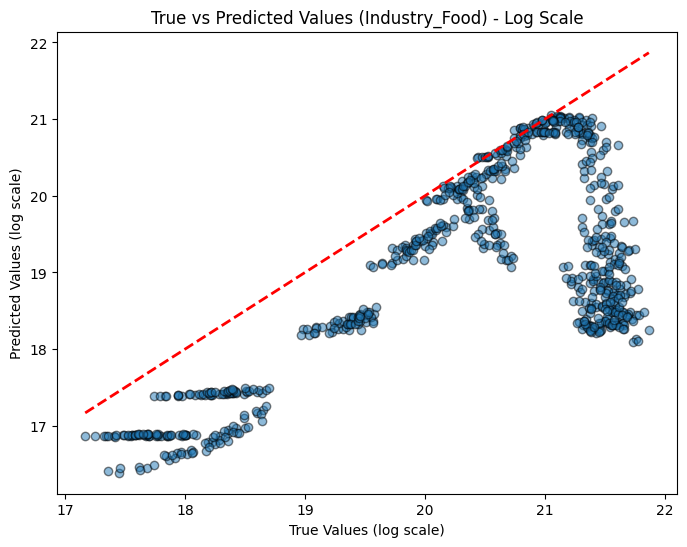

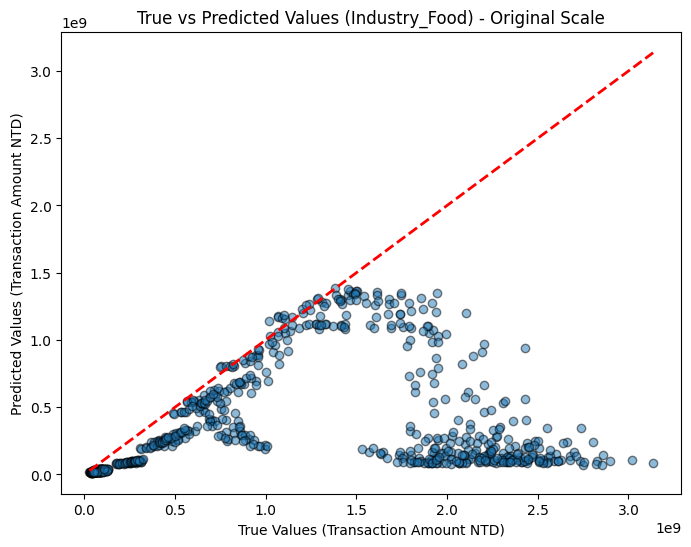


=== Modeling for Industry: Industry_Housing ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 332.5342 - mae: 17.8596 - val_loss: 63.0448 - val_mae: 7.2590
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 30.1357 - mae: 4.3378 - val_loss: 5.2792 - val_mae: 1.9100
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 3.7489 - mae: 1.6411 - val_loss: 2.8026 - val_mae: 1.4723
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 2.7283 - mae: 1.4441 - val_loss: 1.7144 - val_mae: 1.1289
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 2.0277 - mae: 1.2403 - val_loss: 1.1934 - val_mae: 0.9293
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 1.0392 - mae: 0.8405 - val_loss: 0.5379 - val_mae: 0.6122
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - loss: 0.3727 - mae: 0.4853 - val_loss: 0.3935 - val_mae: 0.5131
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.3801 - mae: 0.4872 - val_loss: 0.4615 - val_mae: 0.5428
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.3507 - ma

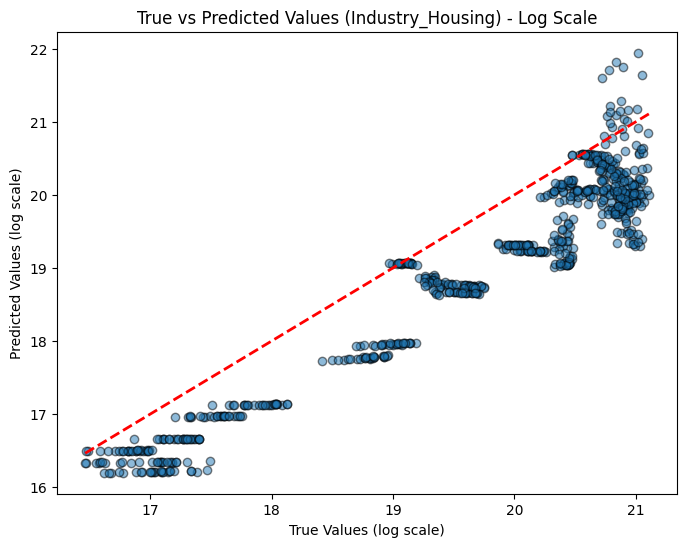

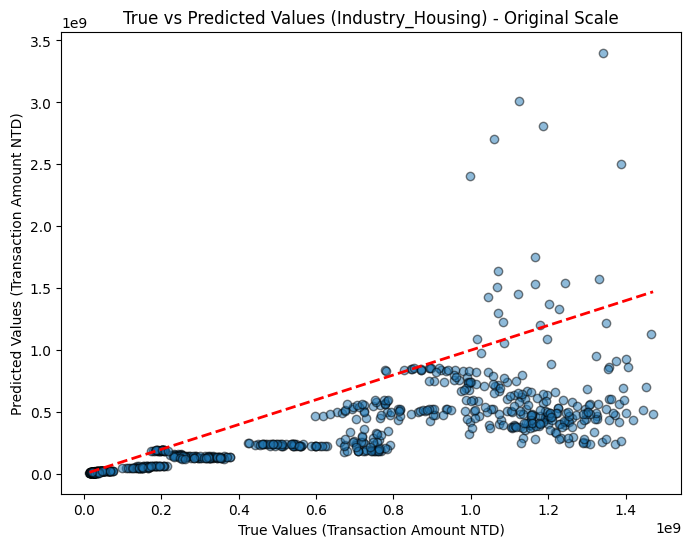


=== Modeling for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Modeling for Industry: Industry_Transportation ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 353.1849 - mae: 18.6174 - val_loss: 90.9254 - val_mae: 8.5963
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 36.4953 - mae: 4.7588 - val_loss: 4.3848 - val_mae: 1.6293
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 3.5463 - mae: 1.6176 - val_loss: 1.5663 - val_mae: 1.0553
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 1.6435 - mae: 1.0670 - val_loss: 1.0201 - val_mae: 0.8163
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.9056 - mae: 0.7577 - val_loss: 0.7842 - val_mae: 0.7102
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.7136 - mae: 0.6678 - val_loss: 0.5077 - val_mae: 0.5916
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.5429 - mae: 0.5857 - val_loss: 0.3337 - val_mae: 0.4822
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.4742 - mae: 0.5461 - val_loss: 0.2959 - val_mae: 0.4518
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3977 - ma

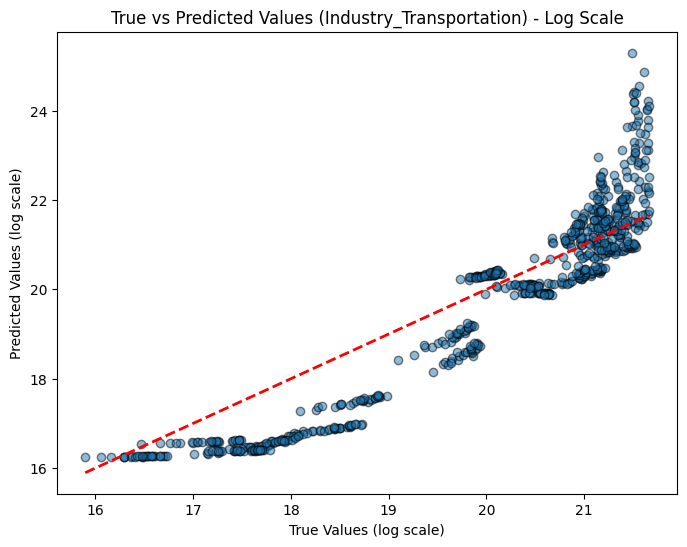

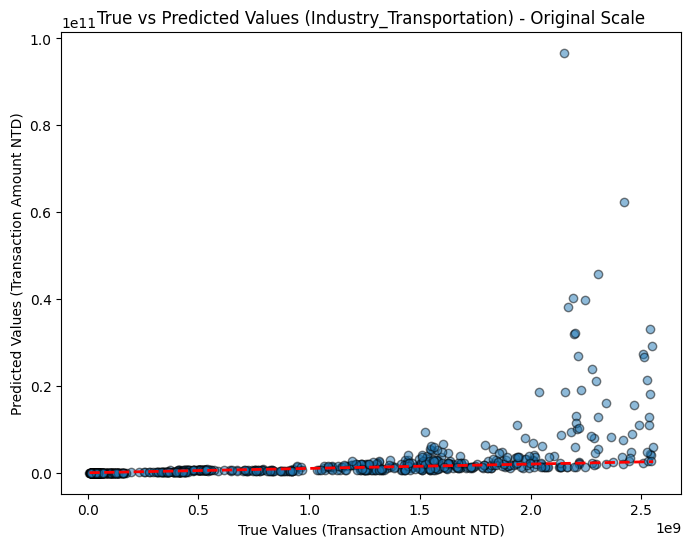

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# 定义函数：移除异常值
def remove_outliers_per_industry(df, amount_col, industry_columns, method='iqr', threshold=1.5, min_threshold=5000):
    """
    按产业类别移除目标变量的异常值，并移除低值。
    """
    cleaned_data = []
    for industry_col in industry_columns:
        industry_data = df[df[industry_col] == 1]

        if method == 'iqr':
            Q1 = industry_data[amount_col].quantile(0.25)
            Q3 = industry_data[amount_col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = max(Q1 - threshold * IQR, min_threshold)
            upper_bound = Q3 + threshold * IQR
        elif method == 'std':
            mean = industry_data[amount_col].mean()
            std = industry_data[amount_col].std()
            lower_bound = max(mean - threshold * std, min_threshold)
            upper_bound = mean + threshold * std
        else:
            raise ValueError("Unsupported method. Use 'iqr' or 'std'.")

        industry_data_cleaned = industry_data[
            (industry_data[amount_col] >= lower_bound) & (industry_data[amount_col] <= upper_bound)
        ]
        cleaned_data.append(industry_data_cleaned)

    return pd.concat(cleaned_data, ignore_index=True)

# 定义函数：LSTM 模型
def build_lstm_model(input_shape):
    """
    构建 LSTM 模型。
    Args:
        input_shape (tuple): 特征的形状。
    Returns:
        model: 编译好的 LSTM 模型。
    """
    model = Sequential([
        LSTM(64, activation='relu', input_shape=input_shape, return_sequences=True),
        Dropout(0.2),
        LSTM(32, activation='relu', return_sequences=False),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')  # 输出连续值
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

# 定义函数：单一产业建模与评估
def build_lstm_model_for_industry(df, industry_name, target_col='Transaction Amount (NTD)', epochs=50, batch_size=32):
    """
    为特定产业数据建模与评估。
    Args:
        df (pd.DataFrame): 数据框。
        industry_name (str): 产业名称。
        target_col (str): 目标列名称。
        epochs (int): 训练的迭代次数。
        batch_size (int): 每次训练的样本数量。
    """
    print(f"\n=== Modeling for Industry: {industry_name} ===")

    # 过滤该产业数据
    industry_data = df[df[industry_name] == 1].copy()

    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 分离特征与目标
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]

    # 标准化数据
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 对目标变量取对数变换
    y_log = np.log1p(y)

    # 数据切分
    train_size = int(0.8 * len(X_scaled))
    X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
    y_train, y_test = y_log[:train_size], y_log[train_size:]

    # 调整数据格式以适配 LSTM
    X_train_lstm = X_train[:, :, np.newaxis]
    X_test_lstm = X_test[:, :, np.newaxis]

    # 初始化并训练 LSTM 模型
    lstm_model = build_lstm_model(input_shape=X_train_lstm.shape[1:])
    lstm_model.fit(X_train_lstm, y_train, epochs=epochs, batch_size=batch_size, verbose=1, validation_split=0.2)

    # 预测
    y_pred_log = lstm_model.predict(X_test_lstm).flatten()

    # 计算对数尺度的 MSE 和 MAE
    mse_log = mean_squared_error(y_test, y_pred_log)
    mae_log = mean_absolute_error(y_test, y_pred_log)
    print(f"Mean Squared Error (MSE) in log scale: {mse_log}")
    print(f"Mean Absolute Error (MAE) in log scale: {mae_log}")

    # 将预测值反变换
    y_pred_original = np.expm1(y_pred_log)
    y_test_original = np.expm1(y_test)

    # 计算原始尺度的 MSE 和 MAE
    mse_original = mean_squared_error(y_test_original, y_pred_original)
    mae_original = mean_absolute_error(y_test_original, y_pred_original)
    print(f"Mean Squared Error (MSE) in original scale: {mse_original}")
    print(f"Mean Absolute Error (MAE) in original scale: {mae_original}")

    # 绘制结果（在对数尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred_log, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test.min(), y_test.max()],
        [y_test.min(), y_test.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (log scale)")
    plt.ylabel("Predicted Values (log scale)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Log Scale")
    plt.show()

    # 绘制结果（在原始尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_original, y_pred_original, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test_original.min(), y_test_original.max()],
        [y_test_original.min(), y_test_original.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Original Scale")
    plt.show()

# 移除异常值
industry_columns = [col for col in ageGroupCombined.columns if col.startswith("Industry_")]
ageGroupCombined_cleaned = remove_outliers_per_industry(
    df=ageGroupCombined,
    amount_col='Transaction Amount (NTD)',
    industry_columns=industry_columns,
    method='iqr',
    threshold=1.5,
    min_threshold=5000
)

# 为每个产业分开建模
for industry in industry_columns:
    build_lstm_model_for_industry(ageGroupCombined_cleaned, industry, target_col='Transaction Amount (NTD)', epochs=20, batch_size=64)



=== Modeling for Industry: Industry_Clothing ===


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 299.3166 - mae: 16.9991 - val_loss: 40.4668 - val_mae: 4.2024
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 17.9062 - mae: 3.0425 - val_loss: 1.7770 - val_mae: 1.0575
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4670 - mae: 1.0012 - val_loss: 1.2677 - val_mae: 0.9367
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2761 - mae: 0.9258 - val_loss: 1.0444 - val_mae: 0.8474
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.0825 - mae: 0.8460 - val_loss: 0.7892 - val_mae: 0.7016
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8650 - mae: 0.7350 - val_loss: 0.5542 - val_mae: 0.6010
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.5578 - mae: 0.6061 - val_loss: 0.2472 - val_mae: 0.3979
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3840 - mae: 0.5017 - val_loss: 0.2053 - val_mae: 0.3724
Epoch 9/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 

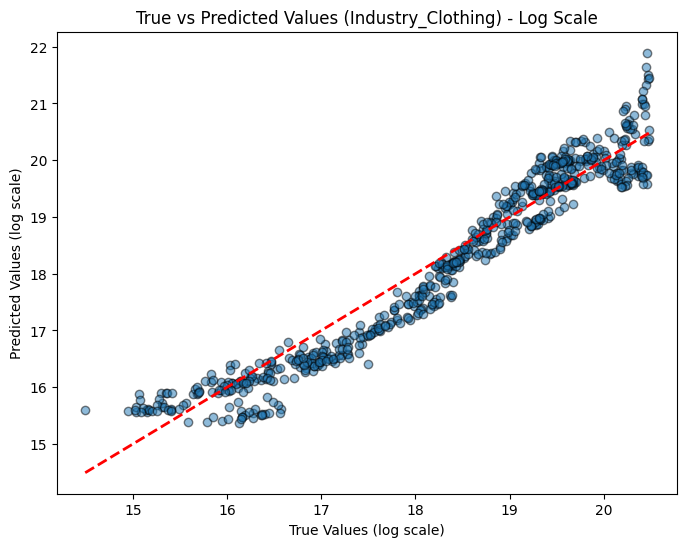

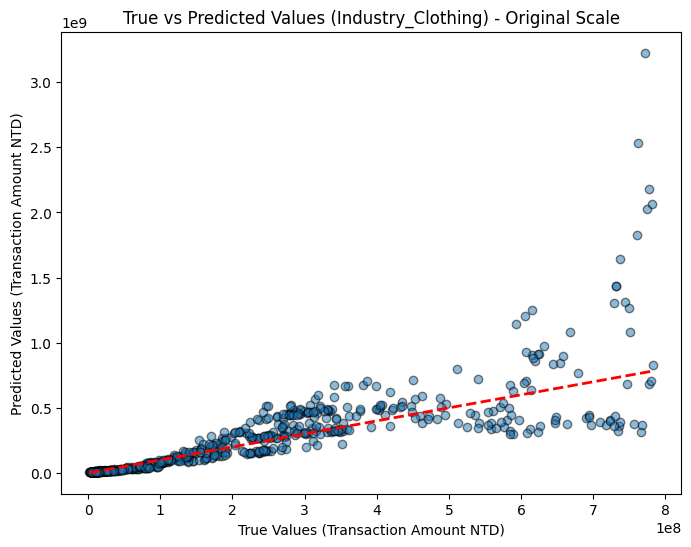


=== Modeling for Industry: Industry_Department_Store ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 366.3839 - mae: 18.9884 - val_loss: 140.6128 - val_mae: 8.0213
Epoch 2/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 10.6951 - mae: 2.4242 - val_loss: 2.3625 - val_mae: 1.1921
Epoch 3/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.6763 - mae: 1.0641 - val_loss: 2.7114 - val_mae: 1.3465
Epoch 4/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 1.3479 - mae: 0.9402 - val_loss: 1.9118 - val_mae: 1.1094
Epoch 5/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 1.0807 - mae: 0.8462 - val_loss: 1.4760 - val_mae: 0.9525
Epoch 6/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.8683 - mae: 0.7446 - val_loss: 1.4463 - val_mae: 0.9708
Epoch 7/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.6360 - mae: 0.6405 - val_loss: 1.3352 - val_mae: 0.9442
Epoch 8/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.5715 - mae: 0.6004 - val_loss: 1.8774 - val_mae: 1.1952
Epoch 9/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5852 - 

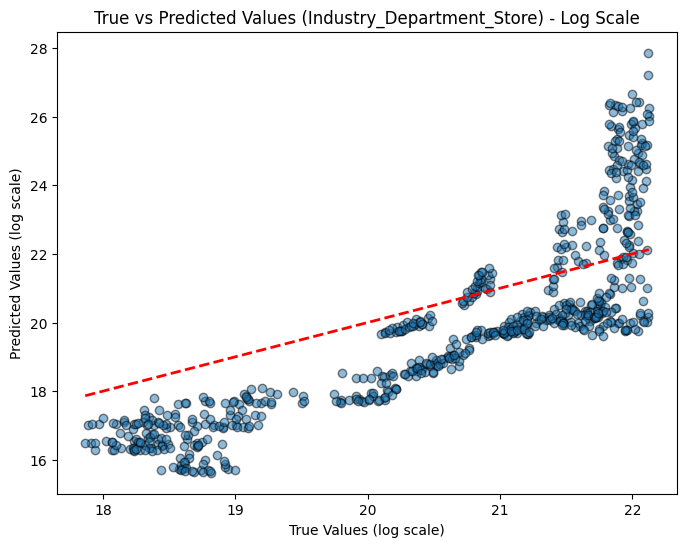

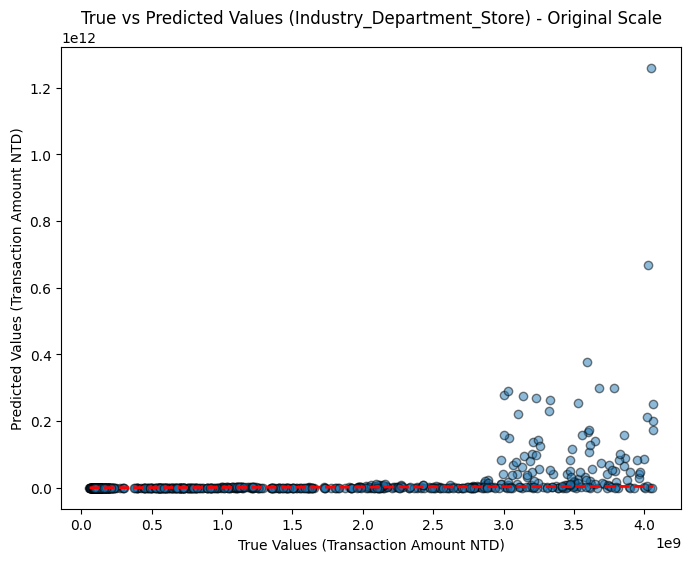


=== Modeling for Industry: Industry_Education_Entertainment ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 138ms/step - loss: 348.2572 - mae: 18.1060 - val_loss: 39.5131 - val_mae: 4.3063
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 6.7049 - mae: 2.0727 - val_loss: 1.9467 - val_mae: 1.1840
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.8878 - mae: 1.1750 - val_loss: 1.3359 - val_mae: 0.8688
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5430 - mae: 1.0425 - val_loss: 1.1394 - val_mae: 0.8451
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.0304 - mae: 0.8246 - val_loss: 0.4736 - val_mae: 0.5342
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.7091 - mae: 0.6669 - val_loss: 0.3386 - val_mae: 0.4526
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.5474 - mae: 0.5895 - val_loss: 0.2960 - val_mae: 0.4288
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.4500 - mae: 0.5279 - val_loss: 0.2676 - val_mae: 0.4160
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.4703 - ma

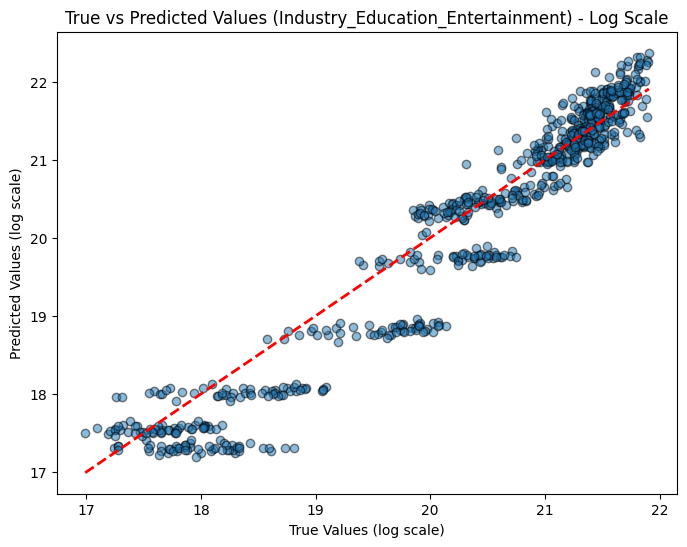

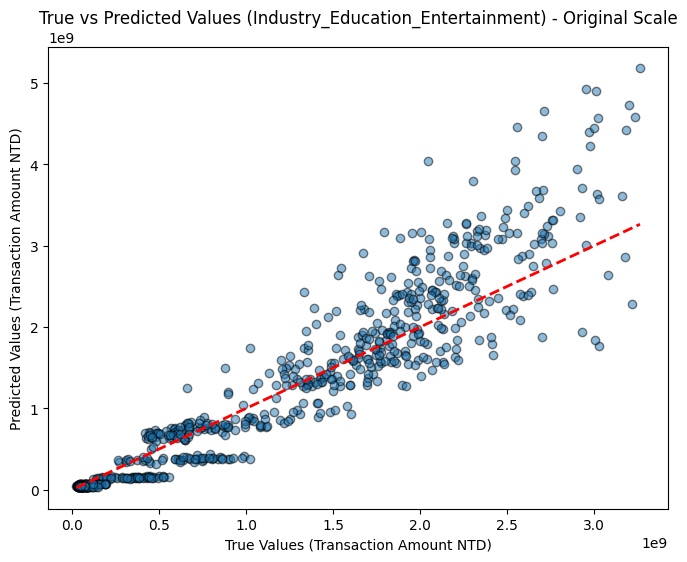


=== Modeling for Industry: Industry_Food ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - loss: 343.3277 - mae: 17.9794 - val_loss: 35.7645 - val_mae: 5.3978
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 14.5332 - mae: 2.9561 - val_loss: 6.6917 - val_mae: 1.9820
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.9132 - mae: 1.5804 - val_loss: 2.4302 - val_mae: 1.2456
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.2852 - mae: 1.2521 - val_loss: 1.0141 - val_mae: 0.8216
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 1.8714 - mae: 1.1271 - val_loss: 1.0933 - val_mae: 0.8112
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 1.3887 - mae: 0.9467 - val_loss: 0.5828 - val_mae: 0.6428
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.8732 - mae: 0.7544 - val_loss: 0.3882 - val_mae: 0.4977
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.6748 - mae: 0.6528 - val_loss: 0.3682 - val_mae: 0.5012
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.5880 - m

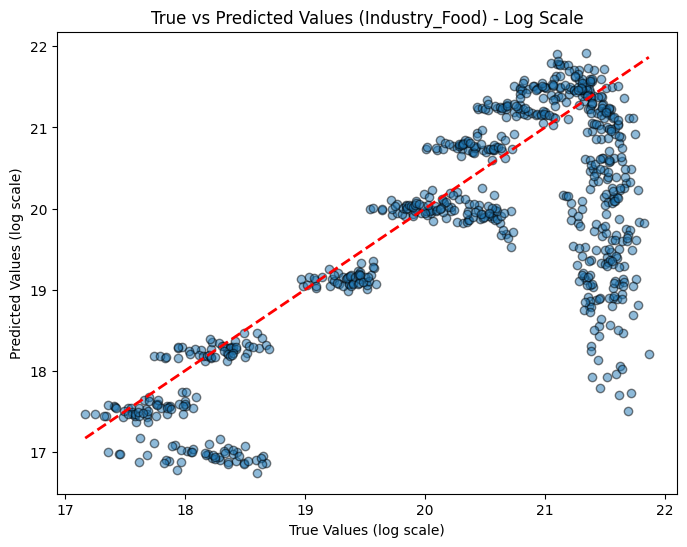

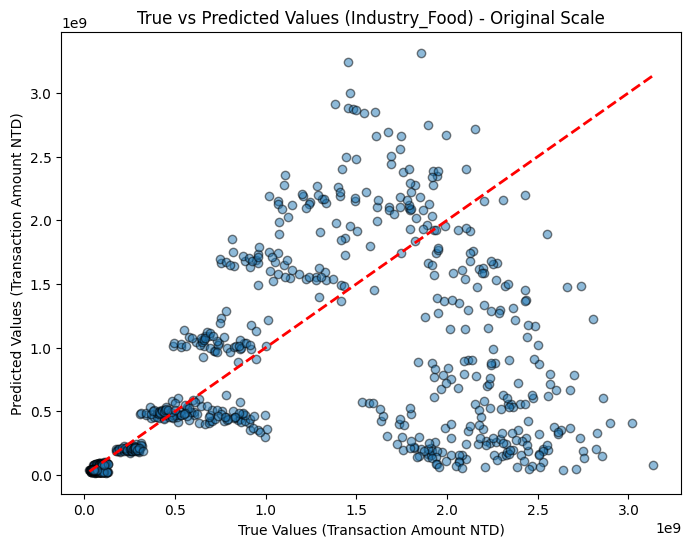


=== Modeling for Industry: Industry_Housing ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 320.6879 - mae: 17.4836 - val_loss: 27.2323 - val_mae: 4.2819
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 6.2535 - mae: 2.0249 - val_loss: 1.5518 - val_mae: 1.0512
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.7638 - mae: 1.1281 - val_loss: 0.8125 - val_mae: 0.7543
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.2220 - mae: 0.8873 - val_loss: 0.7156 - val_mae: 0.7444
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8589 - mae: 0.7334 - val_loss: 1.1069 - val_mae: 0.8601
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.6423 - mae: 0.6339 - val_loss: 1.2369 - val_mae: 0.8939
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6696 - mae: 0.6422 - val_loss: 0.9921 - val_mae: 0.8300
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6236 - mae: 0.6203 - val_loss: 0.6474 - val_mae: 0.6536
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6242 - ma

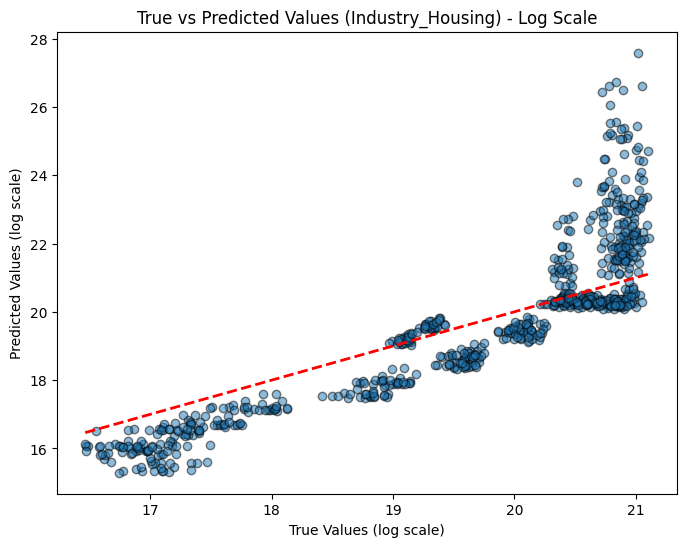

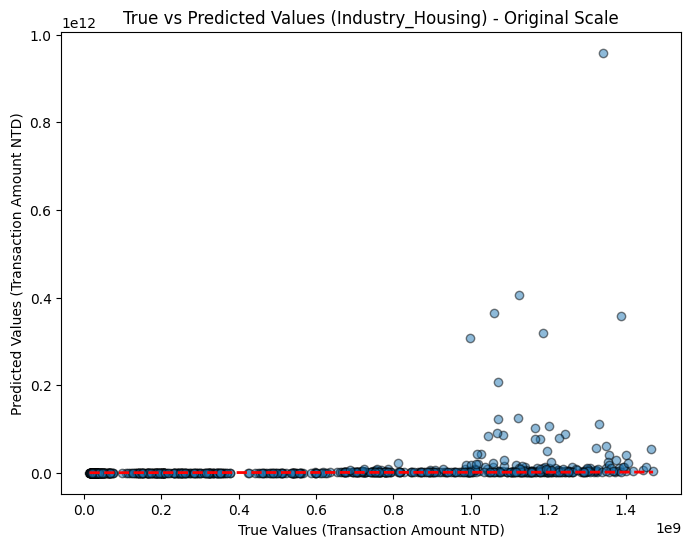


=== Modeling for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Modeling for Industry: Industry_Transportation ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 357.2517 - mae: 18.4987 - val_loss: 251.6803 - val_mae: 15.8103
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 175.5076 - mae: 12.2821 - val_loss: 15.6299 - val_mae: 3.0116
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 4.8654 - mae: 1.8086 - val_loss: 2.4391 - val_mae: 1.3012
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 2.4841 - mae: 1.3733 - val_loss: 2.0212 - val_mae: 1.2065
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 2.3074 - mae: 1.3253 - val_loss: 1.7897 - val_mae: 1.1155
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 1.9194 - mae: 1.1715 - val_loss: 1.2539 - val_mae: 0.8785
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 1.0758 - mae: 0.7884 - val_loss: 0.5256 - val_mae: 0.5677
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.6519 - mae: 0.6009 - val_loss: 0.5313 - val_mae: 0.5759
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.594

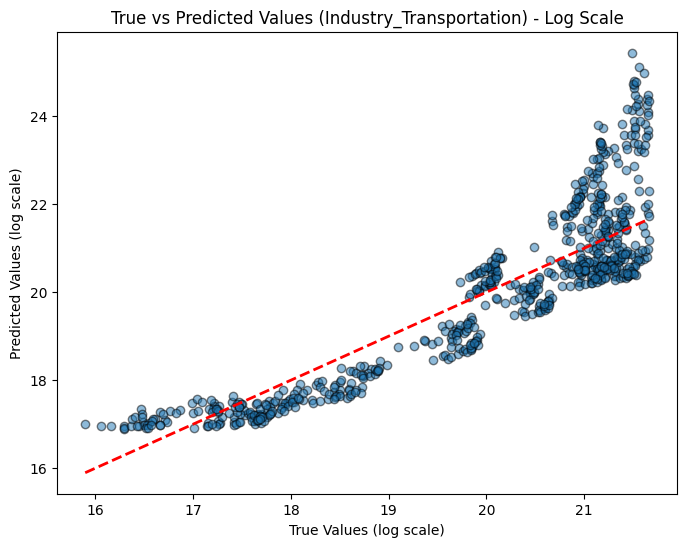

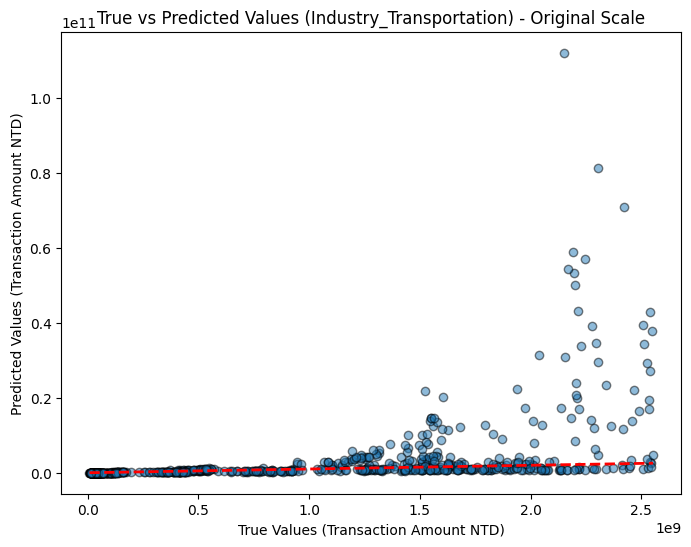

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# 定义函数：移除异常值
def remove_outliers_per_industry(df, amount_col, industry_columns, method='iqr', threshold=1.5, min_threshold=5000):
    cleaned_data = []
    for industry_col in industry_columns:
        industry_data = df[df[industry_col] == 1]

        if method == 'iqr':
            Q1 = industry_data[amount_col].quantile(0.25)
            Q3 = industry_data[amount_col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = max(Q1 - threshold * IQR, min_threshold)
            upper_bound = Q3 + threshold * IQR
        elif method == 'std':
            mean = industry_data[amount_col].mean()
            std = industry_data[amount_col].std()
            lower_bound = max(mean - threshold * std, min_threshold)
            upper_bound = mean + threshold * std
        else:
            raise ValueError("Unsupported method. Use 'iqr' or 'std'.")

        industry_data_cleaned = industry_data[
            (industry_data[amount_col] >= lower_bound) & (industry_data[amount_col] <= upper_bound)
        ]
        cleaned_data.append(industry_data_cleaned)

    return pd.concat(cleaned_data, ignore_index=True)

# 定义函数：添加时间特征
def add_time_features(df, date_column='Date'):
    """
    提取时间特征（如月份和季节）并加入数据框。
    """
    df['Month'] = pd.to_datetime(df[date_column]).dt.month
    df['Season'] = df['Month'].apply(lambda x: (x % 12 + 3) // 3)  # 将月份转换为4个季节
    return df

# 定义函数：构建 LSTM 模型
def build_lstm_model(input_shape):
    """
    构建 LSTM 模型。
    """
    model = Sequential([
        LSTM(64, activation='relu', input_shape=input_shape, return_sequences=True),
        Dropout(0.2),
        LSTM(32, activation='relu', return_sequences=False),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')  # 输出连续值
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

# 定义函数：单一产业建模与评估
def build_lstm_model_for_industry_with_time_features(df, industry_name, target_col='Transaction Amount (NTD)', epochs=50, batch_size=32):
    print(f"\n=== Modeling for Industry: {industry_name} ===")

    # 过滤该产业数据
    industry_data = df[df[industry_name] == 1].copy()

    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 添加时间特征
    industry_data = add_time_features(industry_data)

    # One-Hot 编码季节特征
    industry_data = pd.concat([industry_data, pd.get_dummies(industry_data['Season'], prefix='Season')], axis=1)
    industry_data.drop(columns=['Season'], inplace=True)

    # 分离特征与目标
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]

    # 标准化数据
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 对目标变量取对数变换
    y_log = np.log1p(y)

    # 数据切分
    train_size = int(0.8 * len(X_scaled))
    X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
    y_train, y_test = y_log[:train_size], y_log[train_size:]

    # 调整数据格式以适配 LSTM
    X_train_lstm = X_train[:, :, np.newaxis]
    X_test_lstm = X_test[:, :, np.newaxis]

    # 初始化并训练 LSTM 模型
    lstm_model = build_lstm_model(input_shape=X_train_lstm.shape[1:])
    lstm_model.fit(X_train_lstm, y_train, epochs=epochs, batch_size=batch_size, verbose=1, validation_split=0.2)

    # 预测
    y_pred_log = lstm_model.predict(X_test_lstm).flatten()

    # 计算对数尺度的 MSE 和 MAE
    mse_log = mean_squared_error(y_test, y_pred_log)
    mae_log = mean_absolute_error(y_test, y_pred_log)
    print(f"Mean Squared Error (MSE) in log scale: {mse_log}")
    print(f"Mean Absolute Error (MAE) in log scale: {mae_log}")

    # 将预测值反变换
    y_pred_original = np.expm1(y_pred_log)
    y_test_original = np.expm1(y_test)

    # 计算原始尺度的 MSE 和 MAE
    mse_original = mean_squared_error(y_test_original, y_pred_original)
    mae_original = mean_absolute_error(y_test_original, y_pred_original)
    print(f"Mean Squared Error (MSE) in original scale: {mse_original}")
    print(f"Mean Absolute Error (MAE) in original scale: {mae_original}")

    # 绘制结果（在对数尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred_log, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test.min(), y_test.max()],
        [y_test.min(), y_test.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (log scale)")
    plt.ylabel("Predicted Values (log scale)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Log Scale")
    plt.show()

    # 绘制结果（在原始尺度上）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_original, y_pred_original, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test_original.min(), y_test_original.max()],
        [y_test_original.min(), y_test_original.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title(f"True vs Predicted Values ({industry_name}) - Original Scale")
    plt.show()

# 移除异常值
industry_columns = [col for col in ageGroupCombined.columns if col.startswith("Industry_")]
ageGroupCombined_cleaned = remove_outliers_per_industry(
    df=ageGroupCombined,
    amount_col='Transaction Amount (NTD)',
    industry_columns=industry_columns,
    method='iqr',
    threshold=1.5,
    min_threshold=5000
)

# 为每个产业分开建模（加入时间特征）
for industry in industry_columns:
    build_lstm_model_for_industry_with_time_features(ageGroupCombined_cleaned, industry, target_col='Transaction Amount (NTD)', epochs=20, batch_size=64)


#以上是12/08

## KNN LSTM


=== Modeling for Industry: Industry_Clothing ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 128ms/step - loss: 316.1834 - mae: 17.5887 - val_loss: 16.6891 - val_mae: 3.7653
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 6.1087 - mae: 1.9751 - val_loss: 2.2146 - val_mae: 1.3037
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.2273 - mae: 1.2487 - val_loss: 1.2920 - val_mae: 0.9144
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.3173 - mae: 0.9326 - val_loss: 0.9690 - val_mae: 0.7803
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.9929 - mae: 0.7968 - val_loss: 0.7337 - val_mae: 0.7059
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9243 - mae: 0.7739 - val_loss: 0.7120 - val_mae: 0.6815
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6560 - mae: 0.6453 - val_loss: 0.2921 - val_mae: 0.4149
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.5063 - mae: 0.5671 - val_loss: 0.2524 - val_mae: 0.3847
Epoch 9/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4213 - mae: 0

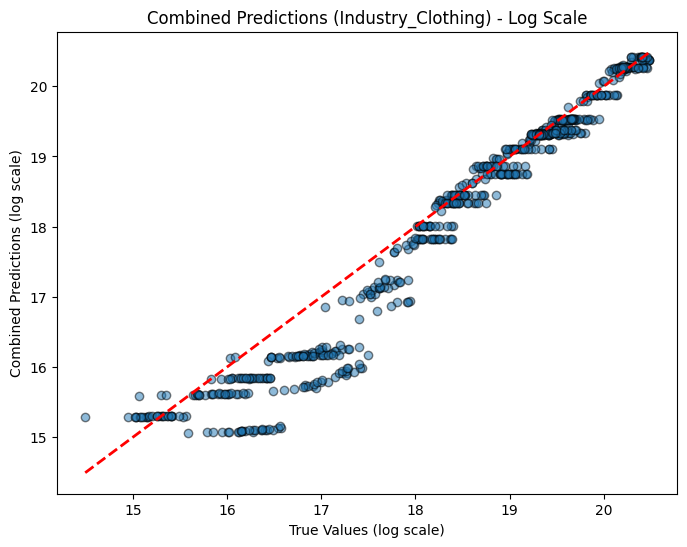

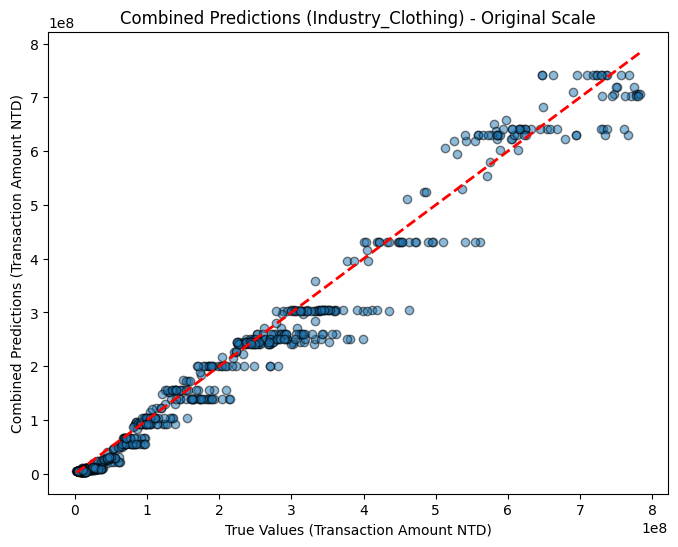


=== Modeling for Industry: Industry_Department_Store ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 364.3394 - mae: 18.8846 - val_loss: 99.7364 - val_mae: 9.4121
Epoch 2/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 38.9616 - mae: 5.1375 - val_loss: 21.5640 - val_mae: 3.1981
Epoch 3/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 5.2221 - mae: 1.7714 - val_loss: 6.5182 - val_mae: 1.9901
Epoch 4/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2.5363 - mae: 1.2999 - val_loss: 1.8040 - val_mae: 1.1480
Epoch 5/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2031 - mae: 0.8870 - val_loss: 1.2351 - val_mae: 0.9500
Epoch 6/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.8111 - mae: 0.7133 - val_loss: 0.8135 - val_mae: 0.7382
Epoch 7/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.6377 - mae: 0.6397 - val_loss: 1.4432 - val_mae: 1.0598
Epoch 8/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.5777 - mae: 0.6037 - val_loss: 1.1047 - val_mae: 0.9027
Epoch 9/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5314 - m

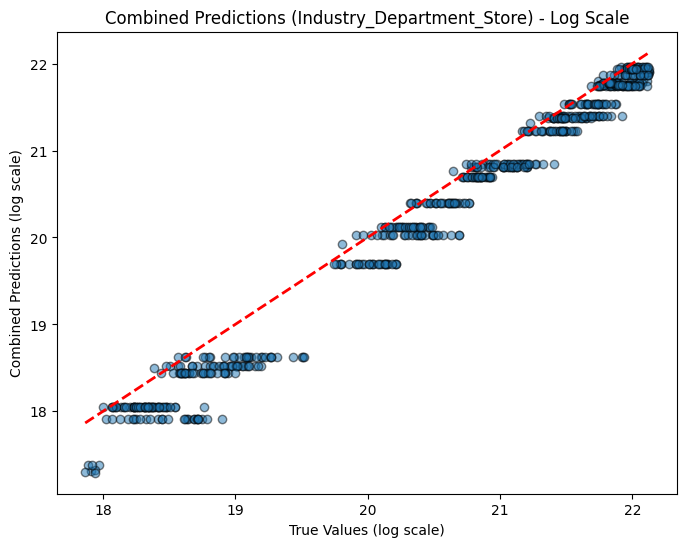

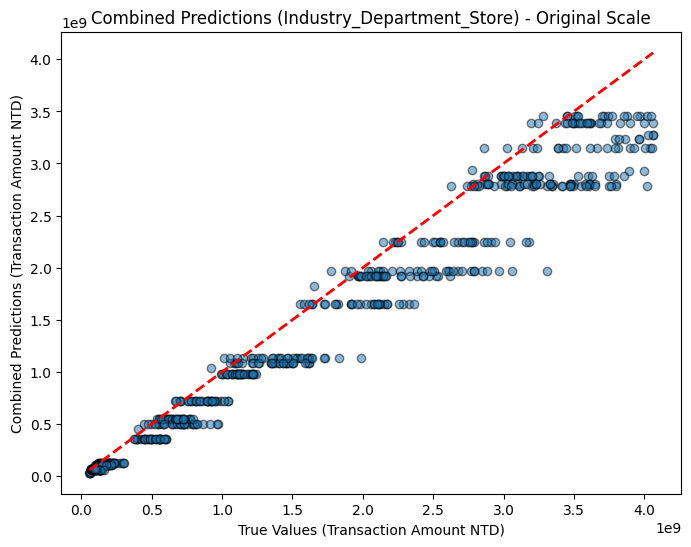


=== Modeling for Industry: Industry_Education_Entertainment ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 134ms/step - loss: 373.3258 - mae: 19.0512 - val_loss: 150.8054 - val_mae: 12.1880
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 90.0035 - mae: 8.2212 - val_loss: 12.7510 - val_mae: 2.9502
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 5.3061 - mae: 1.9163 - val_loss: 3.7794 - val_mae: 1.6777
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.4780 - mae: 1.3382 - val_loss: 1.1403 - val_mae: 0.9022
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0641 - mae: 0.8294 - val_loss: 0.6071 - val_mae: 0.6299
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8219 - mae: 0.7214 - val_loss: 0.6981 - val_mae: 0.7018
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7011 - mae: 0.6697 - val_loss: 0.3493 - val_mae: 0.4510
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.6447 - mae: 0.6479 - val_loss: 0.3148 - val_mae: 0.4388
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.5607 - mae:

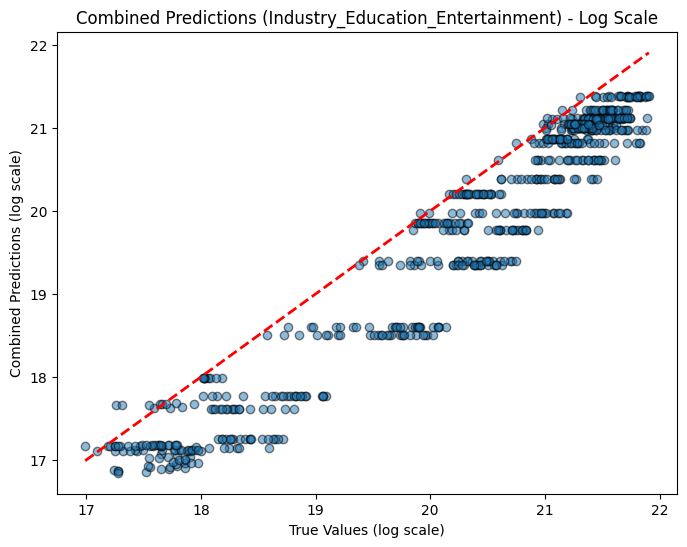

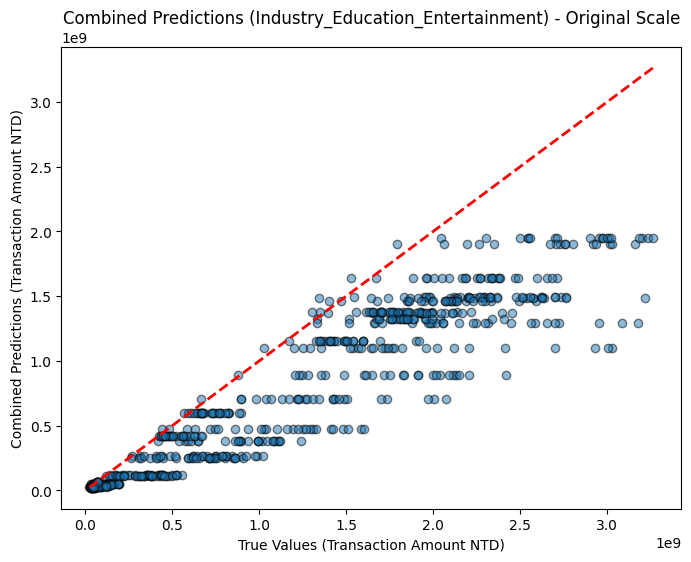


=== Modeling for Industry: Industry_Food ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 372.3928 - mae: 19.0735 - val_loss: 57.8265 - val_mae: 6.9606
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 28.9528 - mae: 4.2677 - val_loss: 4.7770 - val_mae: 1.8417
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 3.8755 - mae: 1.6900 - val_loss: 1.5201 - val_mae: 1.0232
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.5536 - mae: 1.0056 - val_loss: 0.9612 - val_mae: 0.7716
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.9049 - mae: 0.7437 - val_loss: 0.6873 - val_mae: 0.6607
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.7411 - mae: 0.6559 - val_loss: 0.7010 - val_mae: 0.6528
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.6082 - mae: 0.5939 - val_loss: 1.0331 - val_mae: 0.7659
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.5221 - mae: 0.5583 - val_loss: 0.2575 - val_mae: 0.4279
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4098 - ma

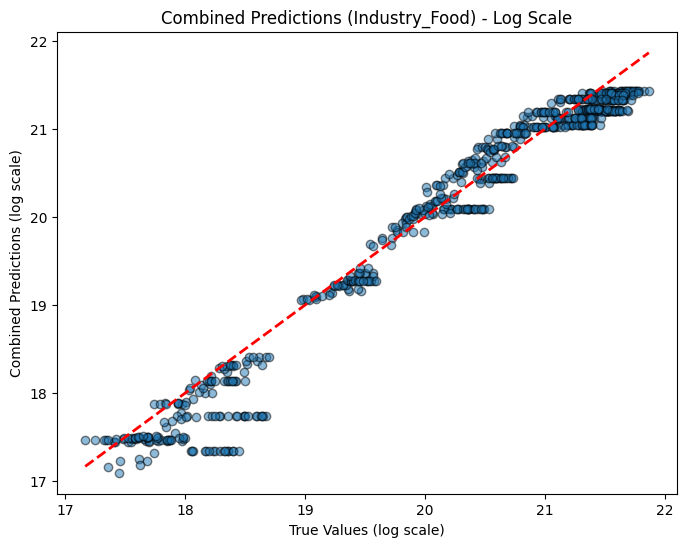

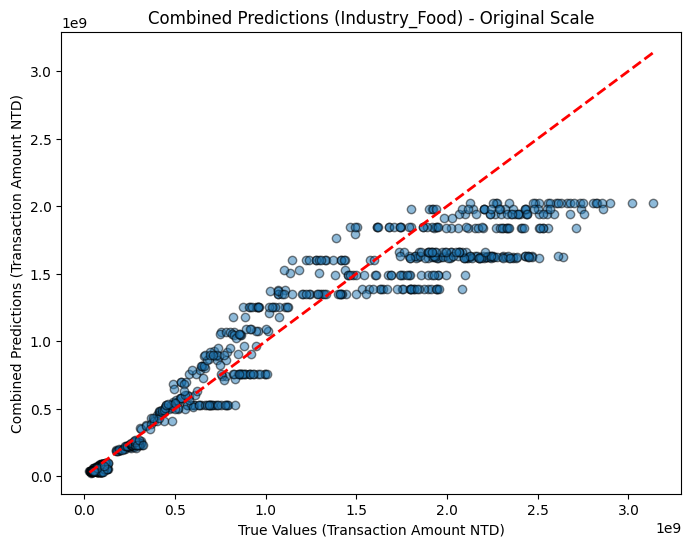


=== Modeling for Industry: Industry_Housing ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 335.4895 - mae: 18.0349 - val_loss: 62.7728 - val_mae: 7.0047
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 24.6706 - mae: 3.8547 - val_loss: 1.1071 - val_mae: 0.8539
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.4492 - mae: 0.9508 - val_loss: 0.8756 - val_mae: 0.7788
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7838 - mae: 0.7128 - val_loss: 1.1104 - val_mae: 0.8398
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.5734 - mae: 0.6030 - val_loss: 0.9580 - val_mae: 0.7343
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.4313 - mae: 0.5223 - val_loss: 0.7164 - val_mae: 0.6033
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3515 - mae: 0.4685 - val_loss: 0.6839 - val_mae: 0.6127
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3505 - mae: 0.4698 - val_loss: 0.6325 - val_mae: 0.5833
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3160 - mae: 0.4

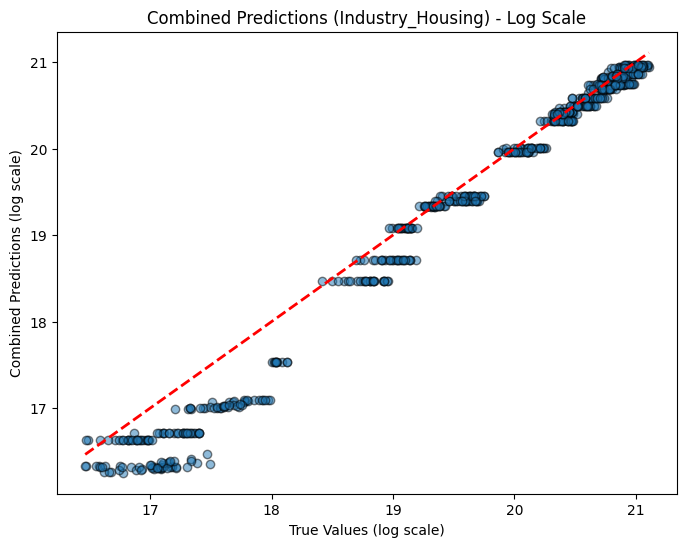

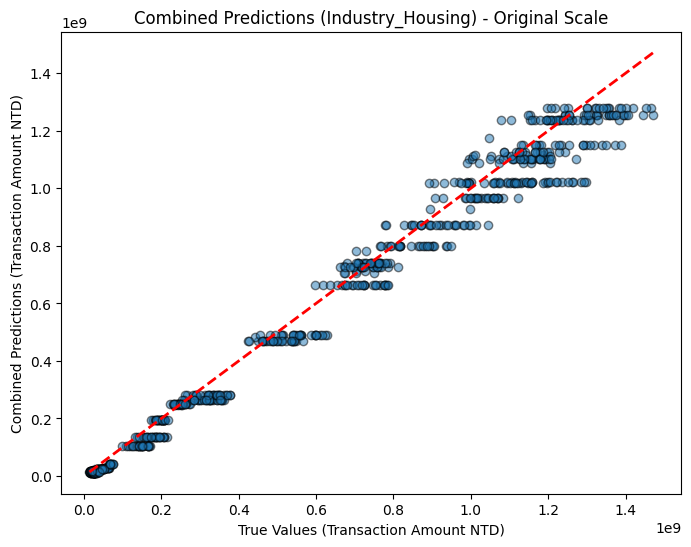


=== Modeling for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Modeling for Industry: Industry_Transportation ===
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


36/36 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 321.9841 - mae: 17.4417 - val_loss: 55.9393 - val_mae: 5.3812
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 18.7819 - mae: 3.3265 - val_loss: 3.2783 - val_mae: 1.5122
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.1041 - mae: 1.4537 - val_loss: 2.0657 - val_mae: 1.1601
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.3816 - mae: 1.2983 - val_loss: 1.5515 - val_mae: 1.0218
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.9947 - mae: 1.1595 - val_loss: 1.8231 - val_mae: 1.1116
Epoch 6/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.5888 - mae: 1.0275 - val_loss: 1.0024 - val_mae: 0.7838
Epoch 7/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 1.2113 - mae: 0.8843 - val_loss: 1.0540 - val_mae: 0.8391
Epoch 8/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.9876 - mae: 0.8016 - val_loss: 0.9702 - val_mae: 0.8132
Epoch 9/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8705 - mae: 0

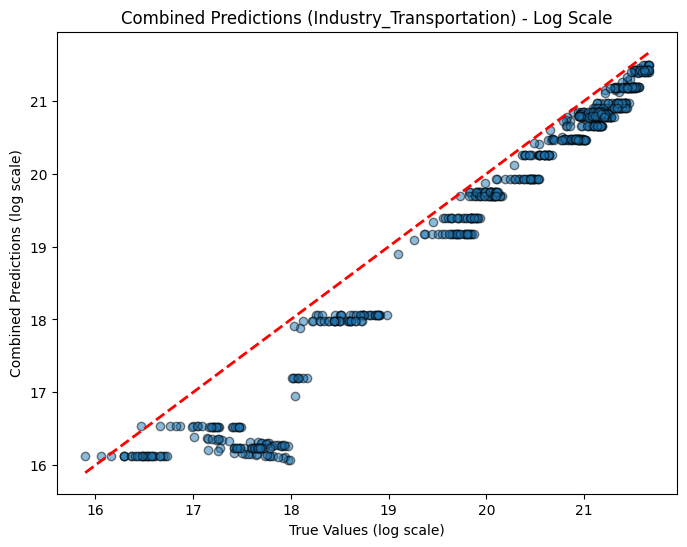

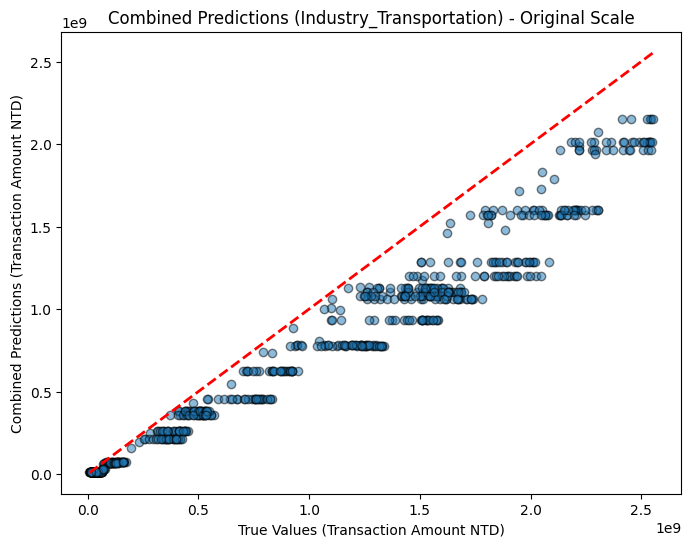

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# 定義函數：移除異常值
def remove_outliers_per_industry(df, amount_col, industry_columns, method='iqr', threshold=1.5, min_threshold=5000):
    cleaned_data = []
    for industry_col in industry_columns:
        industry_data = df[df[industry_col] == 1]
        if method == 'iqr':
            Q1 = industry_data[amount_col].quantile(0.25)
            Q3 = industry_data[amount_col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = max(Q1 - threshold * IQR, min_threshold)
            upper_bound = Q3 + threshold * IQR
        industry_data_cleaned = industry_data[
            (industry_data[amount_col] >= lower_bound) & (industry_data[amount_col] <= upper_bound)
        ]
        cleaned_data.append(industry_data_cleaned)
    return pd.concat(cleaned_data, ignore_index=True)

# 定義函數：LSTM 模型
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(64, activation='relu', input_shape=input_shape, return_sequences=True),
        Dropout(0.2),
        LSTM(32, activation='relu', return_sequences=False),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

# 結合 LSTM 和 KNN 預測結果
def combine_lstm_knn_predictions(y_true, y_pred_lstm, y_pred_knn, threshold=18):
    """
    根據 log 尺度的閾值分界，結合 LSTM 和 KNN 預測。
    """
    combined_predictions = np.where(y_true <= threshold, y_pred_lstm, y_pred_knn)
    return combined_predictions

# 定義函數：單一產業建模與評估
def build_combined_model_for_industry(df, industry_name, target_col='Transaction Amount (NTD)', n_neighbors=2, epochs=20, batch_size=64, threshold=18):
    print(f"\n=== Modeling for Industry: {industry_name} ===")
    industry_data = df[df[industry_name] == 1].copy()
    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 分離特徵與目標
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    y_log = np.log1p(y)  # log 轉換

    train_size = int(0.8 * len(X_scaled))
    X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
    y_train, y_test = y_log[:train_size], y_log[train_size:]

    # LSTM 資料格式轉換
    X_train_lstm = X_train[:, :, np.newaxis]
    X_test_lstm = X_test[:, :, np.newaxis]

    # 訓練 LSTM 模型
    lstm_model = build_lstm_model(input_shape=X_train_lstm.shape[1:])
    lstm_model.fit(X_train_lstm, y_train, epochs=epochs, batch_size=batch_size, verbose=1, validation_split=0.2)
    y_pred_log_lstm = lstm_model.predict(X_test_lstm).flatten()

    # 訓練 KNN 模型
    knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
    knn_model.fit(X_train, y_train)
    y_pred_log_knn = knn_model.predict(X_test)

    # 結合預測結果（log 尺度）
    combined_log_predictions = combine_lstm_knn_predictions(
        y_true=y_test,
        y_pred_lstm=y_pred_log_lstm,
        y_pred_knn=y_pred_log_knn,
        threshold=threshold
    )

    # 計算 log 尺度的 MSE 和 MAE
    mse_log = mean_squared_error(y_test, combined_log_predictions)
    mae_log = mean_absolute_error(y_test, combined_log_predictions)
    print(f"Combined Model - MSE (log scale): {mse_log:.4f}")
    print(f"Combined Model - MAE (log scale): {mae_log:.4f}")

    # 還原至原始尺度
    y_test_original = np.expm1(y_test)
    y_pred_original_lstm = np.expm1(y_pred_log_lstm)
    y_pred_original_knn = np.expm1(y_pred_log_knn)
    combined_original_predictions = np.expm1(combined_log_predictions)

    # 計算原始尺度的 MSE 和 MAE
    mse_original = mean_squared_error(y_test_original, combined_original_predictions)
    mae_original = mean_absolute_error(y_test_original, combined_original_predictions)
    print(f"Combined Model - MSE (original scale): {mse_original:.2f}")
    print(f"Combined Model - MAE (original scale): {mae_original:.2f}")

    # 視覺化結果（log 尺度）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, combined_log_predictions, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test.min(), y_test.max()],
        [y_test.min(), y_test.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (log scale)")
    plt.ylabel("Combined Predictions (log scale)")
    plt.title(f"Combined Predictions ({industry_name}) - Log Scale")
    plt.show()

    # 視覺化結果（原始尺度）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_original, combined_original_predictions, alpha=0.5, edgecolor='k')
    plt.plot(
        [y_test_original.min(), y_test_original.max()],
        [y_test_original.min(), y_test_original.max()],
        '--r', linewidth=2
    )
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Combined Predictions (Transaction Amount NTD)")
    plt.title(f"Combined Predictions ({industry_name}) - Original Scale")
    plt.show()

# 主程式
industry_columns = [col for col in ageGroupCombined.columns if col.startswith("Industry_")]
ageGroupCombined_cleaned = remove_outliers_per_industry(
    df=ageGroupCombined,
    amount_col='Transaction Amount (NTD)',
    industry_columns=industry_columns,
    method='iqr',
    threshold=1.5,
    min_threshold=5000
)

# 建模與評估
for industry in industry_columns:
    build_combined_model_for_industry(
        ageGroupCombined_cleaned,
        industry,
        target_col='Transaction Amount (NTD)',
        n_neighbors=10,
        epochs=20,
        batch_size=64,
        threshold=18  # log 尺度閾值
    )


In [ ]:
# 結合 LSTM 和 KNN 預測結果，基於交易金額頻率
def combine_predictions_based_on_frequency(df, industry_name, target_col='Transaction Amount (NTD)',
                                           n_neighbors=2, epochs=20, batch_size=64, freq_threshold=5):
    print(f"\n=== Modeling for Industry: {industry_name} ===")
    industry_data = df[df[industry_name] == 1].copy()
    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 分離特徵與目標
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    y_log = np.log1p(y)  # log 轉換

    # 統計交易金額的頻率
    transaction_counter = Counter(y)
    frequent_amounts = [k for k, v in transaction_counter.items() if v > freq_threshold]
    infrequent_mask = ~y.isin(frequent_amounts)

    # 分成多數類和少數類
    X_lstm = X_scaled[~infrequent_mask]
    y_lstm = y_log[~infrequent_mask]
    X_knn = X_scaled[infrequent_mask]
    y_knn = y_log[infrequent_mask]

    # 訓練 LSTM 模型
    if len(y_lstm) > 0:
        print(f"Training LSTM on {len(y_lstm)} frequent data points.")
        X_train_lstm = X_lstm[:, :, np.newaxis]
        lstm_model = build_lstm_model(input_shape=X_train_lstm.shape[1:])
        lstm_model.fit(X_train_lstm, y_lstm, epochs=epochs, batch_size=batch_size, verbose=1, validation_split=0.2)
        y_pred_log_lstm = lstm_model.predict(X_train_lstm).flatten()
    else:
        y_pred_log_lstm = []

    # 訓練 KNN 模型
    if len(y_knn) > 0:
        print(f"Training KNN on {len(y_knn)} infrequent data points.")
        knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
        knn_model.fit(X_knn, y_knn)
        y_pred_log_knn = knn_model.predict(X_knn)
    else:
        y_pred_log_knn = []

    # 結合預測結果
    combined_predictions = np.zeros_like(y_log)
    combined_predictions[~infrequent_mask] = y_pred_log_lstm
    combined_predictions[infrequent_mask] = y_pred_log_knn

    # 評估 log scale 結果
    mae_log = mean_absolute_error(y_log, combined_predictions)
    print(f"Combined Model - MAE (log scale): {mae_log:.4f}")

    # 還原至原始尺度
    y_original = np.expm1(y_log)
    combined_original = np.expm1(combined_predictions)

    # 評估原始尺度結果
    mae_original = mean_absolute_error(y_original, combined_original)
    print(f"Combined Model - MAE (original scale): {mae_original:.2f}")

    # 視覺化結果（log 尺度）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_log, combined_predictions, alpha=0.5, edgecolor='k')
    plt.plot([y_log.min(), y_log.max()], [y_log.min(), y_log.max()], '--r', linewidth=2)
    plt.xlabel("True Values (log scale)")
    plt.ylabel("Predicted Values (log scale)")
    plt.title(f"Combined Model Predictions ({industry_name}) - Log Scale")
    plt.show()

    # 視覺化結果（原始尺度）
    plt.figure(figsize=(8, 6))
    plt.scatter(y_original, combined_original, alpha=0.5, edgecolor='k')
    plt.plot([y_original.min(), y_original.max()], [y_original.min(), y_original.max()], '--r', linewidth=2)
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title(f"Combined Model Predictions ({industry_name}) - Original Scale")
    plt.show()



=== Modeling for Industry: Industry_Clothing ===
Combined Model - MAE (log scale): 0.0786


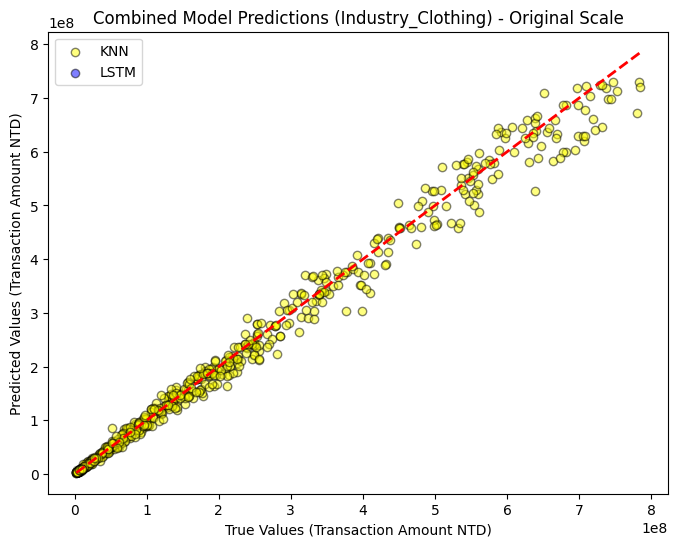


=== Modeling for Industry: Industry_Department_Store ===
Combined Model - MAE (log scale): 0.0944


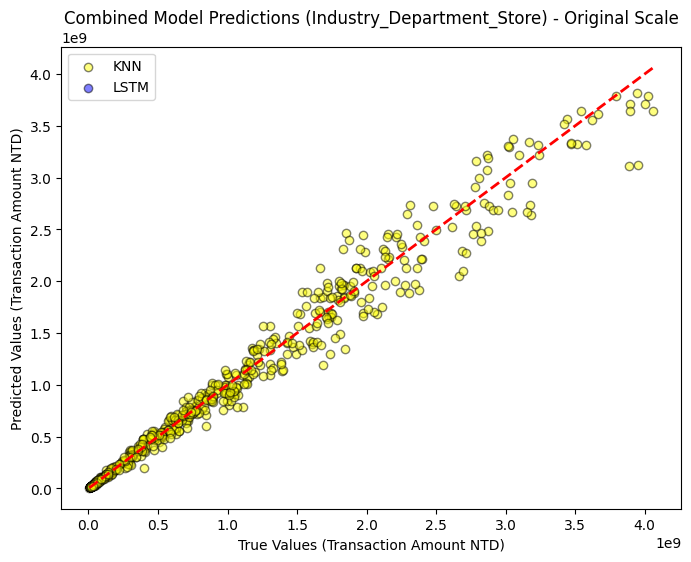


=== Modeling for Industry: Industry_Education_Entertainment ===
Combined Model - MAE (log scale): 0.1801


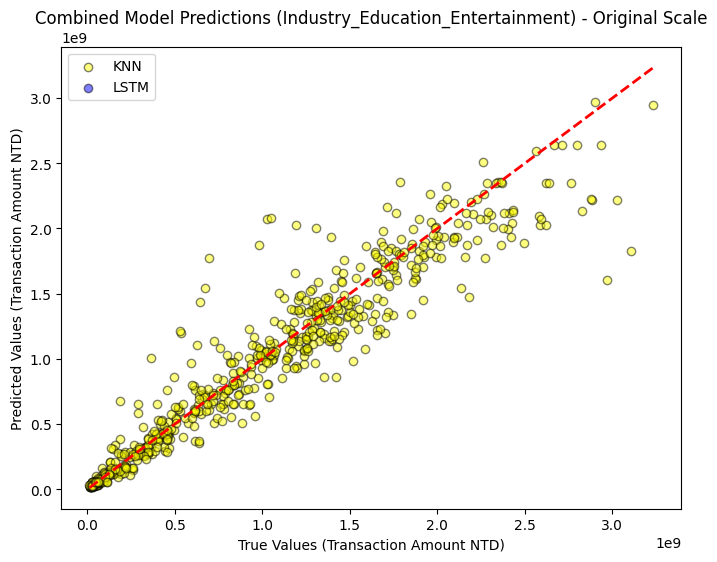


=== Modeling for Industry: Industry_Food ===
Combined Model - MAE (log scale): 0.0999


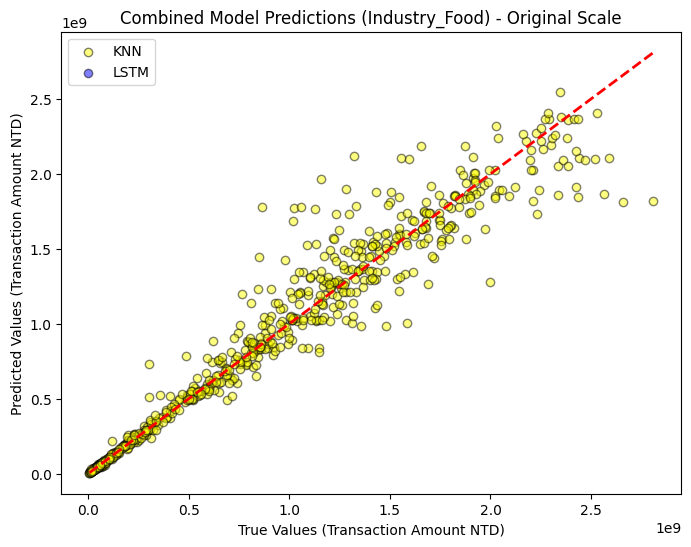


=== Modeling for Industry: Industry_Housing ===
Combined Model - MAE (log scale): 0.0762


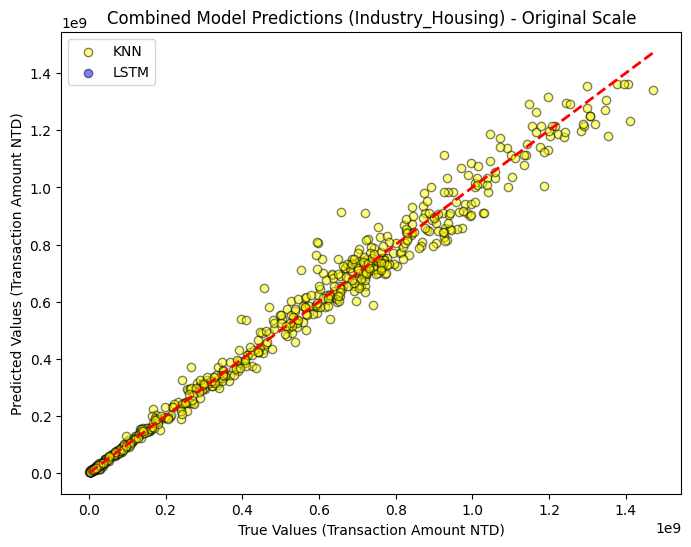


=== Modeling for Industry: Industry_Others ===
No data available for Industry_Others. Skipping.

=== Modeling for Industry: Industry_Transportation ===
Combined Model - MAE (log scale): 0.0859


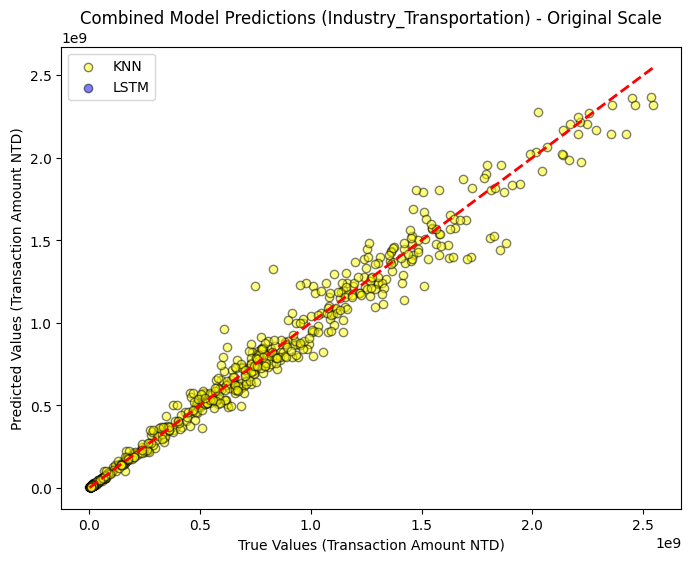

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from collections import Counter

# 定義函數：移除異常值
def remove_outliers_per_industry(df, amount_col, industry_columns, method='iqr', threshold=1.5, min_threshold=5000):
    cleaned_data = []
    for industry_col in industry_columns:
        industry_data = df[df[industry_col] == 1]
        if method == 'iqr':
            Q1 = industry_data[amount_col].quantile(0.25)
            Q3 = industry_data[amount_col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = max(Q1 - threshold * IQR, min_threshold)
            upper_bound = Q3 + threshold * IQR
        industry_data_cleaned = industry_data[
            (industry_data[amount_col] >= lower_bound) & (industry_data[amount_col] <= upper_bound)
        ]
        cleaned_data.append(industry_data_cleaned)
    return pd.concat(cleaned_data, ignore_index=True)

# 定義函數：LSTM 模型
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(64, activation='relu', input_shape=input_shape, return_sequences=True),
        Dropout(0.2),
        LSTM(32, activation='relu', return_sequences=False),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

# 結合 LSTM 和 KNN 預測結果，並視覺化使用 KNN 或 LSTM
def combine_predictions_based_on_frequency_fixed(df, industry_name, target_col='Transaction Amount (NTD)',
                                                 n_neighbors=2, epochs=20, batch_size=64, freq_threshold=5):
    print(f"\n=== Modeling for Industry: {industry_name} ===")
    industry_data = df[df[industry_name] == 1].copy()
    if industry_data.empty:
        print(f"No data available for {industry_name}. Skipping.")
        return None

    # 分離特徵與目標
    X = industry_data.drop(columns=[target_col, 'Date'])
    y = industry_data[target_col]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    y_log = np.log1p(y)  # log 轉換

    # 標準分割訓練與測試集
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_log, test_size=0.2, random_state=42)

    # 計算訓練集的頻率
    transaction_counter = Counter(y_train)
    frequent_amounts = [k for k, v in transaction_counter.items() if v > freq_threshold]
    infrequent_mask = ~y_train.isin(frequent_amounts)

    # 分成 LSTM 和 KNN 訓練資料
    X_train_lstm = X_train[~infrequent_mask]
    y_train_lstm = y_train[~infrequent_mask]
    X_train_knn = X_train[infrequent_mask]
    y_train_knn = y_train[infrequent_mask]

    # 訓練 LSTM 模型
    if len(y_train_lstm) > 0:
        X_train_lstm = X_train_lstm[:, :, np.newaxis]
        lstm_model = build_lstm_model(input_shape=X_train_lstm.shape[1:])
        lstm_model.fit(X_train_lstm, y_train_lstm, epochs=epochs, batch_size=batch_size, verbose=1)
        X_test_lstm = X_test[:, :, np.newaxis]
        y_pred_log_lstm = lstm_model.predict(X_test_lstm).flatten()
    else:
        y_pred_log_lstm = np.zeros(len(X_test))

    # 訓練 KNN 模型
    knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
    knn_model.fit(X_train_knn, y_train_knn)
    y_pred_log_knn = knn_model.predict(X_test)

    # 結合預測結果並記錄使用 KNN 或 LSTM 的點
    use_knn = ~y_test.isin(frequent_amounts)
    combined_predictions = np.where(use_knn, y_pred_log_knn, y_pred_log_lstm)

    # 評估結果（log 尺度）
    mae_log = mean_absolute_error(y_test, combined_predictions)
    print(f"Combined Model - MAE (log scale): {mae_log:.4f}")

    # 還原至原始尺度
    y_test_original = np.expm1(y_test)
    combined_original = np.expm1(combined_predictions)

    # 視覺化結果，區分 KNN 和 LSTM 預測點
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test_original[use_knn], combined_original[use_knn], alpha=0.5, edgecolor='k', color='yellow', label='KNN')
    plt.scatter(y_test_original[~use_knn], combined_original[~use_knn], alpha=0.5, edgecolor='k', color='blue', label='LSTM')
    plt.plot([y_test_original.min(), y_test_original.max()],
             [y_test_original.min(), y_test_original.max()], '--r', linewidth=2)
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title(f"Combined Model Predictions ({industry_name}) - Original Scale")
    plt.legend()
    plt.show()

# 主程式
# 假設 ageGroupCombined 是你的 DataFrame
industry_columns = [col for col in ageGroupCombined.columns if col.startswith("Industry_")]
ageGroupCombined_cleaned = remove_outliers_per_industry(
    df=ageGroupCombined,
    amount_col='Transaction Amount (NTD)',
    industry_columns=industry_columns,
    method='iqr',
    threshold=1.5,
    min_threshold=5000
)

# 建模與評估
for industry in industry_columns:
    combine_predictions_based_on_frequency_fixed(
        ageGroupCombined_cleaned,
        industry,
        target_col='Transaction Amount (NTD)',
        n_neighbors=10,
        epochs=20,
        batch_size=64,
        freq_threshold=5  # 資料頻率閾值
    )


In [ ]:
from sklearn.tree import DecisionTreeClassifier

# 訓練階段：分類器預測區域 (高頻/低頻)
def train_frequency_classifier(y_train, freq_threshold=5):
    y_train_freq = np.array([1 if y_train.tolist().count(val) > freq_threshold else 0 for val in y_train])
    return DecisionTreeClassifier().fit(y_train.reshape(-1, 1), y_train_freq)

# 測試階段：根據分類器結果選擇模型
def predict_with_combined_model(X_test, y_test, lstm_model, knn_model, classifier):
    X_test_lstm = []
    X_test_knn = []
    indices_lstm = []
    indices_knn = []

    # 預測區域 (高頻/低頻)
    for i, x in enumerate(X_test):
        if classifier.predict([[y_test[i]]]) == 1:  # 預測為高頻
            X_test_lstm.append(x)
            indices_lstm.append(i)
        else:  # 預測為低頻
            X_test_knn.append(x)
            indices_knn.append(i)

    # LSTM 預測
    X_test_lstm = np.array(X_test_lstm)[:, :, np.newaxis]
    y_pred_lstm = lstm_model.predict(X_test_lstm).flatten()

    # KNN 預測
    y_pred_knn = knn_model.predict(X_test_knn)

    # 組合預測結果
    y_pred_combined = np.zeros(len(X_test))
    for i, pred in zip(indices_lstm, y_pred_lstm):
        y_pred_combined[i] = pred
    for i, pred in zip(indices_knn, y_pred_knn):
        y_pred_combined[i] = pred

    return y_pred_combined


Epoch 1/3


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 295.9866 - mae: 16.6171
Epoch 2/3
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 7.7549 - mae: 2.2178
Epoch 3/3
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 1.8994 - mae: 1.1289
Combined Model - MAE (log scale): 0.0902
Combined Model - MAE (original scale): 16167933.64


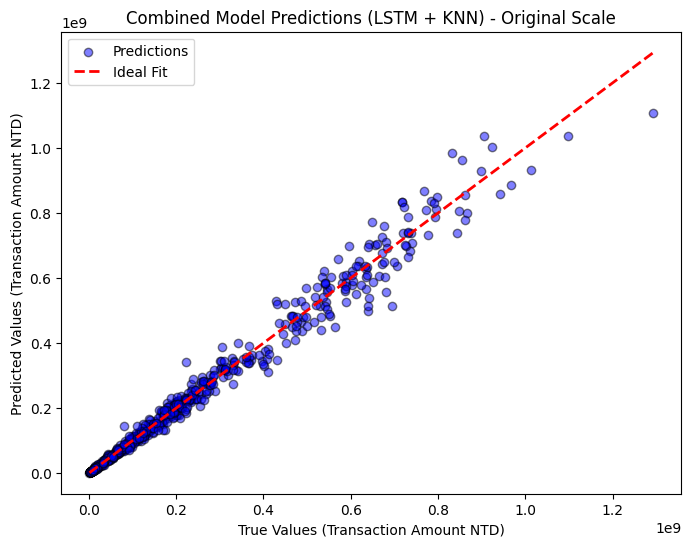

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from collections import Counter

# 視覺化結果：區分 LSTM 和 KNN 預測點
def visualize_predictions(y_test_original, y_pred_original_combined):
    plt.figure(figsize=(8, 6))
    plt.scatter(
        y_test_original, y_pred_original_combined,
        alpha=0.5, edgecolor='k', label="Predictions", color="blue"
    )

    # 理想的對角線
    plt.plot(
        [y_test_original.min(), y_test_original.max()],
        [y_test_original.min(), y_test_original.max()],
        '--r', linewidth=2, label="Ideal Fit"
    )

    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title("Combined Model Predictions (LSTM + KNN) - Original Scale")
    plt.legend()
    plt.show()



# 定義函數：LSTM 模型
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(64, activation='relu', input_shape=input_shape, return_sequences=True),
        Dropout(0.2),
        LSTM(32, activation='relu', return_sequences=False),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

# 訓練階段：分類器預測區域 (高頻/低頻)
def train_frequency_classifier(y_train, freq_threshold=5):
    # 使用 Counter 計算頻率
    freq_counts = Counter(y_train)
    y_train_freq = np.array([1 if freq_counts[val] > freq_threshold else 0 for val in y_train])
    # 將 y_train 轉換為 NumPy 陣列並重塑
    return DecisionTreeClassifier().fit(y_train.values.reshape(-1, 1), y_train_freq)

# 測試階段：根據分類器結果選擇模型
def predict_with_combined_model(X_test, y_test, lstm_model, knn_model, classifier):
    X_test_lstm = []
    X_test_knn = []
    indices_lstm = []
    indices_knn = []

    # 根據分類器選擇模型
    for i, x in enumerate(X_test):
        freq_class = classifier.predict([[y_test.iloc[i]]])[0]  # 使用 iloc 確保索引正確
        if freq_class == 1:  # 預測為高頻
            X_test_lstm.append(x)
            indices_lstm.append(i)
        else:  # 預測為低頻
            X_test_knn.append(x)
            indices_knn.append(i)

    # LSTM 預測
    # Check if X_test_lstm is not empty and reshape if necessary
    if len(X_test_lstm) > 0:
        X_test_lstm = np.array(X_test_lstm)
        if X_test_lstm.ndim == 1:  # If 1-dimensional, reshape
            X_test_lstm = X_test_lstm[:, np.newaxis, np.newaxis]
        else:
            X_test_lstm = X_test_lstm[:, :, np.newaxis]
        y_pred_lstm = lstm_model.predict(X_test_lstm).flatten()
    else:
        y_pred_lstm = []

    # KNN 預測
    X_test_knn = np.array(X_test_knn)
    y_pred_knn = knn_model.predict(X_test_knn) if len(X_test_knn) > 0 else []

    # 組合預測結果
    y_pred_combined = np.zeros(len(X_test))
    for i, pred in zip(indices_lstm, y_pred_lstm):
        y_pred_combined[i] = pred
    for i, pred in zip(indices_knn, y_pred_knn):
        y_pred_combined[i] = pred

    return y_pred_combined

# 主程式: 訓練 LSTM 和 KNN 模型
def main_for_industry_clothing(df, target_col, freq_threshold=5, n_neighbors=5, epochs=20, batch_size=64):
    # 過濾僅保留 Industry_Clothing
    df_clothing = df[df["Industry_Clothing"] == 1].copy()
    if df_clothing.empty:
        print("No data available for Industry_Clothing.")
        return

    # 分離特徵與目標
    X = df_clothing.drop(columns=[target_col, 'Date'])
    y = df_clothing[target_col]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    y_log = np.log1p(y)  # log 轉換

    # 分割訓練與測試集
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_log, test_size=0.2, random_state=42)

    # 重設索引
    X_train = pd.DataFrame(X_train).reset_index(drop=True)
    X_test = pd.DataFrame(X_test).reset_index(drop=True)
    y_train = pd.Series(y_train).reset_index(drop=True)
    y_test = pd.Series(y_test).reset_index(drop=True)

    # 訓練分類器 (高頻/低頻)
    classifier = train_frequency_classifier(y_train, freq_threshold=freq_threshold)

    # 訓練 LSTM 模型 (高頻數據)
    lstm_model = build_lstm_model(input_shape=(X_train.shape[1], 1))
    X_train_lstm = X_train.values[:, :, np.newaxis]
    lstm_model.fit(X_train_lstm, y_train, epochs=epochs, batch_size=batch_size, verbose=1)

    # 訓練 KNN 模型 (低頻數據)
    knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
    knn_model.fit(X_train, y_train)

    # 預測並組合結果
    y_pred_log_combined = predict_with_combined_model(X_test.values, y_test, lstm_model, knn_model, classifier)

    # 評估 MAE
    mae_log = mean_absolute_error(y_test, y_pred_log_combined)
    print(f"Combined Model - MAE (log scale): {mae_log:.4f}")

    # 還原到原始尺度
    y_test_original = np.expm1(y_test)
    y_pred_original_combined = np.expm1(y_pred_log_combined)
    mae_original = mean_absolute_error(y_test_original, y_pred_original_combined)
    print(f"Combined Model - MAE (original scale): {mae_original:.2f}")

    # 可視化結果
    visualize_predictions(y_test_original, y_pred_original_combined)
# 假設 ageGroupCombined 是資料集
# target_col 是 'Transaction Amount (NTD)'
main_for_industry_clothing(
    ageGroupCombined,
    target_col='Transaction Amount (NTD)',
    freq_threshold=5,
    n_neighbors=2,
    epochs=3,
    batch_size=64
)


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


44/44 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 296.9518 - mae: 16.7193
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 4.9419 - mae: 1.8511
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 1.3279 - mae: 0.9484
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 1.0629 - mae: 0.8447
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.8184 - mae: 0.7218
Epoch 6/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.5682 - mae: 0.5996
Epoch 7/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3850 - mae: 0.4999
Epoch 8/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3469 - mae: 0.4711
Epoch 9/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.3299 - mae: 0.4550
Epoch 10/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.3077 - mae: 0.4399
Epoch 11/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.2908 - mae: 0.4327
Epoch 12/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.3070 - mae: 0.4424
Epoch 13/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 28m

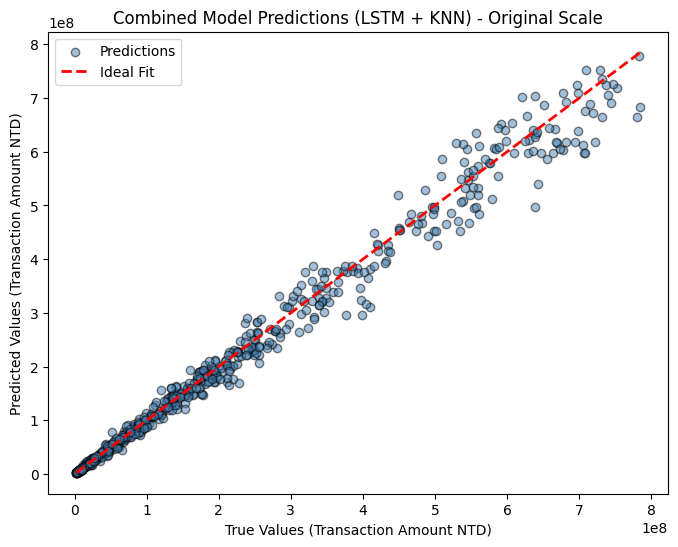

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from collections import Counter

# 新增函數：根據 IQR 移除異常值
def remove_outliers_iqr(df, column, threshold=1.5):
    """
    使用 IQR 方法移除異常值
    """
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)].reset_index(drop=True)


# 定義函數：LSTM 模型
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(64, activation='relu', input_shape=input_shape, return_sequences=True),
        Dropout(0.2),
        LSTM(32, activation='relu', return_sequences=False),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])
    return model

# 訓練階段：分類器預測區域 (高頻/低頻)
def train_frequency_classifier(y_train, freq_threshold=5):
    freq_counts = Counter(y_train)
    y_train_freq = np.array([1 if freq_counts[val] > freq_threshold else 0 for val in y_train])
    return DecisionTreeClassifier().fit(y_train.values.reshape(-1, 1), y_train_freq)

# 測試階段：根據分類器結果選擇模型
def predict_with_combined_model(X_test, y_test, lstm_model, knn_model, classifier):
    X_test_lstm, X_test_knn = [], []
    indices_lstm, indices_knn = [], []

    for i, x in enumerate(X_test):
        freq_class = classifier.predict([[y_test.iloc[i]]])[0]
        if freq_class == 1:  # 高頻 -> LSTM
            X_test_lstm.append(x)
            indices_lstm.append(i)
        else:  # 低頻 -> KNN
            X_test_knn.append(x)
            indices_knn.append(i)

    # LSTM 預測
    if len(X_test_lstm) > 0:
        X_test_lstm = np.array(X_test_lstm)[:, :, np.newaxis]
        y_pred_lstm = lstm_model.predict(X_test_lstm).flatten()
    else:
        y_pred_lstm = []

    # KNN 預測
    y_pred_knn = knn_model.predict(X_test_knn) if len(X_test_knn) > 0 else []

    # 組合預測結果
    y_pred_combined = np.zeros(len(X_test))
    for i, pred in zip(indices_lstm, y_pred_lstm):
        y_pred_combined[i] = pred
    for i, pred in zip(indices_knn, y_pred_knn):
        y_pred_combined[i] = pred

    return y_pred_combined

# 視覺化結果
def visualize_predictions(y_test_original, y_pred_original_combined):
    plt.figure(figsize=(8, 6))
    plt.scatter(
        y_test_original, y_pred_original_combined,
        alpha=0.5, edgecolor='k', label="Predictions", color="#4682B4"  # 使用統一藍色
    )
    plt.plot(
        [y_test_original.min(), y_test_original.max()],
        [y_test_original.min(), y_test_original.max()],
        '--r', linewidth=2, label="Ideal Fit"
    )
    plt.xlabel("True Values (Transaction Amount NTD)")
    plt.ylabel("Predicted Values (Transaction Amount NTD)")
    plt.title("Combined Model Predictions (LSTM + KNN) - Original Scale")
    plt.legend()
    plt.show()

# 主程式: 分析 Industry_Clothing
def analyze_industry_clothing(df, target_col, freq_threshold=5, n_neighbors=5, epochs=20, batch_size=64):
    # 過濾僅保留 Industry_Clothing
    df_clothing = df[df["Industry_Clothing"] == 1].copy()
    if df_clothing.empty:
        print("No data available for Industry_Clothing.")
        return

    # 使用 IQR 移除 outlier
    df_clothing = remove_outliers_iqr(df_clothing, target_col)

    # 特徵與目標分離
    X = df_clothing.drop(columns=[target_col, 'Date'])
    y = df_clothing[target_col]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    y_log = np.log1p(y)

    # 分割訓練與測試集
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_log, test_size=0.2, random_state=42)
    y_train, y_test = pd.Series(y_train).reset_index(drop=True), pd.Series(y_test).reset_index(drop=True)

    # 訓練分類器
    classifier = train_frequency_classifier(y_train, freq_threshold=freq_threshold)

    # 訓練 LSTM
    lstm_model = build_lstm_model(input_shape=(X_train.shape[1], 1))
    lstm_model.fit(X_train[:, :, np.newaxis], y_train, epochs=epochs, batch_size=batch_size, verbose=1)

    # 訓練 KNN
    knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
    knn_model.fit(X_train, y_train)

    # 組合預測
    y_pred_log_combined = predict_with_combined_model(X_test, y_test, lstm_model, knn_model, classifier)

    # 評估 MAE
    mae_log = mean_absolute_error(y_test, y_pred_log_combined)
    print(f"Combined Model - MAE (log scale): {mae_log:.4f}")

    # 還原原始尺度
    y_test_original = np.expm1(y_test)
    y_pred_original_combined = np.expm1(y_pred_log_combined)
    mae_original = mean_absolute_error(y_test_original, y_pred_original_combined)
    print(f"Combined Model - MAE (original scale): {mae_original:.2f}")

    # 視覺化
    visualize_predictions(y_test_original, y_pred_original_combined)

# 執行
analyze_industry_clothing(
    ageGroupCombined,
    target_col='Transaction Amount (NTD)',
    freq_threshold=5,
    n_neighbors=2,
    epochs=20,
    batch_size=64
)
